In [ ]:
pip install vectorbt optuna xgboost lightgbm catboost

  Using cached vectorbt-0.26.2.tar.gz (485 kB)
  Preparing metadata (setup.py) ... done
  Using cached optuna-4.0.0-py3-none-any.whl.metadata (16 kB)
  Using cached catboost-1.2.7-cp310-cp310-manylinux2014_x86_64.whl.metadata (1.2 kB)
  Using cached jedi-0.19.1-py2.py3-none-any.whl.metadata (22 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 362.8/362.8 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.2/233.2 kB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.5/3.5 MB 41.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 46.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 14.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.4/119.4 kB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.6/34.6 MB 17.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 5.8 MB/s

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json

cp: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


In [ ]:
!kaggle datasets download -d nareshbhat/2700-historic-crypto-currency-market-price

Dataset URL: https://www.kaggle.com/datasets/nareshbhat/2700-historic-crypto-currency-market-price
License(s): unknown
 98% 84.0M/85.3M [00:05<00:00, 19.2MB/s]
100% 85.3M/85.3M [00:05<00:00, 15.2MB/s]


In [ ]:
import zipfile
zip_ref = zipfile.ZipFile('/content/2700-historic-crypto-currency-market-price.zip', 'r')
zip_ref.extractall('/content')
zip_ref.close()

In [ ]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
import pandas as pd
df=pd.read_csv('/content/Crypto data.csv')
df.head()

,Date,Symbol,Open,High,Low,Close,Volume,Market Cap
0,2013-04-28,BTC,135.300003,135.979996,132.100006,134.210007,0.0,1.488567e+09
1,2013-04-29,BTC,134.444000,147.488007,134.000000,144.539993,0.0,1.603769e+09
2,2013-04-30,BTC,144.000000,146.929993,134.050003,139.000000,0.0,1.542813e+09
3,2013-05-01,BTC,139.000000,139.889999,107.720001,116.989998,0.0,1.298955e+09
4,2013-05-02,BTC,116.379997,125.599998,92.281898,105.209999,0.0,1.168517e+09


In [ ]:
df.tail()

,Date,Symbol,Open,High,Low,Close,Volume,Market Cap
2154176,2021-07-14,WASP,0.054110,0.055233,0.050594,0.052351,371348.52,0.0
2154177,2021-07-15,WASP,0.052397,0.053941,0.048650,0.049272,249613.93,0.0
2154178,2021-07-16,WASP,0.048999,0.051818,0.047904,0.049190,244034.61,0.0
2154179,2021-07-17,WASP,0.049256,0.049931,0.046427,0.047547,262271.54,0.0
2154180,2021-07-18,WASP,0.047547,0.049737,0.046486,0.048018,272272.64,0.0


In [ ]:
df.describe()

,Open,High,Low,Close,Volume,Market Cap
count,2.154181e+06,2.154181e+06,2.154181e+06,2.154181e+06,2.154181e+06,2.154181e+06
mean,1.763155e+02,1.965789e+02,1.566089e+02,1.759766e+02,6.195626e+07,8.164666e+10
std,5.307271e+03,6.755114e+03,4.081304e+03,5.253363e+03,1.623079e+09,4.283206e+13
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-1.414391e+09
25%,2.029446e-03,2.258098e-03,1.819240e-03,2.027740e-03,4.207088e+02,9.418303e+04
50%,1.837684e-02,2.023458e-02,1.663030e-02,1.834783e-02,3.164914e+04,1.243593e+06
75%,2.091784e-01,2.281269e-01,1.910960e-01,2.088870e-01,6.049517e+05,1.033638e+07
max,2.298390e+06,2.926100e+06,2.030590e+06,2.300740e+06,3.509679e+11,2.932833e+16


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2154181 entries, 0 to 2154180
Data columns (total 8 columns):
 #   Column      Dtype  
---  ------      -----  
 0   Date        object 
 1   Symbol      object 
 2   Open        float64
 3   High        float64
 4   Low         float64
 5   Close       float64
 6   Volume      float64
 7   Market Cap  float64
dtypes: float64(6), object(2)
memory usage: 131.5+ MB


In [ ]:
df.isnull().sum()

,0
index,0
Symbol,0
Open,0
High,0
Low,0
Close,0
Volume,0
Market Cap,0


In [ ]:
df.reset_index(inplace=True)
df.set_index('Date', inplace=True)

In [ ]:
df.columns

Index(['index', 'Symbol', 'Open', 'High', 'Low', 'Close', 'Volume',
       'Market Cap'],
      dtype='object')

In [ ]:
df['Symbol'].unique()

array(['BTC', 'ETH', 'USDT', ..., 'PPDEX', 'REI', 'WASP'], dtype=object)

In [ ]:
from statsmodels.tsa.stattools import adfuller

# Group by 'Symbol' and run ADF test on 'Close' prices
adf_results = {}  # Initialize dictionary to store results
for symbol, group in df.groupby('Symbol'):
    close_prices = group['Close'].dropna()
    if len(close_prices) >= 20:  # Ensure series length is sufficient for ADF test
        if close_prices.nunique() > 1: #Check if the time series is not constant
            adf_results[symbol] = adfuller(close_prices)[1]
        else:
            print(f"Symbol {symbol} has constant values and is skipped.")

# Identify stationary symbols
stationary_tickers = [symbol for symbol, p_value in adf_results.items() if p_value < 0.05]

# Print results
print("Stationary Tickers:", stationary_tickers)

Symbol AIDI has constant values and is skipped.
Symbol KDOGE has constant values and is skipped.
Symbol OCAT has constant values and is skipped.
Symbol REDPANDA has constant values and is skipped.
Symbol SANSHU has constant values and is skipped.
Symbol SPORE has constant values and is skipped.
Symbol XIASI has constant values and is skipped.
Stationary Tickers: ['0xBTC', '1MT', '1UP', '1WO', '1X2', '2GIVE', '2KEY', 'A', 'AAA', 'AAC', 'AAVEDOWN', 'ABBC', 'ABL', 'ABST', 'AC3', 'ACAT', 'ACE', 'ACED', 'ACH', 'ADB', 'ADC', 'ADD', 'ADI', 'ADM', 'ADS', 'ADT', 'ADZ', 'AER', 'AG8', 'AGIX', 'AGLT', 'AID', 'AIDOC', 'AIT', 'AIX', 'AKA', 'AKITA', 'ALI', 'ALLBI', 'AMB', 'AMLT', 'AMM', 'AMN', 'AMO', 'AMON', 'AMPL', 'AMS', 'ANCT', 'ANJ', 'ANON', 'AOA', 'APIX', 'APL', 'APPC', 'APR', 'ARB', 'ARC', 'ARCO', 'ARCT', 'ARDR', 'AREPA', 'ARGO', 'ARGUS', 'ARION', 'ARNX', 'ARO', 'ARQ', 'ASA', 'ASAFE', 'ASKO', 'ASR', 'AST', 'ASTA', 'ATA', 'ATB', 'ATCC', 'ATH', 'ATL', 'ATM', 'ATMOS', 'ATN', 'AUC', 'AUX', 'AXIS', 

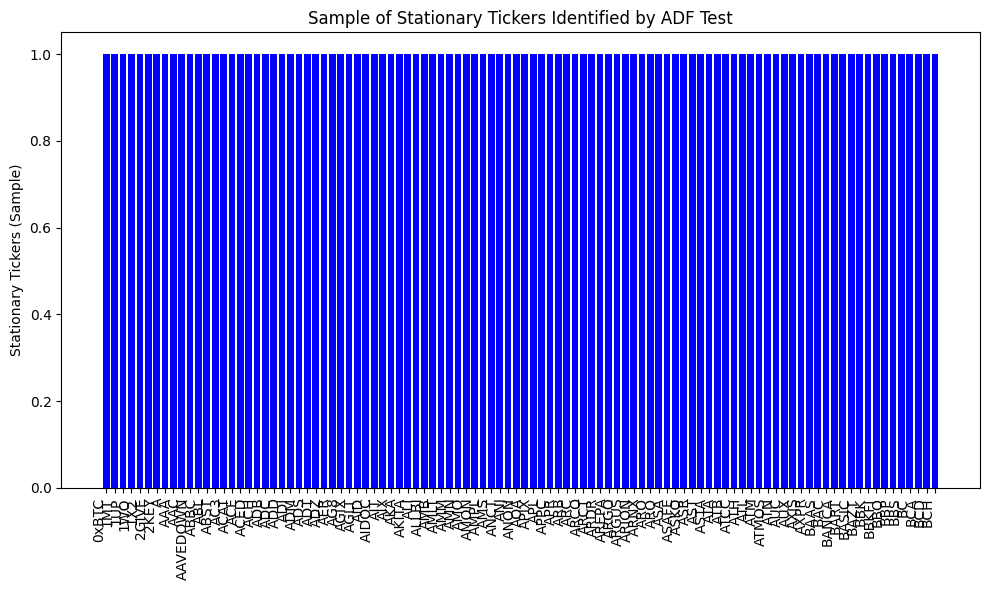

In [ ]:
# Sample stationary tickers for better readability
sample_size = min(100, len(stationary_tickers))  # Show up to 20 tickers
sampled_tickers = stationary_tickers[:sample_size]  # Take the first few tickers

# Plot only the sampled stationary tickers
plt.figure(figsize=(10, 6))
plt.bar(range(len(sampled_tickers)), [1] * len(sampled_tickers), color='blue')
plt.xticks(range(len(sampled_tickers)), sampled_tickers, rotation=90, ha='right')  # Rotate for better visibility
plt.ylabel('Stationary Tickers (Sample)')
plt.title('Sample of Stationary Tickers Identified by ADF Test')
plt.tight_layout()
plt.show()


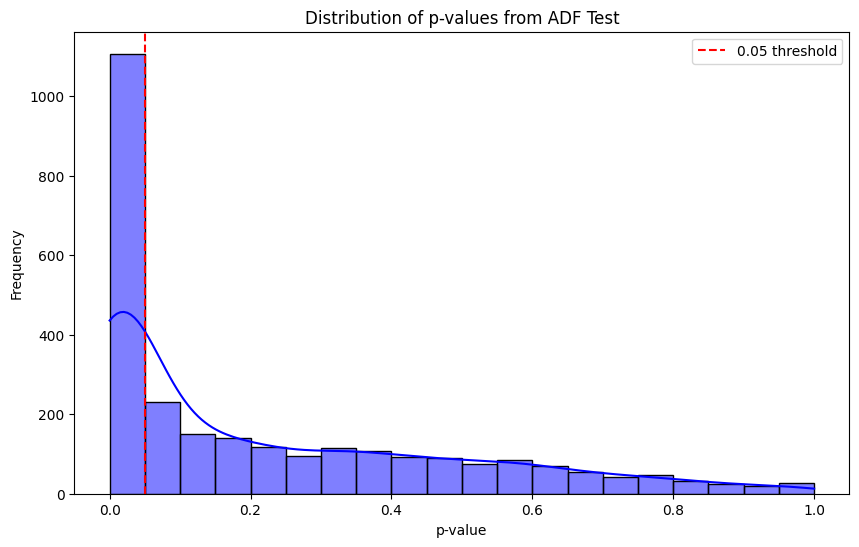

In [ ]:
# Visualization of ADF p-values
plt.figure(figsize=(10, 6))
sns.histplot(list(adf_results.values()), bins=20, kde=True, color='blue')  # Use adf_results from previous code
plt.axvline(0.05, color='red', linestyle='--', label='0.05 threshold')
plt.title('Distribution of p-values from ADF Test')
plt.xlabel('p-value')
plt.ylabel('Frequency')
plt.legend()
plt.show()

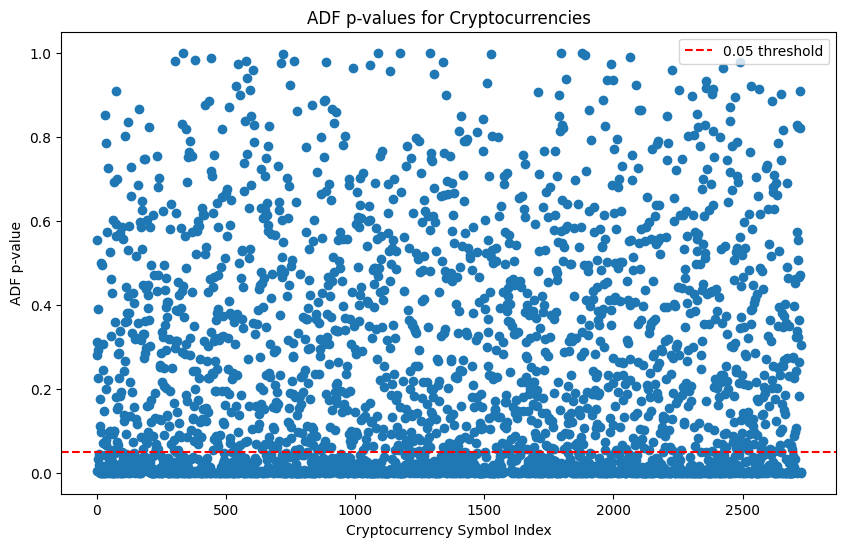

In [ ]:
# 1. Scatter plot of ADF p-values
plt.figure(figsize=(10, 6))
plt.scatter(range(len(adf_results)), list(adf_results.values()))
plt.axhline(0.05, color='red', linestyle='--', label='0.05 threshold')
plt.xlabel('Cryptocurrency Symbol Index')
plt.ylabel('ADF p-value')
plt.title('ADF p-values for Cryptocurrencies')
plt.legend()
plt.show()



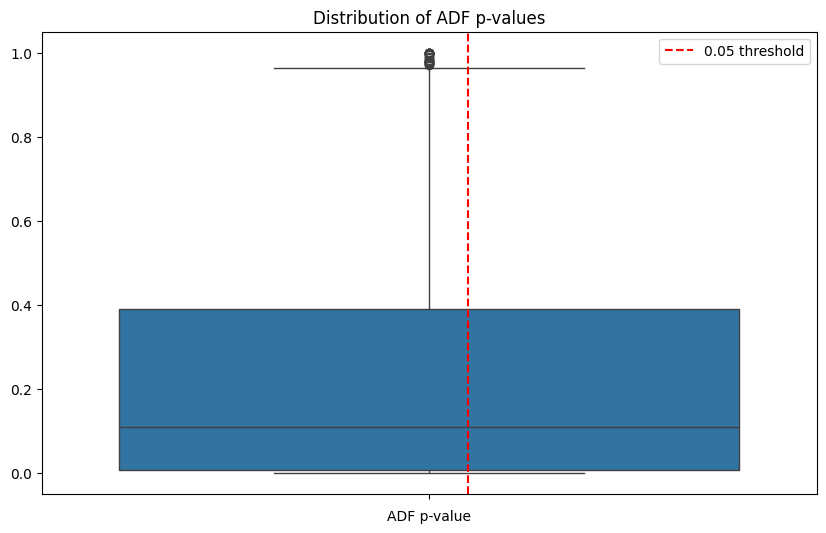

In [ ]:
# 2. Boxplot of ADF p-values
plt.figure(figsize=(10, 6))
sns.boxplot(list(adf_results.values()))
plt.axvline(0.05, color='red', linestyle='--', label='0.05 threshold')
plt.xlabel('ADF p-value')
plt.title('Distribution of ADF p-values')
plt.legend()
plt.show()


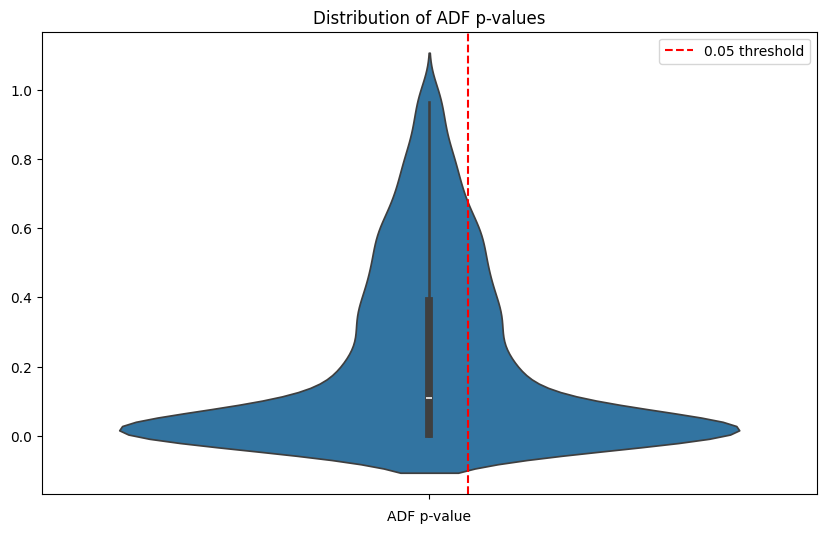

In [ ]:
# 3. Violin plot of ADF p-values
plt.figure(figsize=(10, 6))
sns.violinplot(list(adf_results.values()))
plt.axvline(0.05, color='red', linestyle='--', label='0.05 threshold')
plt.xlabel('ADF p-value')
plt.title('Distribution of ADF p-values')
plt.legend()
plt.show()

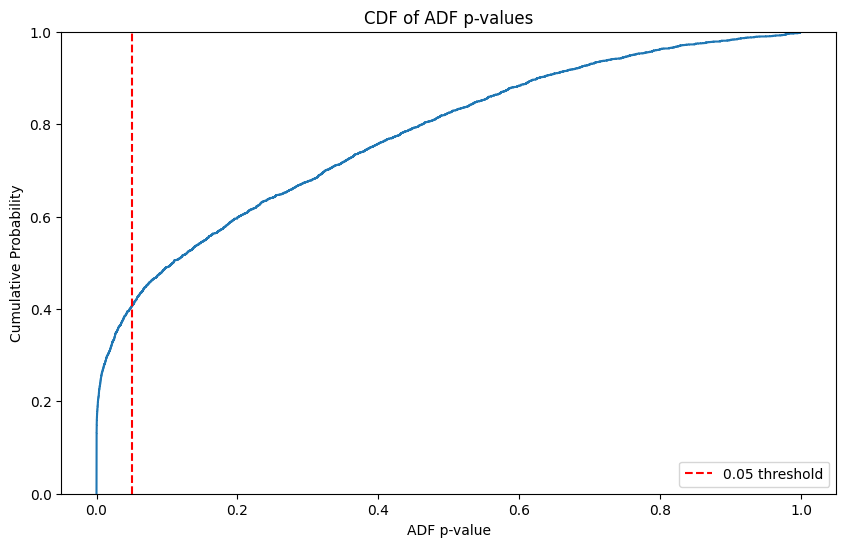

In [ ]:
# 4. Cumulative distribution function (CDF) plot
plt.figure(figsize=(10, 6))
sns.ecdfplot(list(adf_results.values()))
plt.axvline(0.05, color='red', linestyle='--', label='0.05 threshold')
plt.xlabel('ADF p-value')
plt.ylabel('Cumulative Probability')
plt.title('CDF of ADF p-values')
plt.legend()
plt.show()


In [ ]:
# 5. Analyze p-values less than and greater than 0.05
p_values = list(adf_results.values())
stationary_count = sum(1 for p_value in p_values if p_value < 0.05)
non_stationary_count = len(p_values) - stationary_count

print(f"Number of stationary time series (p-value < 0.05): {stationary_count}")
print(f"Number of non-stationary time series (p-value >= 0.05): {non_stationary_count}")


Number of stationary time series (p-value < 0.05): 1107
Number of non-stationary time series (p-value >= 0.05): 1620


In [ ]:
# Assuming 'df' is your original DataFrame and 'stationary_tickers' is the list of stationary tickers
stationary_df = df[df['Symbol'].isin(stationary_tickers)]

print(stationary_df)


               Date   Symbol      Open      High       Low     Close  \
5177     2015-02-25     USDT  1.210160  1.215490  1.209580  1.211100   
5178     2015-02-26     USDT  1.210420  1.212320  1.194710  1.205740   
5179     2015-03-02     USDT  0.571249  0.607890  0.568314  0.606502   
5180     2015-03-03     USDT  0.605129  0.606229  0.604416  0.606229   
5181     2015-03-06     USDT  1.000000  1.000000  1.000000  1.000000   
...             ...      ...       ...       ...       ...       ...   
2152873  2021-07-14  XTZBEAR  0.000320  0.000410  0.000316  0.000351   
2152874  2021-07-15  XTZBEAR  0.000350  0.000423  0.000341  0.000411   
2152875  2021-07-16  XTZBEAR  0.000408  0.000484  0.000382  0.000483   
2152876  2021-07-17  XTZBEAR  0.000483  0.000504  0.000445  0.000484   
2152877  2021-07-18  XTZBEAR  0.000484  0.000494  0.000435  0.000470   

                Volume   Market Cap  
5177          5.981930  304712.7600  
5178          5.955460  303364.1840  
5179          3.03250

In [ ]:
from tqdm import tqdm
autocorrelations = {}

# Use tqdm to track the progress of the loop
for symbol in tqdm(stationary_tickers, desc="Calculating autocorrelations"):
    close_prices = df[df['Symbol'] == symbol]['Close'].dropna()  # Drop missing values
    autocorrelations[symbol] = close_prices.autocorr(lag=1)  # Calculate autocorrelation with lag=1

# Print the autocorrelations dictionary (optional)
print(autocorrelations)


Calculating autocorrelations: 100%|██████████| 1107/1107 [05:40<00:00,  3.25it/s]

{'0xBTC': 0.9674126665677553, '1MT': 0.7573951497317938, '1UP': 0.8876811617270536, '1WO': 0.973999606956729, '1X2': 0.98214728779643, '2GIVE': 0.9907413269332681, '2KEY': 0.9452997465981652, 'A': 0.5788789713679073, 'AAA': 0.31097568941251963, 'AAC': 0.9937073712825784, 'AAVEDOWN': 0.9712886295626645, 'ABBC': 0.9686456979423046, 'ABL': 0.94554946247667, 'ABST': 0.439433069949398, 'AC3': 0.9956546665184594, 'ACAT': 0.9928117914297354, 'ACE': 0.9758841094953224, 'ACED': 0.9842320546740897, 'ACH': 0.9788804408684939, 'ADB': 0.9884891143697737, 'ADC': 0.9685603237482856, 'ADD': 0.941794538694729, 'ADI': 0.9847435999208014, 'ADM': 0.9603956570058495, 'ADS': 0.9635959979881451, 'ADT': 0.982882273292427, 'ADZ': 0.9855949818686227, 'AER': 0.7542590064354726, 'AG8': 0.9443122436163438, 'AGIX': 0.987512052917891, 'AGLT': 0.9535329221790605, 'AID': 0.9913312005808628, 'AIDOC': 0.9902401735096599, 'AIT': 0.9935018311099219, 'AIX': 0.9890120605508135, 'AKA': 0.994228211881458, 'AKITA': 0.894717720

In [ ]:
# Create a DataFrame for easier handling
individual_stats_df = pd.DataFrame({
    'Symbol': stationary_tickers,
    'ADF p-value': [adf_results[symbol] for symbol in stationary_tickers],
    'Autocorrelation': [autocorrelations[symbol] for symbol in stationary_tickers]
})

# Print the DataFrame
print(individual_stats_df)

       Symbol   ADF p-value  Autocorrelation
0       0xBTC  5.238173e-03         0.967413
1         1MT  3.286133e-02         0.757395
2         1UP  3.536576e-03         0.887681
3         1WO  1.912092e-02         0.974000
4         1X2  3.315192e-03         0.982147
...       ...           ...              ...
1102    mNFLX  3.186458e-02         0.878380
1103     mQQQ  5.140400e-03         0.876482
1104  onLEXpa  1.276154e-15         0.794502
1105     xBTC  3.163093e-04         0.635790
1106    yTSLA  7.503485e-04         0.940701

[1107 rows x 3 columns]


In [ ]:
# # prompt: save individual df stat df

# individual_stats_df.to_csv('individual_stats_df.csv', index=False)


In [ ]:
individual_stats_df=pd.read_csv('/content/individual_stats_df.csv')
individual_stats_df

,Symbol,ADF p-value,Autocorrelation
0,0xBTC,5.238173e-03,0.967413
1,1MT,3.286133e-02,0.757395
2,1UP,3.536576e-03,0.887681
3,1WO,1.912092e-02,0.974000
4,1X2,3.315192e-03,0.982147
...,...,...,...
1102,mNFLX,3.186458e-02,0.878380
1103,mQQQ,5.140400e-03,0.876482
1104,onLEXpa,1.276154e-15,0.794502
1105,xBTC,3.163093e-04,0.635790


In [ ]:
# Assuming individual_stats_df is your DataFrame containing ADF p-values and autocorrelation
# Filter for autocorrelation >= 0.99
selected_autocorr = individual_stats_df[individual_stats_df['Autocorrelation'] >= .99]['Symbol'].tolist()
len(selected_autocorr) # get the number of items in the list

186

In [ ]:
pd.Series(selected_autocorr).unique()

array(['2GIVE', 'AAC', 'AC3', 'ACAT', 'AID', 'AIDOC', 'AIT', 'AKA', 'ALI',
       'ARO', 'ATB', 'ATCC', 'ATN', 'AUC', 'BBO', 'BELA', 'BERRY', 'BFT',
       'BHD', 'BOX', 'BRD', 'BTCDOWN', 'BTS', 'BUY', 'CEN', 'CENNZ',
       'CHAT', 'CLO', 'CLOAK', 'CNN', 'CPT', 'CREVA', 'CS', 'CTXC',
       'CURE', 'DAB', 'DAM', 'DASH', 'DAT', 'DAX', 'DDK', 'DGB', 'DML',
       'DOPE', 'DPY', 'DRG', 'DXT', 'EDN', 'EGT', 'ELA', 'ELF', 'EM',
       'ENG', 'ERO', 'ETZ', 'FDZ', 'FOTA', 'FRST', 'FSN', 'FTI', 'FXT',
       'GAME', 'GEM', 'GIC', 'GIN', 'GLM', 'GNX', 'GOLD', 'GRC', 'GSC',
       'GTM', 'HER', 'HQX', 'HSC', 'HTDF', 'HYC', 'ICX', 'IDT', 'IMG',
       'INK', 'IPL', 'KCASH', 'KLKS', 'KMD', 'KNT', 'LBA', 'LCS', 'LET',
       'LML', 'LND', 'LXT', 'MAN', 'MDS', 'MER', 'MEXC', 'MHC', 'MIOTA',
       'MIX', 'MONA', 'MTN', 'MUE', 'MVP', 'NAV', 'NCASH', 'NCC', 'NKC',
       'NLG', 'OPEN', 'ORS', 'PAI', 'PCH', 'PEOS', 'PI', 'PINK', 'PLR',
       'POLY', 'POSW', 'POT', 'PPC', 'PRS', 'PTON', 'PXG', 'QKC', 

In [ ]:
import random
from itertools import combinations
random.seed(100)


# Generate all unique combinations (no overlapping and no same symbols)
all_combinations = list(combinations(selected_autocorr, 2))

# Check if there are enough pairs to sample 1000 pairs
if len(all_combinations) <500 :
    print(f"Error: Not enough unique pairs. Available pairs: {len(all_combinations)}")
else:
    # Randomly sample 1000 pairs from the combinations
    random_pairs = random.sample(all_combinations, 500)

    # Print the sampled pairs (you can remove or adjust this part as needed)
    for ticker_1, ticker_2 in random_pairs:
        print(f"{ticker_1} & {ticker_2}")


CLO & TRIO
PRS & ZPT
POT & VTC
CTXC & ZPT
MDS & SKM
IMG & PI
ORS & PI
TKY & ZSC
BRD & PLR
BTS & UCN
BBO & SSP
PPC & SAN
ETZ & RED
ALI & RDN
DDK & PXG
HSC & ZXC
DXT & MONA
GNX & SPD
DDK & MVP
CURE & TNC
CHAT & TPAY
DASH & DAT
IDT & RTE
KNT & TRIO
MONA & TDP
DGB & ZXC
MIOTA & NCC
PTON & WINGS
FRST & TCC
LCS & QSP
CPT & WXC
BUY & LML
DAB & HYC
2GIVE & ZXC
MER & RED
CLOAK & GIC
CREVA & LML
DASH & WPR
CS & KCASH
AID & RED
EGT & GTM
PLR & TMTG
LXT & THC
BUY & WINGS
ARO & MTN
ELF & QKC
TM2 & UCN
GAME & NCC
HTDF & ZXC
ICX & POLY
KLKS & REQ
SEELE & TMTG
MHC & TKY
ATCC & GAME
BHD & UT
GIN & GRC
ORS & STAC
EM & VTC
EGT & TNS
PAI & VIA
UBQ & UGAS
SPD & SPHTX
ENG & LML
CLOAK & ELF
ATB & PINK
HER & RTE
CREVA & UCN
ARO & WICC
FRST & QUO
BTS & TIC
ARO & DOPE
DOPE & WXC
GNX & TOKO
YAP & ZPT
DOPE & KNT
IPL & TDP
HSC & SEELE
PPC & QUN
AC3 & DPY
BTCDOWN & KMD
REQ & UBQ
DASH & XRP
BTS & LCS
DGB & RUFF
AKA & XEM
MAN & RDN
BOX & KNT
MHC & PINK
CNN & DAB
RTE & SPHTX
AIT & ZXC
PINK & RDN
CREVA & DGB
ALI & XMCT

In [ ]:
from statsmodels.tsa.stattools import coint

# Function to calculate cointegration between two symbols
def calculate_cointegration(symbol1, symbol2, df):
    # Extract the 'Close' prices for the two symbols
    series1 = df[df['Symbol'] == symbol1]['Close'].dropna().values
    series2 = df[df['Symbol'] == symbol2]['Close'].dropna().values

    # Align the series by trimming them to the same length (taking the shortest available)
    min_length = min(len(series1), len(series2))
    series1, series2 = series1[-min_length:], series2[-min_length:]

    # Perform the cointegration test
    coint_p_value = coint(series1, series2)[1]

    # Return the symbols and the p-value
    return symbol1, symbol2, coint_p_value


In [ ]:
from tqdm import tqdm

# Store cointegration results
cointegration_results = []

# Use tqdm to track the random pairs processing
for symbol1, symbol2 in tqdm(random_pairs, desc="Testing cointegration on random pairs"):
    p_value = calculate_cointegration(symbol1, symbol2, df)  # Pass 'df' to the function

    # Append the result if the p-value is below the threshold for cointegration
    if p_value[2] < 0.05:  # Cointegration significance threshold
        cointegration_results.append(p_value)

# Sort by p-value to find the best cointegrated pairs
best_pairs = sorted(cointegration_results, key=lambda x: x[2])

# Display the top cointegrated pairs
print("Top cointegrated pairs:", best_pairs[:10])

Testing cointegration on random pairs: 100%|██████████| 500/500 [04:38<00:00,  1.80it/s]

Top cointegrated pairs: [('BERRY', 'DXT', 9.383919344315103e-27), ('MIX', 'PINK', 1.814004526229856e-21), ('KNT', 'MIOTA', 1.1398837620900376e-20), ('MIX', 'WICC', 5.831640617500326e-20), ('HER', 'RTE', 1.8280268752359297e-19), ('FRST', 'FSN', 1.5334236611843847e-16), ('KNT', 'TRIO', 1.7874965339282987e-16), ('DAT', 'PLR', 2.5611460731147188e-14), ('GNX', 'SPD', 8.202150065614732e-14), ('SKM', 'SPC', 2.1466284892984987e-13)]


In [ ]:
best_pairs

[('BERRY', 'DXT', 9.383919344315103e-27),
 ('MIX', 'PINK', 1.814004526229856e-21),
 ('KNT', 'MIOTA', 1.1398837620900376e-20),
 ('MIX', 'WICC', 5.831640617500326e-20),
 ('HER', 'RTE', 1.8280268752359297e-19),
 ('FRST', 'FSN', 1.5334236611843847e-16),
 ('KNT', 'TRIO', 1.7874965339282987e-16),
 ('DAT', 'PLR', 2.5611460731147188e-14),
 ('GNX', 'SPD', 8.202150065614732e-14),
 ('SKM', 'SPC', 2.1466284892984987e-13),
 ('PINK', 'RDN', 5.245577357195708e-13),
 ('RED', 'WINGS', 1.689132800180734e-12),
 ('MER', 'RDN', 4.7513939981820185e-12),
 ('GRC', 'MDS', 7.932189732471335e-12),
 ('BRD', 'PLR', 1.7618783233803196e-11),
 ('DPY', 'UP', 3.8255351007261964e-11),
 ('KNT', 'VERI', 9.428639414731054e-11),
 ('MIX', 'RTE', 1.547692920997332e-10),
 ('MUE', 'ZLA', 6.283414595578094e-10),
 ('BBO', 'SKM', 1.082499194596145e-09),
 ('AC3', 'DPY', 1.1291488709020947e-09),
 ('RDN', 'UBQ', 3.1219345361869908e-09),
 ('DPY', 'NCC', 3.4033390371196204e-09),
 ('ORS', 'RDN', 5.2206796738946825e-09),
 ('CLOAK', 'ELF'

In [ ]:
top_five_pairs = sorted(cointegration_results, key=lambda x: x[2])[:5]

# Display the top 5 pairs
print("Top 5 cointegrated pairs:")
for symbol1, symbol2, p_value in top_five_pairs:
    print(f"{symbol1} & {symbol2} - p-value: {p_value}")

Top 5 cointegrated pairs:
BERRY & DXT - p-value: 9.383919344315103e-27
MIX & PINK - p-value: 1.814004526229856e-21
KNT & MIOTA - p-value: 1.1398837620900376e-20
MIX & WICC - p-value: 5.831640617500326e-20
HER & RTE - p-value: 1.8280268752359297e-19


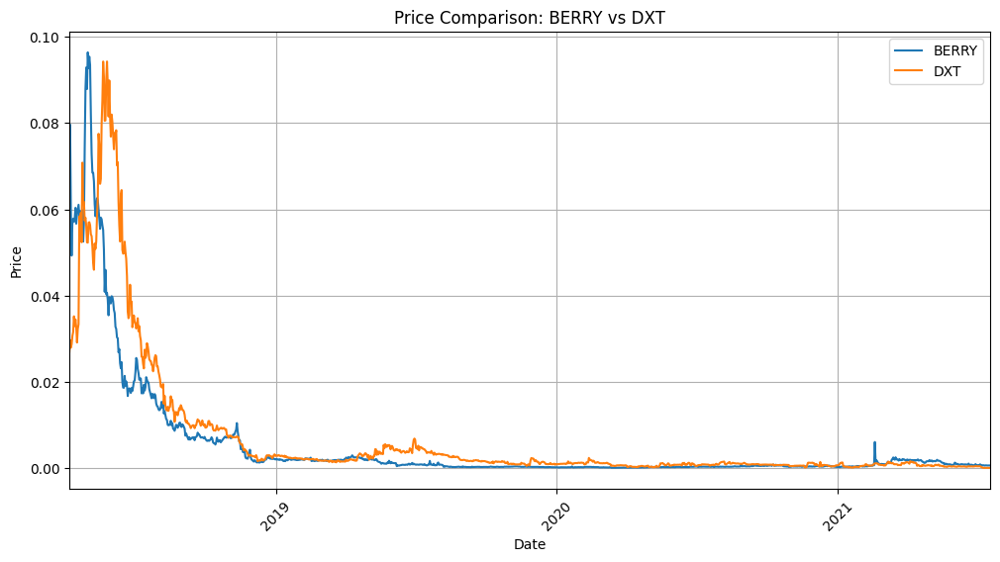

Hedge Ratio for BERRY and DXT: 0.7503303975552978


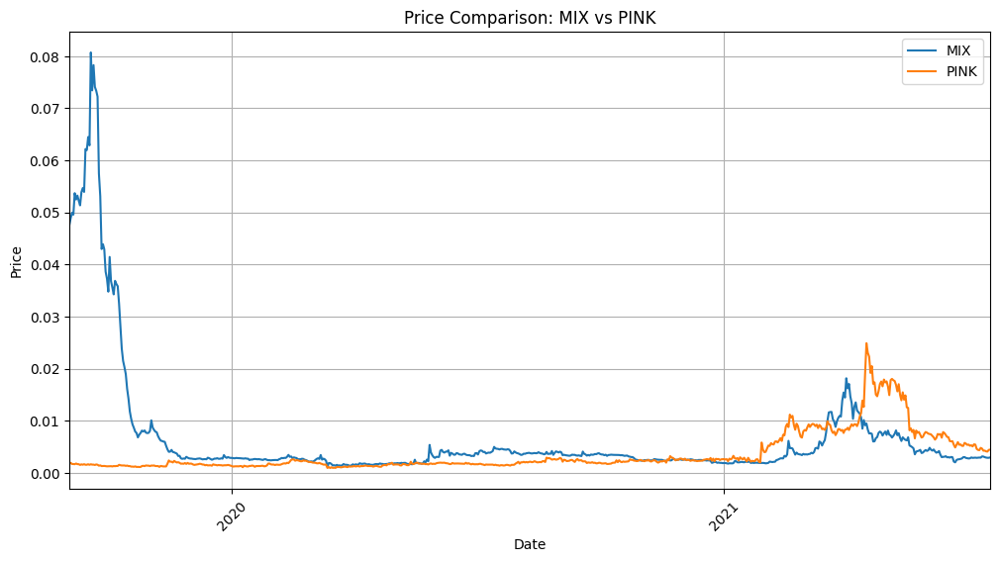

Hedge Ratio for MIX and PINK: -0.0746559911428834


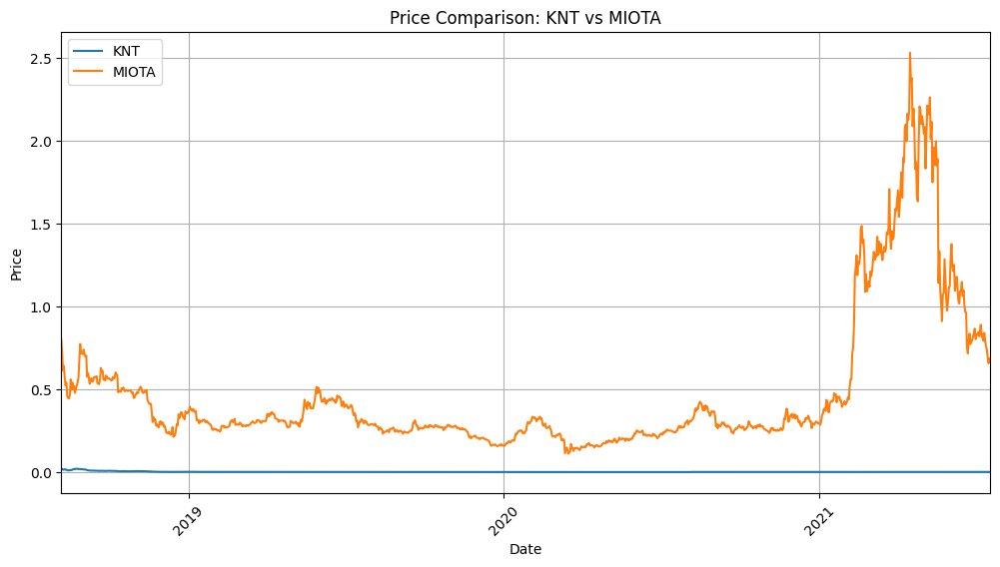

Hedge Ratio for KNT and MIOTA: 0.0007289757613702183


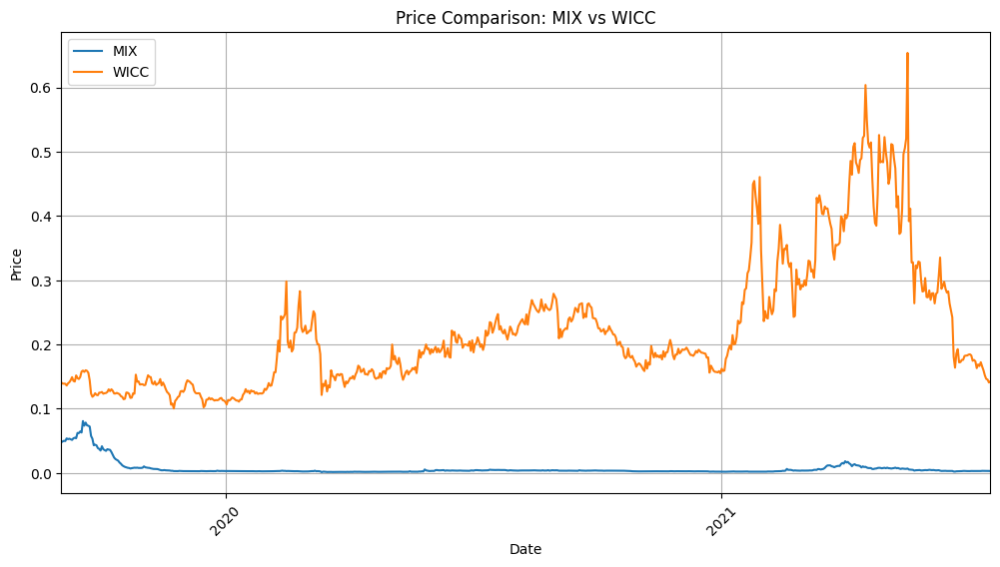

Hedge Ratio for MIX and WICC: -0.009462423212793338


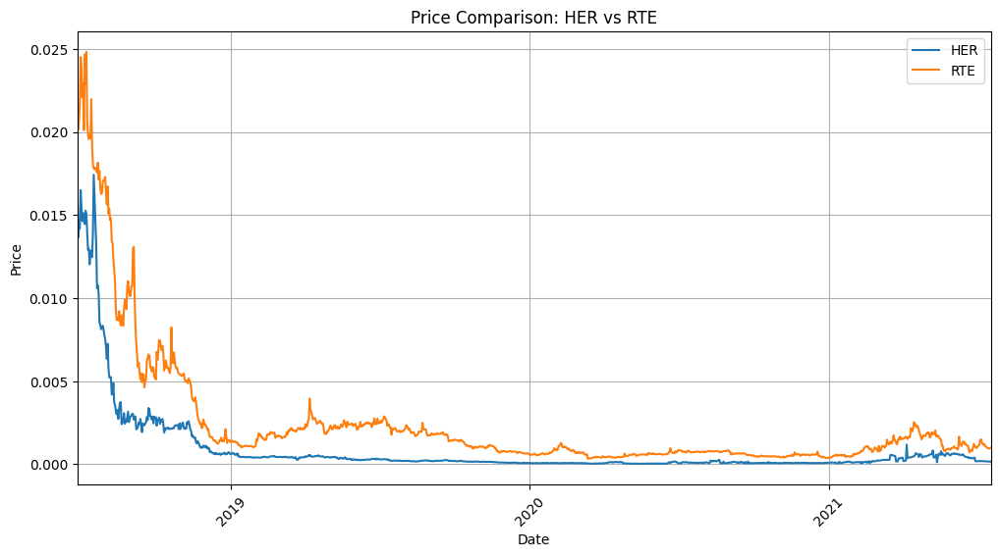

Hedge Ratio for HER and RTE: 0.575376773286134


In [ ]:
import statsmodels.api as sm
import matplotlib.dates as mdates
import matplotlib.pyplot as plt

# Analyze relationships for the top 5 pairs
for symbol1, symbol2, p_value in top_five_pairs:
    # Get the closing prices
    series1 = df[df['Symbol'] == symbol1]['Close'].dropna()
    series2 = df[df['Symbol'] == symbol2]['Close'].dropna()

    # Align the two series
    min_length = min(len(series1), len(series2))
    series1, series2 = series1[-min_length:], series2[-min_length:]

    # Ensure the index is of datetime type and align indices
    series1.index = pd.to_datetime(series1.index)
    series2.index = pd.to_datetime(series2.index)
    series1, series2 = series1.align(series2, join='inner') # Align indices

    # Convert the index to matplotlib dates
    dates1 = mdates.date2num(series1.index.to_pydatetime())
    dates2 = mdates.date2num(series2.index.to_pydatetime())

    # Plotting the price series
    plt.figure(figsize=(12, 6))
    plt.plot(dates1, series1.values, label=symbol1) # Use .values to get the array of values
    plt.plot(dates2, series2.values, label=symbol2) # Use .values to get the array of values
    plt.title(f'Price Comparison: {symbol1} vs {symbol2}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid()

    # Set x-ticks to display only the year
    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    plt.xticks(rotation=45)

    # Set x-axis limits to the desired range
    plt.xlim(dates1[0], dates1[-1])

    plt.show()

    # Calculate hedge ratio using OLS regression
    X = sm.add_constant(series2)  # Add constant term for OLS
    model = sm.OLS(series1, X).fit()
    hedge_ratio = model.params[1]

    print(f"Hedge Ratio for {symbol1} and {symbol2}: {hedge_ratio}")

In [ ]:
# Assuming 'best_pairs' is the list of tuples containing (symbol1, symbol2, p-value)
df_cointegration_results = pd.DataFrame(best_pairs, columns=['Symbol1', 'Symbol2', 'Cointegration_P_Value'])

# Print the DataFrame
print(df_cointegration_results)


    Symbol1 Symbol2  Cointegration_P_Value
0     BERRY     DXT           9.383919e-27
1       MIX    PINK           1.814005e-21
2       KNT   MIOTA           1.139884e-20
3       MIX    WICC           5.831641e-20
4       HER     RTE           1.828027e-19
..      ...     ...                    ...
262     HYC    PINK           4.698338e-02
263     MHC     TKY           4.825796e-02
264    DOPE     WXC           4.906916e-02
265     DDK     MVP           4.919704e-02
266     AKA     BBO           4.929264e-02

[267 rows x 3 columns]


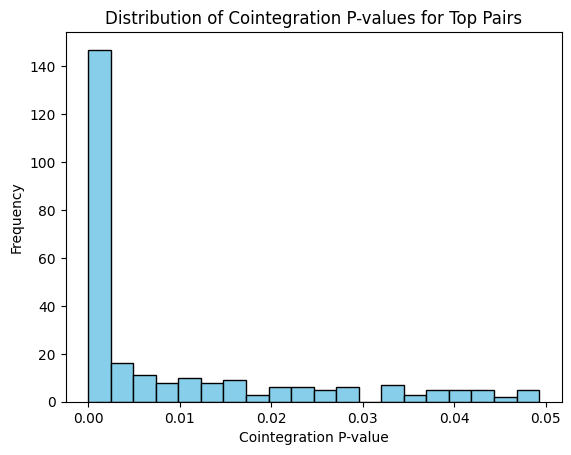

In [ ]:
# Extract p-values for visualization
p_values = [pair[2] for pair in best_pairs]

# Create a histogram of p-values
plt.hist(p_values, bins=20, color='skyblue', edgecolor='black')
plt.xlabel('Cointegration P-value')
plt.ylabel('Frequency')
plt.title('Distribution of Cointegration P-values for Top Pairs')
plt.show()


<Figure size 1200x600 with 0 Axes>

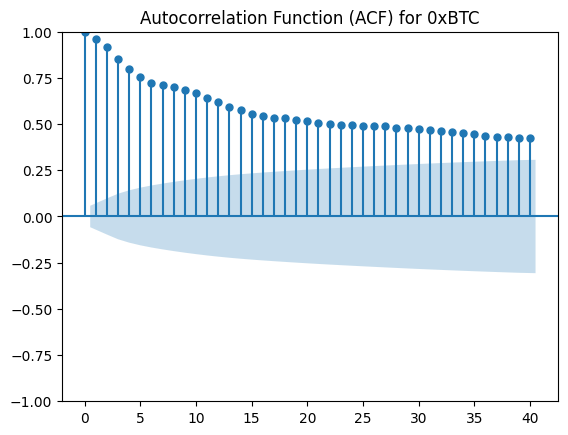

<Figure size 1200x600 with 0 Axes>

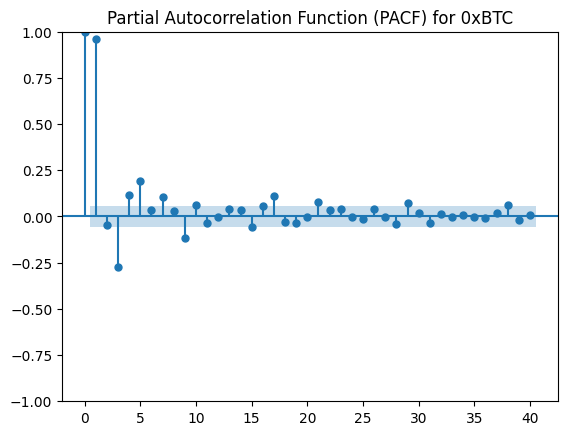

<Figure size 1200x600 with 0 Axes>

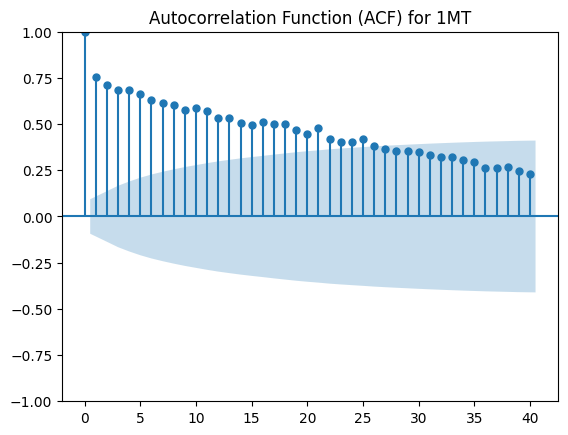

<Figure size 1200x600 with 0 Axes>

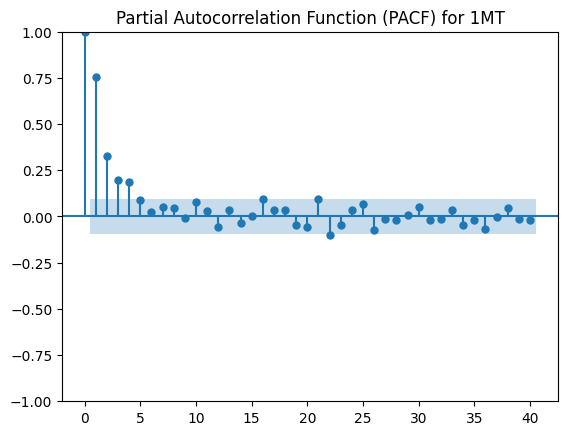

<Figure size 1200x600 with 0 Axes>

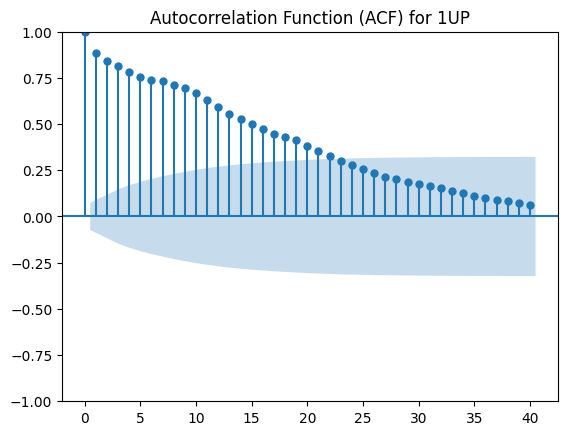

<Figure size 1200x600 with 0 Axes>

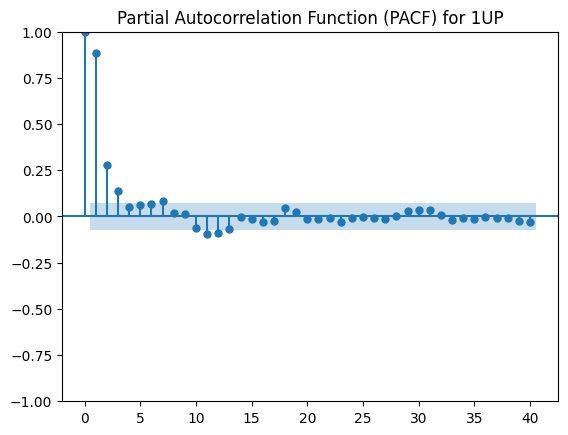

<Figure size 1200x600 with 0 Axes>

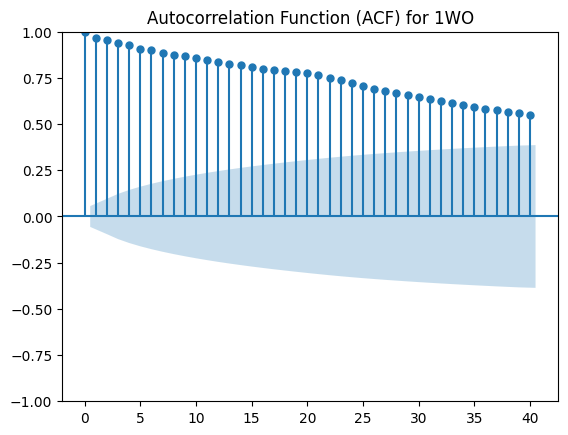

<Figure size 1200x600 with 0 Axes>

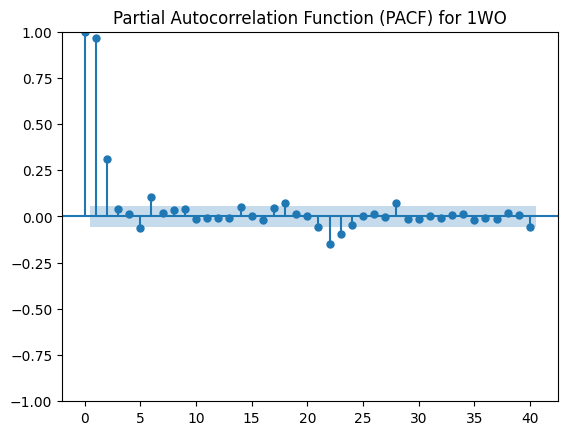

<Figure size 1200x600 with 0 Axes>

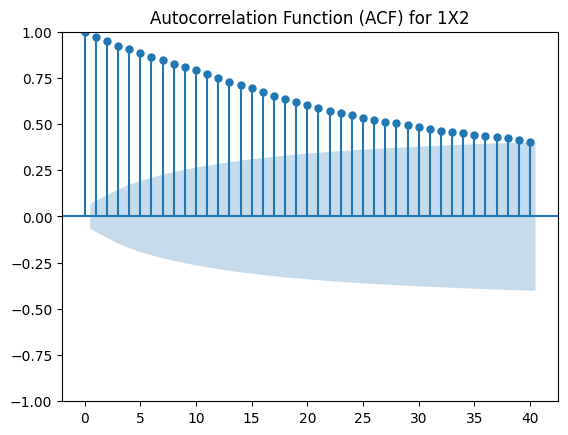

<Figure size 1200x600 with 0 Axes>

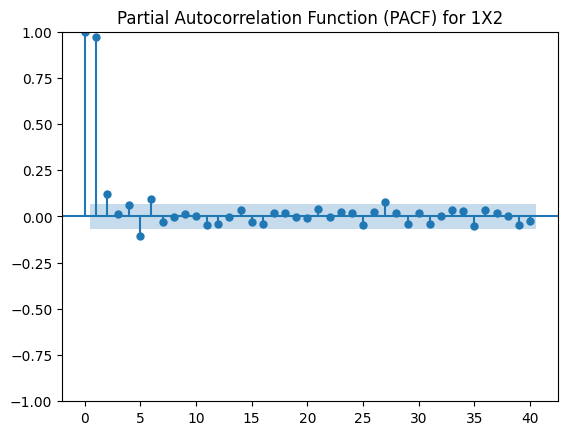

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Assuming 'df' is your DataFrame and 'stationary_tickers' is your list of stationary tickers

for symbol in stationary_tickers[:5]:  # Analyze ACF and PACF for the first 5 stationary tickers
    close_prices = df[df['Symbol'] == symbol]['Close'].dropna()

    # ACF plot
    plt.figure(figsize=(12, 6))
    plot_acf(close_prices, lags=40)  # You can adjust the number of lags as needed
    plt.title(f'Autocorrelation Function (ACF) for {symbol}')
    plt.show()

    # PACF plot
    plt.figure(figsize=(12, 6))
    plot_pacf(close_prices, lags=40)  # You can adjust the number of lags as needed
    plt.title(f'Partial Autocorrelation Function (PACF) for {symbol}')
    plt.show()


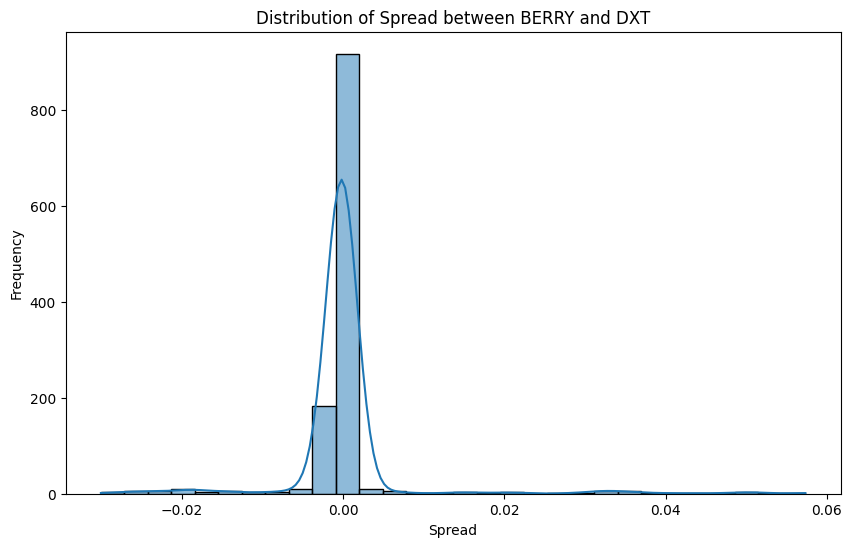

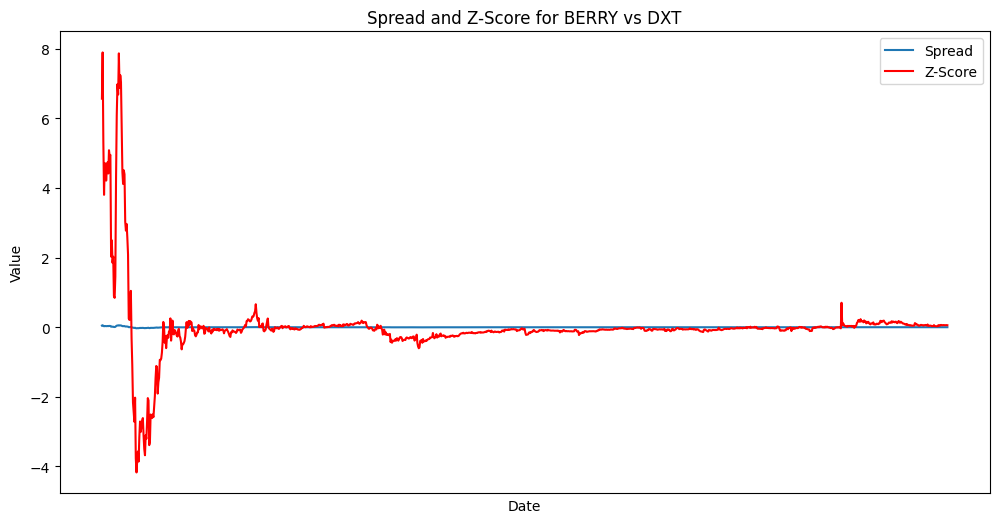

Spread Mean: 0.0001516700420994323, Spread Standard Deviation: 0.007245826852576261
Z-Score Mean: -2.074144766605797e-17, Z-Score Standard Deviation: 1.0000000000000004
********************************************************************************


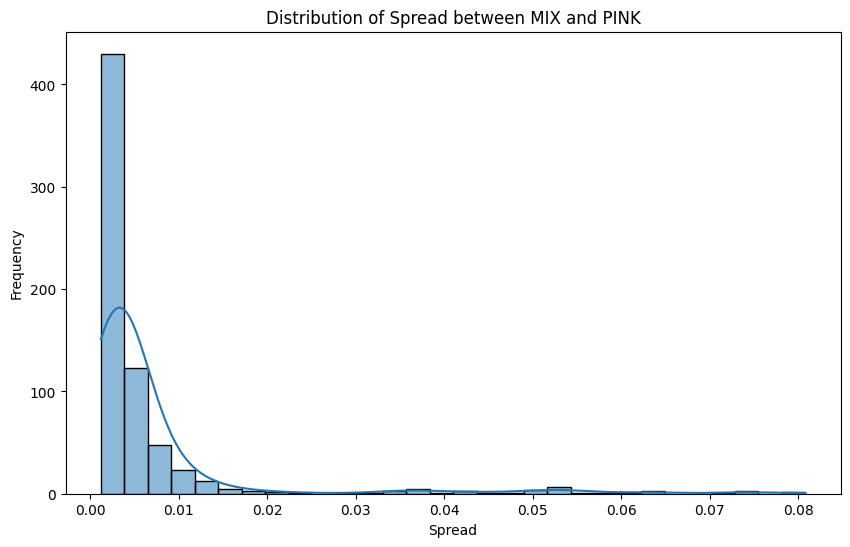

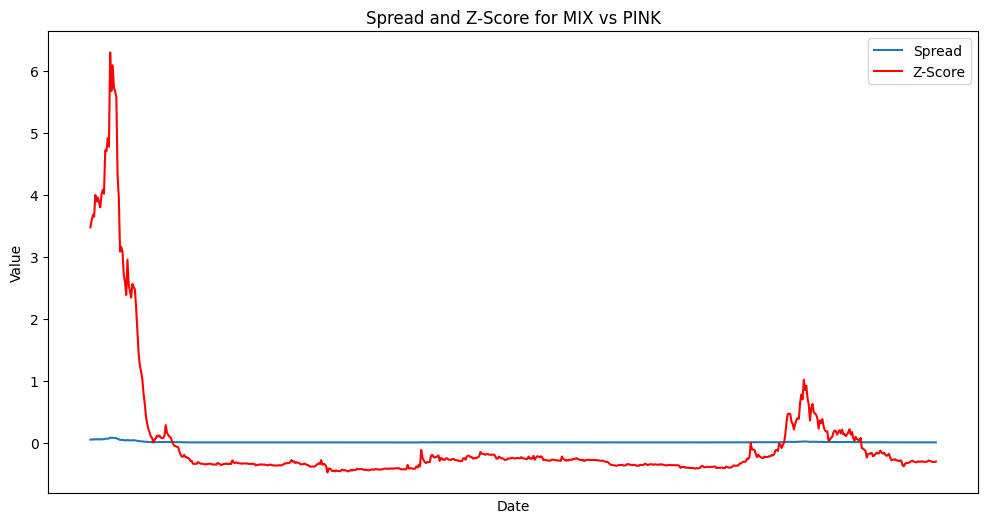

Spread Mean: 0.006887159326728772, Spread Standard Deviation: 0.011753085511836398
Z-Score Mean: -1.0357765827406708e-16, Z-Score Standard Deviation: 0.999999999999999
********************************************************************************


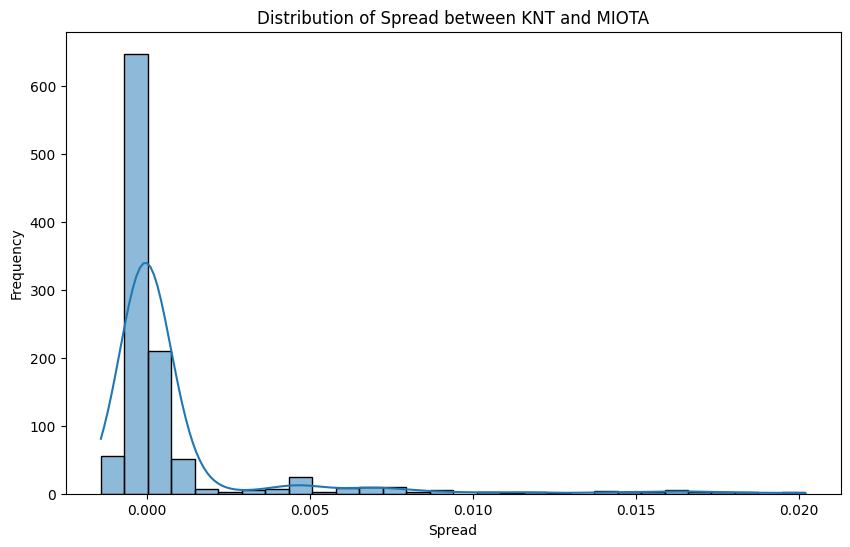

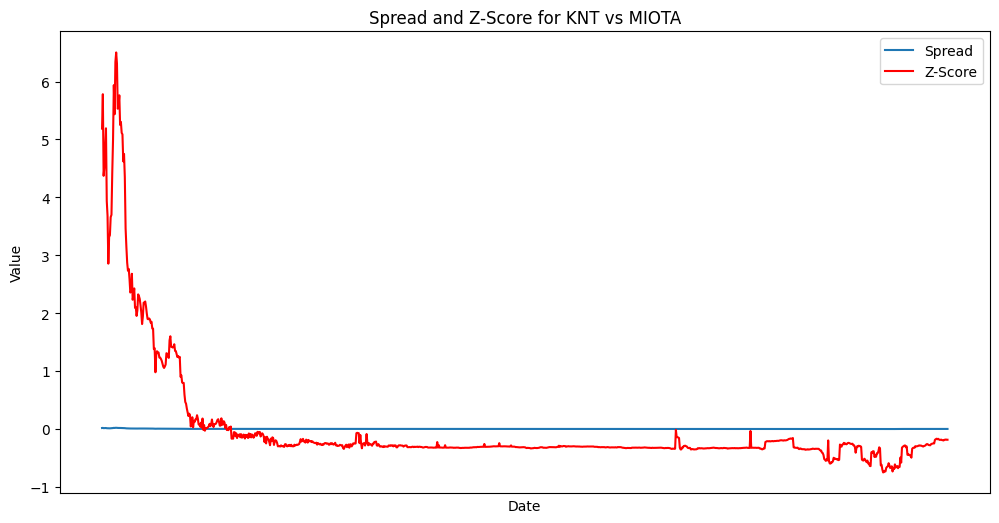

Spread Mean: 0.0008156436525677632, Spread Standard Deviation: 0.0029801454688091027
Z-Score Mean: 0.0, Z-Score Standard Deviation: 1.0000000000000013
********************************************************************************


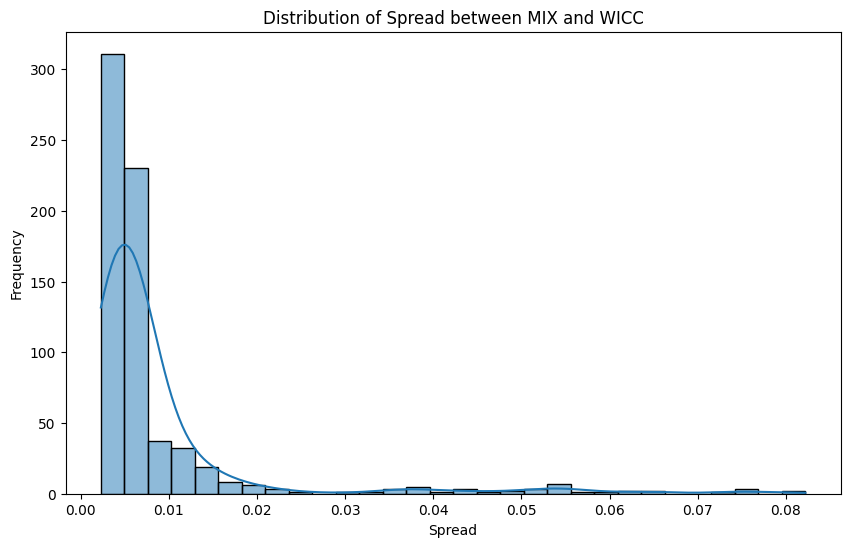

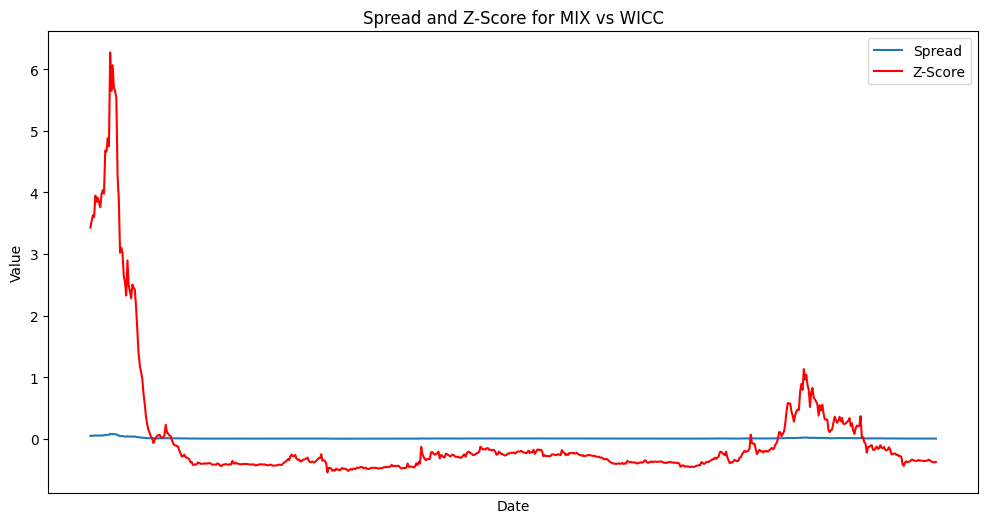

Spread Mean: 0.008695978903106704, Spread Standard Deviation: 0.01171889899137863
Z-Score Mean: 5.178882913703354e-17, Z-Score Standard Deviation: 0.9999999999999997
********************************************************************************


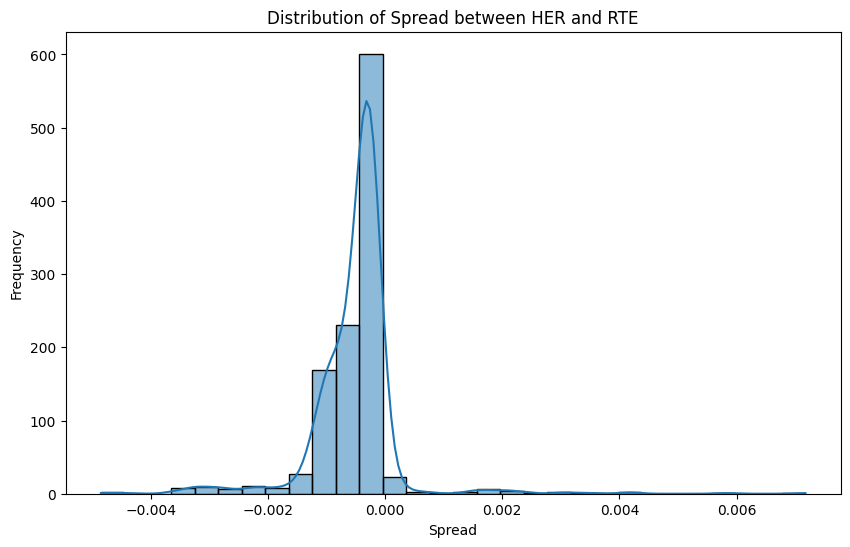

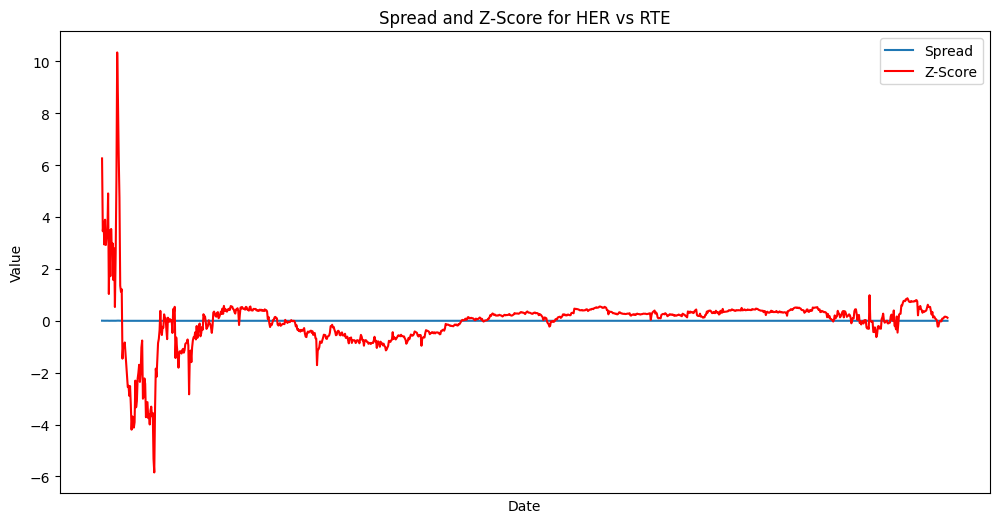

Spread Mean: -0.000506836774182165, Spread Standard Deviation: 0.0007424052857081954
Z-Score Mean: 0.0, Z-Score Standard Deviation: 0.9999999999999993
********************************************************************************


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import pandas as pd
from statsmodels.tsa.stattools import coint

# Assuming 'df' is your DataFrame, 'best_pairs' is the list of cointegrated pairs, and 'top_five_pairs' contains the top 5 pairs

for symbol1, symbol2, p_value in top_five_pairs:
    # Get the closing prices
    series1 = df[df['Symbol'] == symbol1]['Close'].dropna()
    series2 = df[df['Symbol'] == symbol2]['Close'].dropna()

    # Align the two series
    min_length = min(len(series1), len(series2))
    series1, series2 = series1[-min_length:], series2[-min_length:]

    # Ensure the index is of datetime type and align indices
    series1.index = pd.to_datetime(series1.index)
    series2.index = pd.to_datetime(series2.index)
    series1, series2 = series1.align(series2, join='inner') # Align indices

    # Calculate the spread using OLS regression
    X = sm.add_constant(series2)  # Add constant term for OLS

    # Ensure indices are aligned before fitting the model
    if not series1.index.equals(X.index):
        series1, X = series1.align(X, join='inner')

    model = sm.OLS(series1, X).fit()
    hedge_ratio = model.params[1]
    spread = series1 - hedge_ratio * series2

    # 2. Histogram of the Spread
    plt.figure(figsize=(10, 6))
    sns.histplot(spread, bins=30, kde=True)
    plt.title(f'Distribution of Spread between {symbol1} and {symbol2}')
    plt.xlabel('Spread')
    plt.ylabel('Frequency')
    plt.show()

    # 5. Time Series Plot of Spread and Z-Score
    spread_mean = spread.mean()
    spread_std = spread.std()
    zscore = (spread - spread_mean) / spread_std

    plt.figure(figsize=(12, 6))
    plt.plot(spread, label='Spread')
    plt.plot(zscore, label='Z-Score', color='red')
    plt.title(f'Spread and Z-Score for {symbol1} vs {symbol2}')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()
    plt.xticks([])  # Remove x-axis ticks for better readability

    plt.show()
    print(f"Spread Mean: {spread_mean}, Spread Standard Deviation: {spread_std}")
    print(f"Z-Score Mean: {zscore.mean()}, Z-Score Standard Deviation: {zscore.std()}")
    print('*'*80)

In [ ]:
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler

# Assuming top_five_pairs is a list of tuples (symbol1, symbol2, p_value)
# Initialize an empty DataFrame to store features for all pairs
combined_features = pd.DataFrame()

# Loop through each pair
for symbol1, symbol2, p_value in top_five_pairs:

    # Get the closing prices for both symbols
    series1 = df[df['Symbol'] == symbol1]['Close'].dropna()
    series2 = df[df['Symbol'] == symbol2]['Close'].dropna()

    # Align the two series
    min_length = min(len(series1), len(series2))
    series1, series2 = series1[-min_length:], series2[-min_length:]

    # Ensure the indices are aligned *before* adding a constant
    series1, series2 = series1.align(series2, join='inner')

    # Calculate the hedge ratio using OLS regression
    X = sm.add_constant(series2)  # Add constant term for OLS
    model = sm.OLS(series1, X).fit()
    hedge_ratio = model.params[1]

    # Calculate the spread (the price difference adjusted by the hedge ratio)
    spread = series1 - hedge_ratio * series2

    # Calculate the z-score of the spread
    spread_mean = spread.mean()
    spread_std = spread.std()
    zscore = (spread - spread_mean) / spread_std

    # Create a DataFrame with features
    features_df = pd.DataFrame({
        'Date': series1.index,  # Using index as date
        'Symbol1_Close': series1.values,
        'Symbol2_Close': series2.values,
        'Spread': spread.values,
        'Z-Score': zscore.values,
        'Hedge_Ratio': hedge_ratio
    })

    # Add more feature engineering columns if needed
    features_df['Spread_Change'] = features_df['Spread'].diff()  # Change in spread
    features_df['Z-Score_Change'] = features_df['Z-Score'].diff()  # Change in z-score

    # Add pair identifier
    features_df['Pair'] = f'{symbol1}-{symbol2}'

    # Concatenate the new features into the combined DataFrame
    combined_features = pd.concat([combined_features, features_df])

# Reset index of the final DataFrame
combined_features.reset_index(drop=True, inplace=True)

# Check the combined DataFrame
print(combined_features.head())

         Date  Symbol1_Close  Symbol2_Close    Spread   Z-Score  Hedge_Ratio  \
0  2018-04-07       0.067872       0.026837  0.047736  6.567116      0.75033   
1  2018-04-08       0.079644       0.029703  0.057356  7.894826      0.75033   
2  2018-04-09       0.059816       0.027954  0.038842  5.339631      0.75033   
3  2018-04-10       0.049283       0.028746  0.027714  3.803901      0.75033   
4  2018-04-11       0.057325       0.030662  0.034318  4.715311      0.75033   

   Spread_Change  Z-Score_Change       Pair  
0            NaN             NaN  BERRY-DXT  
1       0.009620        1.327710  BERRY-DXT  
2      -0.018514       -2.555195  BERRY-DXT  
3      -0.011128       -1.535730  BERRY-DXT  
4       0.006604        0.911410  BERRY-DXT  


In [ ]:
# Adding Lag Features (already implemented)
combined_features['Z-Score_Lag1'] = combined_features['Z-Score'].shift(1)
combined_features['Z-Score_Lag2'] = combined_features['Z-Score'].shift(2)
combined_features['Spread_Lag1'] = combined_features['Spread'].shift(1)

# Moving averages and rolling statistics
window_size = 10  # you can adjust this window size based on your needs

# Rolling Mean (Moving Average)
combined_features['Spread_MA'] = combined_features['Spread'].rolling(window=window_size).mean()
combined_features['Z-Score_MA'] = combined_features['Z-Score'].rolling(window=window_size).mean()

# Rolling Standard Deviation (Volatility)
combined_features['Spread_STD'] = combined_features['Spread'].rolling(window=window_size).std()
combined_features['Z-Score_STD'] = combined_features['Z-Score'].rolling(window=window_size).std()

# Rolling Correlation between Symbol1 and Symbol2 prices
combined_features['Rolling_Corr'] = combined_features['Symbol1_Close'].rolling(window=window_size).corr(combined_features['Symbol2_Close'])

# Rolling Max and Min to capture price range within the window
combined_features['Spread_Max'] = combined_features['Spread'].rolling(window=window_size).max()
combined_features['Spread_Min'] = combined_features['Spread'].rolling(window=window_size).min()

# Spread Change (percentage change)
combined_features['Spread_Change'] = combined_features['Spread'].pct_change()

# Z-Score Change (percentage change)
combined_features['Z-Score_Change'] = combined_features['Z-Score'].pct_change()

# Cumulative Sum of Spread (to track running total of spread movements)
combined_features['Spread_CumSum'] = combined_features['Spread'].cumsum()

# Optional: Drop rows with NaN values introduced by rolling windows
combined_features.dropna(inplace=True)

# Display the updated DataFrame with new features
print(combined_features.head())


          Date  Symbol1_Close  Symbol2_Close    Spread   Z-Score  Hedge_Ratio  \
9   2018-04-16       0.056676       0.032678  0.032157  4.417033      0.75033   
10  2018-04-17       0.058860       0.029134  0.037000  5.085469      0.75033   
11  2018-04-18       0.060005       0.032296  0.035772  4.916010      0.75033   
12  2018-04-19       0.061064       0.033379  0.036018  4.949974      0.75033   
13  2018-04-20       0.058644       0.058364  0.014851  2.028723      0.75033   

    Spread_Change  Z-Score_Change       Pair  Z-Score_Lag1  Z-Score_Lag2  \
9       -0.067329       -0.067626  BERRY-DXT      4.737407      4.560290   
10       0.150618        0.151331  BERRY-DXT      4.417033      4.737407   
11      -0.033186       -0.033322  BERRY-DXT      5.085469      4.417033   
12       0.006880        0.006909  BERRY-DXT      4.916010      5.085469   
13      -0.587670       -0.590155  BERRY-DXT      4.949974      4.916010   

    Spread_Lag1  Spread_MA  Z-Score_MA  Spread_STD  Z-Sc

In [ ]:
# Fill NaN values created by shifting
combined_features.fillna('mean', inplace=True)

# Optionally, you can scale the features using StandardScaler
scaler = StandardScaler()
scaled_columns = ['Spread', 'Z-Score', 'Spread_Change', 'Z-Score_Change', 'Z-Score_Lag1', 'Z-Score_Lag2', 'Spread_Lag1']
combined_features[scaled_columns] = scaler.fit_transform(combined_features[scaled_columns])

# Now you have a unified DataFrame with the spread, z-score, and other features for each pair
print(combined_features.head())

          Date  Symbol1_Close  Symbol2_Close    Spread   Z-Score  Hedge_Ratio  \
9   2018-04-16       0.056676       0.032678  3.706978  4.547968      0.75033   
10  2018-04-17       0.058860       0.029134  4.307913  5.234698      0.75033   
11  2018-04-18       0.060005       0.032296  4.155567  5.060601      0.75033   
12  2018-04-19       0.061064       0.033379  4.186100  5.095494      0.75033   
13  2018-04-20       0.058644       0.058364  1.559845  2.094292      0.75033   

    Spread_Change  Z-Score_Change       Pair  Z-Score_Lag1  Z-Score_Lag2  \
9       -0.022276       -0.022727  BERRY-DXT      4.863980      4.670781   
10       0.034589        0.001963  BERRY-DXT      4.535657      4.851877   
11      -0.013367       -0.018859  BERRY-DXT      5.220679      4.524306   
12      -0.002914       -0.014322  BERRY-DXT      5.047015      5.207757   
13      -0.158040       -0.081649  BERRY-DXT      5.081821      5.034491   

    Spread_Lag1  Spread_MA  Z-Score_MA  Spread_STD  Z-Sc

In [ ]:
combined_features.tail()

,Date,Symbol1_Close,Symbol2_Close,Spread,Z-Score,Hedge_Ratio,Spread_Change,Z-Score_Change,Pair,Z-Score_Lag1,Z-Score_Lag2,Spread_Lag1,Spread_MA,Z-Score_MA,Spread_STD,Z-Score_STD,Rolling_Corr,Spread_Max,Spread_Min,Spread_CumSum
4762,2021-07-14,0.000160,0.000959,-0.331513,0.168459,0.575377,-0.023209,0.024846,HER-RTE,0.125709,0.095142,-0.335580,-0.000515,-0.010654,0.000097,0.130314,0.857883,-0.000392,-0.000672,11.186111
4763,2021-07-15,0.000153,0.000940,-0.331010,0.174063,0.575377,-0.007402,-0.011112,HER-RTE,0.167044,0.124471,-0.331871,-0.000486,0.027533,0.000087,0.116662,0.925676,-0.000388,-0.000667,11.185723
4764,2021-07-16,0.000150,0.000949,-0.331874,0.164429,0.575377,-0.000031,-0.021725,HER-RTE,0.172635,0.165712,-0.331369,-0.000459,0.064165,0.000063,0.084856,0.922608,-0.000388,-0.000565,11.185328
4765,2021-07-17,0.000152,0.000962,-0.332664,0.155623,0.575377,-0.000508,-0.021533,HER-RTE,0.163025,0.171290,-0.332232,-0.000443,0.086145,0.000053,0.071296,0.884091,-0.000388,-0.000523,11.184926
4766,2021-07-18,0.000152,0.000994,-0.334989,0.129692,0.575377,0.007465,-0.035188,HER-RTE,0.154241,0.161701,-0.333020,-0.000433,0.098985,0.000047,0.062713,0.862406,-0.000388,-0.000523,11.184506


In [ ]:
combined_features.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4758 entries, 9 to 4766
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Date            4758 non-null   object 
 1   Symbol1_Close   4758 non-null   float64
 2   Symbol2_Close   4758 non-null   float64
 3   Spread          4758 non-null   float64
 4   Z-Score         4758 non-null   float64
 5   Hedge_Ratio     4758 non-null   float64
 6   Spread_Change   4758 non-null   float64
 7   Z-Score_Change  4758 non-null   float64
 8   Pair            4758 non-null   object 
 9   Z-Score_Lag1    4758 non-null   float64
 10  Z-Score_Lag2    4758 non-null   float64
 11  Spread_Lag1     4758 non-null   float64
 12  Spread_MA       4758 non-null   float64
 13  Z-Score_MA      4758 non-null   float64
 14  Spread_STD      4758 non-null   float64
 15  Z-Score_STD     4758 non-null   float64
 16  Rolling_Corr    4758 non-null   float64
 17  Spread_Max      4758 non-null   float6

In [ ]:
combined_features['Pair'].unique()

array(['BERRY-DXT', 'MIX-PINK', 'KNT-MIOTA', 'MIX-WICC', 'HER-RTE'],
      dtype=object)

In [ ]:
training_df=combined_features.copy()
training_df.head()

,Date,Symbol1_Close,Symbol2_Close,Spread,Z-Score,Hedge_Ratio,Spread_Change,Z-Score_Change,Pair,Z-Score_Lag1,Z-Score_Lag2,Spread_Lag1,Spread_MA,Z-Score_MA,Spread_STD,Z-Score_STD,Rolling_Corr,Spread_Max,Spread_Min,Spread_CumSum
9,2018-04-16,0.056676,0.032678,3.706978,4.547968,0.75033,-0.022276,-0.022727,BERRY-DXT,4.863980,4.670781,3.987456,0.037062,5.094021,0.008937,1.233396,-0.267480,0.057356,0.027714,0.370621
10,2018-04-17,0.058860,0.029134,4.307913,5.234698,0.75033,0.034589,0.001963,BERRY-DXT,4.535657,4.851877,3.699912,0.035988,4.945856,0.008120,1.120611,-0.104226,0.057356,0.027714,0.407621
11,2018-04-18,0.060005,0.032296,4.155567,5.060601,0.75033,-0.013367,-0.018859,BERRY-DXT,5.220679,4.524306,4.299850,0.033830,4.647975,0.003167,0.437043,0.289060,0.038842,0.027714,0.443393
12,2018-04-19,0.061064,0.033379,4.186100,5.095494,0.75033,-0.002914,-0.014322,BERRY-DXT,5.047015,5.207757,4.147756,0.033548,4.609009,0.002771,0.382491,0.542704,0.037000,0.027714,0.479411
13,2018-04-20,0.058644,0.058364,1.559845,2.094292,0.75033,-0.158040,-0.081649,BERRY-DXT,5.081821,5.034491,4.178240,0.032261,4.431491,0.006395,0.882625,0.040238,0.037000,0.014851,0.494263


In [ ]:
training_df['Pair'] = training_df['Pair'].str.strip()

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Assuming 'training_df' is your DataFrame
le = LabelEncoder()
training_df['Pair_Encoded'] = le.fit_transform(training_df['Pair'])

# Print the unique encoded values and their corresponding original values
print(dict(zip(le.transform(training_df['Pair'].unique()), le.classes_)))


{0: 'BERRY-DXT', 3: 'HER-RTE', 2: 'KNT-MIOTA', 4: 'MIX-PINK', 1: 'MIX-WICC'}


In [ ]:
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor

# Features and target (spread)
features = ['Z-Score', 'Hedge_Ratio', 'Spread_Change', 'Z-Score_Lag1', 'Z-Score_Lag2',
            'Spread_Lag1', 'Spread_MA', 'Z-Score_MA', 'Spread_STD', 'Z-Score_STD',
            'Rolling_Corr', 'Spread_Max', 'Spread_Min', 'Spread_CumSum','Pair_Encoded']
target = 'Spread'

# Forecasting horizon
forecast_horizon = 50  # Next 50 days forecast

# List of pairs
pairs = ['BERRY-DXT','HER-RTE', 'KNT-MIOTA','MIX-PINK', 'MIX-WICC']


In [ ]:
def create_xgboost_model(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_depth': trial.suggest_int('max_depth', 3, 15),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'gamma': trial.suggest_float('gamma', 0, 10),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'reg_lambda': trial.suggest_loguniform('reg_lambda', 1e-3, 10),
        'reg_alpha': trial.suggest_loguniform('reg_alpha', 1e-3, 10)
    }
    return XGBRegressor(**params)


In [ ]:
def create_catboost_model(trial):
    params = {
        'iterations': trial.suggest_int('iterations', 100, 1000),
        'depth': trial.suggest_int('depth', 4, 10),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1e-5, 1e1),
        'random_strength': trial.suggest_float('random_strength', 1e-9, 10),
        'bagging_temperature': trial.suggest_float('bagging_temperature', 0, 1),
        'border_count': trial.suggest_int('border_count', 32, 255),
    }
    return CatBoostRegressor(**params, silent=True)


In [ ]:
def create_lightgbm_model(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_depth': trial.suggest_int('max_depth', 3, 15),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
        'num_leaves': trial.suggest_int('num_leaves', 20, 200),
        'feature_fraction': trial.suggest_float('feature_fraction', 0.5, 1.0),
        'bagging_fraction': trial.suggest_float('bagging_fraction', 0.5, 1.0),
        'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-3, 10),
        'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-3, 10),
        'min_child_samples': trial.suggest_int('min_child_samples', 20, 100),  # Increase to prevent overfitting
        'min_split_gain': trial.suggest_float('min_split_gain', 0.01, 0.1),   # Minimum gain required for a split
        'force_col_wise': True,  # Force LightGBM to use column-wise split, as recommended in logs
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 1, 50)
    }
    return LGBMRegressor(**params)


In [ ]:
def objective(trial, model_name, X_train, y_train, X_val, y_val):
    """Objective function for Optuna optimization without KFold cross-validation."""

    if model_name == 'catboost':
        model = create_catboost_model(trial)
    elif model_name == 'xgboost':
        model = create_xgboost_model(trial)
    elif model_name == 'lightgbm':
        model = create_lightgbm_model(trial)
    else:
        raise ValueError(f"Invalid model name: {model_name}")

    model.fit(X_train, y_train, eval_set=[(X_val, y_val)])  # Add early stopping

    preds = model.predict(X_val)
    mse_score = mean_squared_error(y_val, preds)

    return mse_score


In [ ]:
def optimize_model(pair, model_name, X_train, y_train, X_val, y_val):
    """Optimizes model hyperparameters using Optuna without KFold cross-validation."""
    study = optuna.create_study(direction='minimize')
    study.optimize(lambda trial: objective(trial, model_name, X_train, y_train, X_val, y_val), n_trials=10)

    best_params = study.best_params
    best_mse = study.best_value

    print(f"Best {model_name} MSE for {pair}: {best_mse}")

    return best_params, best_mse


In [ ]:
def ensemble_prediction(xgb_model, catboost_model, lightgbm_model, X_test, mse_xgb, mse_catboost, mse_lightgbm):
    xgb_pred = xgb_model.predict(X_test)
    catboost_pred = catboost_model.predict(X_test)
    lightgbm_pred = lightgbm_model.predict(X_test)

    # Compute weights as inverse of MSE
    total_mse = 1 / mse_xgb + 1 / mse_catboost + 1 / mse_lightgbm
    weight_xgb = (1 / mse_xgb) / total_mse
    weight_catboost = (1 / mse_catboost) / total_mse
    weight_lightgbm = (1 / mse_lightgbm) / total_mse

    # Weighted average based on inverse MSE
    ensemble_pred = (weight_xgb * xgb_pred + weight_catboost * catboost_pred + weight_lightgbm * lightgbm_pred)
    return ensemble_pred


In [ ]:
import optuna
from sklearn.model_selection import train_test_split
from tqdm import tqdm

results = pd.DataFrame()

# Wrapping the pairs loop with tqdm for progress tracking
for pair in tqdm(pairs, desc="Pair Progress"):
    print(f"Running for pair: {pair}")

    # Filter data for each pair
    pair_data = training_df[training_df['Pair'] == pair].copy()

    # Check if pair_data is empty
    if len(pair_data) == 0:
        print(f"No data found for pair: {pair}. Skipping...")
        continue  # Skip to the next pair

    X = pair_data[features]
    y = pair_data[target]

    # Train-test split (creating a validation set)
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=forecast_horizon, shuffle=False)

    # Wrapping the model optimization with tqdm for each pair
    with tqdm(total=3, desc=f"Model Optimization for Pair: {pair}", leave=False) as pbar:
        # CatBoost optimization without cross-validation
        best_catboost_params, best_catboost_mse = optimize_model(pair, 'catboost', X_train, y_train, X_val, y_val)
        results = pd.concat([results, pd.DataFrame({'Pair': pair, 'Model': 'CatBoost', 'Best_Params': best_catboost_params, 'MSE': best_catboost_mse}, index=[0])], ignore_index=True)
        pbar.update(1)

        # XGBoost optimization without cross-validation
        best_xgb_params, best_xgb_mse = optimize_model(pair, 'xgboost', X_train, y_train, X_val, y_val)
        results = pd.concat([results, pd.DataFrame({'Pair': pair, 'Model': 'XGBoost', 'Best_Params': best_xgb_params, 'MSE': best_xgb_mse}, index=[0])], ignore_index=True)
        pbar.update(1)

        # LightGBM optimization without cross-validation
        best_lightgbm_params, best_lightgbm_mse = optimize_model(pair, 'lightgbm', X_train, y_train, X_val, y_val)
        results = pd.concat([results, pd.DataFrame({'Pair': pair, 'Model': 'LightGBM', 'Best_Params': best_lightgbm_params, 'MSE': best_lightgbm_mse}, index=[0])], ignore_index=True)
        pbar.update(1)

    # Train individual models using the best parameters from optimization
    xgb_model = XGBRegressor(**best_xgb_params)
    catboost_model = CatBoostRegressor(**best_catboost_params, verbose=0)
    lightgbm_model = LGBMRegressor(**best_lightgbm_params)

    xgb_model.fit(X_train, y_train)
    catboost_model.fit(X_train, y_train)
    lightgbm_model.fit(X_train, y_train)

    # Make predictions with each model on the validation set
    xgb_pred = xgb_model.predict(X_val)
    catboost_pred = catboost_model.predict(X_val)
    lightgbm_pred = lightgbm_model.predict(X_val)

    # Ensemble: average the predictions
    ensemble_pred = (xgb_pred + catboost_pred + lightgbm_pred) / 3
    ensemble_mse = mean_squared_error(y_val, ensemble_pred)

    # Save ensemble results
    results = pd.concat([results, pd.DataFrame({'Pair': pair, 'Model': 'Ensemble', 'MSE': ensemble_mse}, index=[0])], ignore_index=True)

# Sort results by MSE (ascending order for best performance)
results_sorted = results.sort_values(by='MSE', ascending=True)

# Select top pairs with best MSE across models
top_pairs = results_sorted.groupby('Pair').first().reset_index()  # Select best model per pair

# Show top results
print("Top performing pairs and models:")
print(top_pairs)


Pair Progress:   0%|          | 0/5 [00:00<?, ?it/s]

Running for pair: BERRY-DXT



Model Optimization for Pair: BERRY-DXT:   0%|          | 0/3 [00:00<?, ?it/s][I 2024-10-09 17:43:43,836] A new study created in memory with name: no-name-dcfaca6a-71dc-47a8-934e-9b6f69082235
[I 2024-10-09 17:43:49,475] Trial 0 finished with value: 0.0001551800577416307 and parameters: {'iterations': 787, 'depth': 7, 'learning_rate': 0.14422911558913862, 'l2_leaf_reg': 7.9723746378777705, 'random_strength': 4.398318029308521, 'bagging_temperature': 0.8213041770105812, 'border_count': 238}. Best is trial 0 with value: 0.0001551800577416307.
[I 2024-10-09 17:43:52,126] Trial 1 finished with value: 0.00017478413474305882 and parameters: {'iterations': 615, 'depth': 7, 'learning_rate': 0.011679829943962222, 'l2_leaf_reg': 8.643925101942628, 'random_strength': 2.8664009105887915, 'bagging_temperature': 0.6633769840040542, 'border_count': 150}. Best is trial 0 with value: 0.0001551800577416307.
[I 2024-10-09 17:43:55,029] Trial 2 finished with value: 0.0003042898808085317 and parameters: {'i

Best catboost MSE for BERRY-DXT: 0.00010365584775111655
[0]	validation_0-rmse:0.08927
[1]	validation_0-rmse:0.08949
[2]	validation_0-rmse:0.08972
[3]	validation_0-rmse:0.08996
[4]	validation_0-rmse:0.09030
[5]	validation_0-rmse:0.08964
[6]	validation_0-rmse:0.08989
[7]	validation_0-rmse:0.09006
[8]	validation_0-rmse:0.08968
[9]	validation_0-rmse:0.08982
[10]	validation_0-rmse:0.09011
[11]	validation_0-rmse:0.08978
[12]	validation_0-rmse:0.09002
[13]	validation_0-rmse:0.09021
[14]	validation_0-rmse:0.09045
[15]	validation_0-rmse:0.09070
[16]	validation_0-rmse:0.09103
[17]	validation_0-rmse:0.09126
[18]	validation_0-rmse:0.09139
[19]	validation_0-rmse:0.08851
[20]	validation_0-rmse:0.08872
[21]	validation_0-rmse:0.08884
[22]	validation_0-rmse:0.08901
[23]	validation_0-rmse:0.08923
[24]	validation_0-rmse:0.08956
[25]	validation_0-rmse:0.08955
[26]	validation_0-rmse:0.08903
[27]	validation_0-rmse:0.08838
[28]	validation_0-rmse:0.08846
[29]	validation_0-rmse:0.08872
[30]	validation_0-rmse:0

[I 2024-10-09 17:44:12,230] Trial 0 finished with value: 0.007875603930322 and parameters: {'n_estimators': 584, 'max_depth': 6, 'learning_rate': 0.015576786709628204, 'subsample': 0.5974653027023151, 'colsample_bytree': 0.9227183474441418, 'gamma': 6.573483947446656, 'min_child_weight': 8, 'reg_lambda': 1.8315556483704607, 'reg_alpha': 0.06164636564039646}. Best is trial 0 with value: 0.007875603930322.


[0]	validation_0-rmse:0.08271
[1]	validation_0-rmse:0.07582
[2]	validation_0-rmse:0.07424
[3]	validation_0-rmse:0.06972
[4]	validation_0-rmse:0.06741
[5]	validation_0-rmse:0.06209
[6]	validation_0-rmse:0.06059
[7]	validation_0-rmse:0.05727
[8]	validation_0-rmse:0.05282
[9]	validation_0-rmse:0.05055
[10]	validation_0-rmse:0.04924
[11]	validation_0-rmse:0.04517
[12]	validation_0-rmse:0.04294
[13]	validation_0-rmse:0.04002
[14]	validation_0-rmse:0.03991
[15]	validation_0-rmse:0.03915
[16]	validation_0-rmse:0.03889
[17]	validation_0-rmse:0.03715
[18]	validation_0-rmse:0.03614
[19]	validation_0-rmse:0.03331
[20]	validation_0-rmse:0.03262
[21]	validation_0-rmse:0.03247
[22]	validation_0-rmse:0.03225
[23]	validation_0-rmse:0.03292
[24]	validation_0-rmse:0.03199
[25]	validation_0-rmse:0.02934
[26]	validation_0-rmse:0.02891
[27]	validation_0-rmse:0.02813
[28]	validation_0-rmse:0.02845
[29]	validation_0-rmse:0.02883
[30]	validation_0-rmse:0.02583
[31]	validation_0-rmse:0.02586
[32]	validation_0-

[I 2024-10-09 17:44:13,483] Trial 1 finished with value: 0.0007858939118726986 and parameters: {'n_estimators': 117, 'max_depth': 15, 'learning_rate': 0.05303087239376033, 'subsample': 0.5146837427594255, 'colsample_bytree': 0.9661901871990566, 'gamma': 0.5134131085824256, 'min_child_weight': 5, 'reg_lambda': 6.917665951918799, 'reg_alpha': 0.0198578268616198}. Best is trial 1 with value: 0.0007858939118726986.


[0]	validation_0-rmse:0.08966
[1]	validation_0-rmse:0.09023
[2]	validation_0-rmse:0.09064
[3]	validation_0-rmse:0.09107
[4]	validation_0-rmse:0.09114
[5]	validation_0-rmse:0.09147
[6]	validation_0-rmse:0.09147
[7]	validation_0-rmse:0.09172
[8]	validation_0-rmse:0.09239
[9]	validation_0-rmse:0.09258
[10]	validation_0-rmse:0.09258
[11]	validation_0-rmse:0.09298
[12]	validation_0-rmse:0.09315
[13]	validation_0-rmse:0.09324
[14]	validation_0-rmse:0.09324
[15]	validation_0-rmse:0.09324
[16]	validation_0-rmse:0.09387
[17]	validation_0-rmse:0.09402
[18]	validation_0-rmse:0.09402
[19]	validation_0-rmse:0.09403
[20]	validation_0-rmse:0.09403
[21]	validation_0-rmse:0.09457
[22]	validation_0-rmse:0.09457
[23]	validation_0-rmse:0.09354
[24]	validation_0-rmse:0.09354
[25]	validation_0-rmse:0.09288
[26]	validation_0-rmse:0.09311
[27]	validation_0-rmse:0.09204
[28]	validation_0-rmse:0.09339
[29]	validation_0-rmse:0.09339
[30]	validation_0-rmse:0.09231
[31]	validation_0-rmse:0.09370
[32]	validation_0-

[I 2024-10-09 17:44:19,232] Trial 2 finished with value: 0.006248440762759298 and parameters: {'n_estimators': 653, 'max_depth': 9, 'learning_rate': 0.05540292644221623, 'subsample': 0.698248533387785, 'colsample_bytree': 0.7934812750472355, 'gamma': 7.968259105345417, 'min_child_weight': 8, 'reg_lambda': 4.32534435944366, 'reg_alpha': 4.997466416111482}. Best is trial 1 with value: 0.0007858939118726986.


[0]	validation_0-rmse:0.08354
[1]	validation_0-rmse:0.08429
[2]	validation_0-rmse:0.07081
[3]	validation_0-rmse:0.06709
[4]	validation_0-rmse:0.06718
[5]	validation_0-rmse:0.05655
[6]	validation_0-rmse:0.05655
[7]	validation_0-rmse:0.05707
[8]	validation_0-rmse:0.05707
[9]	validation_0-rmse:0.05707
[10]	validation_0-rmse:0.05630
[11]	validation_0-rmse:0.05630
[12]	validation_0-rmse:0.05630
[13]	validation_0-rmse:0.05469
[14]	validation_0-rmse:0.05469
[15]	validation_0-rmse:0.05591
[16]	validation_0-rmse:0.05591
[17]	validation_0-rmse:0.04945
[18]	validation_0-rmse:0.05058
[19]	validation_0-rmse:0.05058
[20]	validation_0-rmse:0.05058
[21]	validation_0-rmse:0.05342
[22]	validation_0-rmse:0.05342
[23]	validation_0-rmse:0.05342
[24]	validation_0-rmse:0.05342
[25]	validation_0-rmse:0.05342
[26]	validation_0-rmse:0.05342
[27]	validation_0-rmse:0.05342
[28]	validation_0-rmse:0.05342
[29]	validation_0-rmse:0.05342
[30]	validation_0-rmse:0.05342
[31]	validation_0-rmse:0.05342
[32]	validation_0-

[I 2024-10-09 17:44:23,933] Trial 3 finished with value: 0.0026190895934752206 and parameters: {'n_estimators': 732, 'max_depth': 7, 'learning_rate': 0.14232830441547034, 'subsample': 0.9060219376451852, 'colsample_bytree': 0.6733550735712921, 'gamma': 3.9672803491956032, 'min_child_weight': 10, 'reg_lambda': 0.003156331876504024, 'reg_alpha': 9.36411779372675}. Best is trial 1 with value: 0.0007858939118726986.


[0]	validation_0-rmse:0.08806
[1]	validation_0-rmse:0.08711
[2]	validation_0-rmse:0.08591
[3]	validation_0-rmse:0.07762
[4]	validation_0-rmse:0.07675
[5]	validation_0-rmse:0.07428
[6]	validation_0-rmse:0.07392
[7]	validation_0-rmse:0.06903
[8]	validation_0-rmse:0.06412
[9]	validation_0-rmse:0.06474
[10]	validation_0-rmse:0.06519
[11]	validation_0-rmse:0.06596
[12]	validation_0-rmse:0.06508
[13]	validation_0-rmse:0.06515
[14]	validation_0-rmse:0.06570
[15]	validation_0-rmse:0.06619
[16]	validation_0-rmse:0.06695
[17]	validation_0-rmse:0.06725
[18]	validation_0-rmse:0.06809
[19]	validation_0-rmse:0.06825
[20]	validation_0-rmse:0.06810
[21]	validation_0-rmse:0.06886
[22]	validation_0-rmse:0.06851
[23]	validation_0-rmse:0.06909
[24]	validation_0-rmse:0.06961
[25]	validation_0-rmse:0.06918
[26]	validation_0-rmse:0.06930
[27]	validation_0-rmse:0.06935
[28]	validation_0-rmse:0.06952
[29]	validation_0-rmse:0.06882
[30]	validation_0-rmse:0.06752
[31]	validation_0-rmse:0.06803
[32]	validation_0-

[I 2024-10-09 17:44:27,501] Trial 4 finished with value: 0.004582199535474082 and parameters: {'n_estimators': 264, 'max_depth': 12, 'learning_rate': 0.05886649133765587, 'subsample': 0.919488419721924, 'colsample_bytree': 0.7960086800828651, 'gamma': 5.2981683086951135, 'min_child_weight': 8, 'reg_lambda': 0.31941657151122965, 'reg_alpha': 0.017132806401526448}. Best is trial 1 with value: 0.0007858939118726986.


[0]	validation_0-rmse:0.08860
[1]	validation_0-rmse:0.08884
[2]	validation_0-rmse:0.08854
[3]	validation_0-rmse:0.08832
[4]	validation_0-rmse:0.08803
[5]	validation_0-rmse:0.08831
[6]	validation_0-rmse:0.08859
[7]	validation_0-rmse:0.08822
[8]	validation_0-rmse:0.08789
[9]	validation_0-rmse:0.08812
[10]	validation_0-rmse:0.08837
[11]	validation_0-rmse:0.08862
[12]	validation_0-rmse:0.08885
[13]	validation_0-rmse:0.08906
[14]	validation_0-rmse:0.08933
[15]	validation_0-rmse:0.08909
[16]	validation_0-rmse:0.08939
[17]	validation_0-rmse:0.08956
[18]	validation_0-rmse:0.08929
[19]	validation_0-rmse:0.08943
[20]	validation_0-rmse:0.08965
[21]	validation_0-rmse:0.08981
[22]	validation_0-rmse:0.09004
[23]	validation_0-rmse:0.09031
[24]	validation_0-rmse:0.09063
[25]	validation_0-rmse:0.09091
[26]	validation_0-rmse:0.09109
[27]	validation_0-rmse:0.09122
[28]	validation_0-rmse:0.09138
[29]	validation_0-rmse:0.09158
[30]	validation_0-rmse:0.09176
[31]	validation_0-rmse:0.09182
[32]	validation_0-

[I 2024-10-09 17:44:28,577] Trial 5 finished with value: 0.007868997749366991 and parameters: {'n_estimators': 126, 'max_depth': 4, 'learning_rate': 0.015006463667201632, 'subsample': 0.8077877723116778, 'colsample_bytree': 0.5307433451439121, 'gamma': 7.79496112072999, 'min_child_weight': 2, 'reg_lambda': 0.09424771071524964, 'reg_alpha': 0.0016696836571716645}. Best is trial 1 with value: 0.0007858939118726986.


[0]	validation_0-rmse:0.09095
[1]	validation_0-rmse:0.09240
[2]	validation_0-rmse:0.09240
[3]	validation_0-rmse:0.09240
[4]	validation_0-rmse:0.09240
[5]	validation_0-rmse:0.09388
[6]	validation_0-rmse:0.09368
[7]	validation_0-rmse:0.09368
[8]	validation_0-rmse:0.09311
[9]	validation_0-rmse:0.09327
[10]	validation_0-rmse:0.09006
[11]	validation_0-rmse:0.09007
[12]	validation_0-rmse:0.09107
[13]	validation_0-rmse:0.09361
[14]	validation_0-rmse:0.09361
[15]	validation_0-rmse:0.09361
[16]	validation_0-rmse:0.09591
[17]	validation_0-rmse:0.09586
[18]	validation_0-rmse:0.09586
[19]	validation_0-rmse:0.09586
[20]	validation_0-rmse:0.09683
[21]	validation_0-rmse:0.09787
[22]	validation_0-rmse:0.09782
[23]	validation_0-rmse:0.09782
[24]	validation_0-rmse:0.10002
[25]	validation_0-rmse:0.10033
[26]	validation_0-rmse:0.10033
[27]	validation_0-rmse:0.10033
[28]	validation_0-rmse:0.10033
[29]	validation_0-rmse:0.10012
[30]	validation_0-rmse:0.10012
[31]	validation_0-rmse:0.10051
[32]	validation_0-

[I 2024-10-09 17:44:29,500] Trial 6 finished with value: 0.010418023188743327 and parameters: {'n_estimators': 140, 'max_depth': 10, 'learning_rate': 0.1384819651325145, 'subsample': 0.5257000884537593, 'colsample_bytree': 0.6412859903098436, 'gamma': 6.647463853330314, 'min_child_weight': 1, 'reg_lambda': 0.4755337644906999, 'reg_alpha': 3.196021914180917}. Best is trial 1 with value: 0.0007858939118726986.


[0]	validation_0-rmse:0.08431
[1]	validation_0-rmse:0.08646
[2]	validation_0-rmse:0.07892
[3]	validation_0-rmse:0.05987
[4]	validation_0-rmse:0.05741
[5]	validation_0-rmse:0.05844
[6]	validation_0-rmse:0.05883
[7]	validation_0-rmse:0.05881
[8]	validation_0-rmse:0.06111
[9]	validation_0-rmse:0.06185
[10]	validation_0-rmse:0.06023
[11]	validation_0-rmse:0.06130
[12]	validation_0-rmse:0.06231
[13]	validation_0-rmse:0.06502
[14]	validation_0-rmse:0.06463
[15]	validation_0-rmse:0.06570
[16]	validation_0-rmse:0.06753
[17]	validation_0-rmse:0.06741
[18]	validation_0-rmse:0.06746
[19]	validation_0-rmse:0.06679
[20]	validation_0-rmse:0.06668
[21]	validation_0-rmse:0.06643
[22]	validation_0-rmse:0.06579
[23]	validation_0-rmse:0.06568
[24]	validation_0-rmse:0.06620
[25]	validation_0-rmse:0.06620
[26]	validation_0-rmse:0.06589
[27]	validation_0-rmse:0.06618
[28]	validation_0-rmse:0.06663
[29]	validation_0-rmse:0.06639
[30]	validation_0-rmse:0.06625
[31]	validation_0-rmse:0.06609
[32]	validation_0-

[I 2024-10-09 17:44:32,142] Trial 7 finished with value: 0.0038014685328772372 and parameters: {'n_estimators': 428, 'max_depth': 6, 'learning_rate': 0.1628990229342986, 'subsample': 0.7523468373844207, 'colsample_bytree': 0.7147521653756891, 'gamma': 5.454896033416457, 'min_child_weight': 6, 'reg_lambda': 0.7465410985918005, 'reg_alpha': 0.08891582449678004}. Best is trial 1 with value: 0.0007858939118726986.


[0]	validation_0-rmse:0.08927
[1]	validation_0-rmse:0.08947
[2]	validation_0-rmse:0.08979
[3]	validation_0-rmse:0.09010
[4]	validation_0-rmse:0.09044
[5]	validation_0-rmse:0.09074
[6]	validation_0-rmse:0.09094
[7]	validation_0-rmse:0.09106
[8]	validation_0-rmse:0.09135
[9]	validation_0-rmse:0.09157
[10]	validation_0-rmse:0.09180
[11]	validation_0-rmse:0.09213
[12]	validation_0-rmse:0.09229
[13]	validation_0-rmse:0.09246
[14]	validation_0-rmse:0.09268
[15]	validation_0-rmse:0.09282
[16]	validation_0-rmse:0.09313
[17]	validation_0-rmse:0.09334
[18]	validation_0-rmse:0.09354
[19]	validation_0-rmse:0.09361
[20]	validation_0-rmse:0.09378
[21]	validation_0-rmse:0.09391
[22]	validation_0-rmse:0.09411
[23]	validation_0-rmse:0.09431
[24]	validation_0-rmse:0.09460
[25]	validation_0-rmse:0.09458
[26]	validation_0-rmse:0.09492
[27]	validation_0-rmse:0.09516
[28]	validation_0-rmse:0.09520
[29]	validation_0-rmse:0.09541
[30]	validation_0-rmse:0.09558
[31]	validation_0-rmse:0.09577
[32]	validation_0-

[I 2024-10-09 17:44:38,492] Trial 8 finished with value: 0.008506139096834313 and parameters: {'n_estimators': 715, 'max_depth': 9, 'learning_rate': 0.015005830036379888, 'subsample': 0.5671932645611517, 'colsample_bytree': 0.8804742797392309, 'gamma': 7.678384975529982, 'min_child_weight': 6, 'reg_lambda': 0.1871308399654062, 'reg_alpha': 0.002142495339679449}. Best is trial 1 with value: 0.0007858939118726986.


[0]	validation_0-rmse:0.09319
[1]	validation_0-rmse:0.08878
[2]	validation_0-rmse:0.08851
[3]	validation_0-rmse:0.09168
[4]	validation_0-rmse:0.09325
[5]	validation_0-rmse:0.09312
[6]	validation_0-rmse:0.09291
[7]	validation_0-rmse:0.09437
[8]	validation_0-rmse:0.09698
[9]	validation_0-rmse:0.10018
[10]	validation_0-rmse:0.10018
[11]	validation_0-rmse:0.06609
[12]	validation_0-rmse:0.06582
[13]	validation_0-rmse:0.06745
[14]	validation_0-rmse:0.06702
[15]	validation_0-rmse:0.06670
[16]	validation_0-rmse:0.06742
[17]	validation_0-rmse:0.06742
[18]	validation_0-rmse:0.06796
[19]	validation_0-rmse:0.06736
[20]	validation_0-rmse:0.06760
[21]	validation_0-rmse:0.06760
[22]	validation_0-rmse:0.06680
[23]	validation_0-rmse:0.06680
[24]	validation_0-rmse:0.06726
[25]	validation_0-rmse:0.06726
[26]	validation_0-rmse:0.06674
[27]	validation_0-rmse:0.06745
[28]	validation_0-rmse:0.06792
[29]	validation_0-rmse:0.06751
[30]	validation_0-rmse:0.06715
[31]	validation_0-rmse:0.06715
[32]	validation_0-

[I 2024-10-09 17:44:41,576] Trial 9 finished with value: 0.004541442266647921 and parameters: {'n_estimators': 209, 'max_depth': 8, 'learning_rate': 0.21433820099431392, 'subsample': 0.7739542897630802, 'colsample_bytree': 0.9667363078280399, 'gamma': 9.083160084928112, 'min_child_weight': 7, 'reg_lambda': 0.4739552380042025, 'reg_alpha': 0.6695273683731396}. Best is trial 1 with value: 0.0007858939118726986.


Best xgboost MSE for BERRY-DXT: 0.0007858939118726986



Model Optimization for Pair: BERRY-DXT:  67%|██████▋   | 2/3 [00:57<00:29, 29.54s/it][I 2024-10-09 17:44:41,604] A new study created in memory with name: no-name-f51bc090-ee00-4243-908a-b1577028653f


[LightGBM] [Warning] min_data_in_leaf is set=12, min_child_samples=28 will be ignored. Current value: min_data_in_leaf=12
[LightGBM] [Warning] feature_fraction is set=0.6748919840905229, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6748919840905229
[LightGBM] [Warning] lambda_l2 is set=0.0028690964656116233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0028690964656116233
[LightGBM] [Warning] lambda_l1 is set=0.001818910796311019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001818910796311019
[LightGBM] [Warning] bagging_fraction is set=0.5932021786400066, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5932021786400066
[LightGBM] [Warning] min_data_in_leaf is set=12, min_child_samples=28 will be ignored. Current value: min_data_in_leaf=12
[LightGBM] [Warning] feature_fraction is set=0.6748919840905229, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6748919840905229
[LightGBM] [Warning] lam

[I 2024-10-09 17:44:42,232] Trial 0 finished with value: 7.033086024998527e-05 and parameters: {'n_estimators': 678, 'max_depth': 9, 'learning_rate': 0.07809992776954744, 'num_leaves': 47, 'feature_fraction': 0.6748919840905229, 'bagging_fraction': 0.5932021786400066, 'lambda_l1': 0.001818910796311019, 'lambda_l2': 0.0028690964656116233, 'min_child_samples': 28, 'min_split_gain': 0.09114646723260073, 'min_data_in_leaf': 12}. Best is trial 0 with value: 7.033086024998527e-05.


[LightGBM] [Warning] min_data_in_leaf is set=12, min_child_samples=28 will be ignored. Current value: min_data_in_leaf=12
[LightGBM] [Warning] feature_fraction is set=0.6748919840905229, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6748919840905229
[LightGBM] [Warning] lambda_l2 is set=0.0028690964656116233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0028690964656116233
[LightGBM] [Warning] lambda_l1 is set=0.001818910796311019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001818910796311019
[LightGBM] [Warning] bagging_fraction is set=0.5932021786400066, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5932021786400066
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=91 will be ignored. Current value: min_data_in_leaf=15
[LightGBM] [Warning] feature_fraction is set=0.9252370945704502, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9252370945704502
[LightGBM] [Warning] lam

[I 2024-10-09 17:44:43,048] Trial 1 finished with value: 5.733958875632395e-05 and parameters: {'n_estimators': 931, 'max_depth': 5, 'learning_rate': 0.1975126960218332, 'num_leaves': 137, 'feature_fraction': 0.9252370945704502, 'bagging_fraction': 0.9203134571865248, 'lambda_l1': 0.0028825354904915236, 'lambda_l2': 0.5450587700311781, 'min_child_samples': 91, 'min_split_gain': 0.03550526280694514, 'min_data_in_leaf': 15}. Best is trial 1 with value: 5.733958875632395e-05.


[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=91 will be ignored. Current value: min_data_in_leaf=15
[LightGBM] [Warning] feature_fraction is set=0.9252370945704502, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9252370945704502
[LightGBM] [Warning] lambda_l2 is set=0.5450587700311781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5450587700311781
[LightGBM] [Warning] lambda_l1 is set=0.0028825354904915236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0028825354904915236
[LightGBM] [Warning] bagging_fraction is set=0.9203134571865248, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9203134571865248
[LightGBM] [Warning] min_data_in_leaf is set=31, min_child_samples=29 will be ignored. Current value: min_data_in_leaf=31
[LightGBM] [Warning] feature_fraction is set=0.8447648318442134, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8447648318442134
[LightGBM] [Warning] lambda_

[I 2024-10-09 17:44:43,984] Trial 2 finished with value: 0.00030816637886457986 and parameters: {'n_estimators': 691, 'max_depth': 13, 'learning_rate': 0.2532523366770163, 'num_leaves': 90, 'feature_fraction': 0.8447648318442134, 'bagging_fraction': 0.9224222415647054, 'lambda_l1': 0.6286243670990275, 'lambda_l2': 0.003244142159018672, 'min_child_samples': 29, 'min_split_gain': 0.028955767376377, 'min_data_in_leaf': 31}. Best is trial 1 with value: 5.733958875632395e-05.


[LightGBM] [Warning] min_data_in_leaf is set=31, min_child_samples=29 will be ignored. Current value: min_data_in_leaf=31
[LightGBM] [Warning] feature_fraction is set=0.8447648318442134, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8447648318442134
[LightGBM] [Warning] lambda_l2 is set=0.003244142159018672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003244142159018672
[LightGBM] [Warning] lambda_l1 is set=0.6286243670990275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6286243670990275
[LightGBM] [Warning] bagging_fraction is set=0.9224222415647054, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9224222415647054
[LightGBM] [Warning] min_data_in_leaf is set=22, min_child_samples=100 will be ignored. Current value: min_data_in_leaf=22
[LightGBM] [Warning] feature_fraction is set=0.5929553840153241, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5929553840153241
[LightGBM] [Warning] lambda_l

[I 2024-10-09 17:44:44,936] Trial 3 finished with value: 0.00018430392605848136 and parameters: {'n_estimators': 432, 'max_depth': 15, 'learning_rate': 0.20943370034800052, 'num_leaves': 178, 'feature_fraction': 0.5929553840153241, 'bagging_fraction': 0.5830919432290267, 'lambda_l1': 0.539811701067385, 'lambda_l2': 0.0032769142785061232, 'min_child_samples': 100, 'min_split_gain': 0.09587918896536629, 'min_data_in_leaf': 22}. Best is trial 1 with value: 5.733958875632395e-05.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2024-10-09 17:44:45,687] Trial 4 finished with value: 0.0016806717773013154 and parameters: {'n_estimators': 870, 'max_depth': 10, 'learning_rate': 0.10382872145240579, 'num_leaves': 49, 'feature_fraction': 0.703675350623886, 'bagging_fraction': 0.844579975027133, 'lambda_l1': 0.2765908856276779, 'lambda_l2': 0.0649680986596271, 'min_child_samples': 65, 'min_split_gain': 0.0866043359193954, 'min_data_in_leaf': 45}. Best is trial 1 with value: 5.733958875632395e-05.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2024-10-09 17:44:47,133] Trial 5 finished with value: 0.00035871118133600215 and parameters: {'n_estimators': 769, 'max_depth': 13, 'learning_rate': 0.012932909870502263, 'num_leaves': 156, 'feature_fraction': 0.8031041745619302, 'bagging_fraction': 0.5661145302769166, 'lambda_l1': 0.031724276323805374, 'lambda_l2': 0.2609210214062197, 'min_child_samples': 75, 'min_split_gain': 0.048830388642940564, 'min_data_in_leaf': 44}. Best is trial 1 with value: 5.733958875632395e-05.


[LightGBM] [Warning] min_data_in_leaf is set=44, min_child_samples=75 will be ignored. Current value: min_data_in_leaf=44
[LightGBM] [Warning] feature_fraction is set=0.8031041745619302, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8031041745619302
[LightGBM] [Warning] lambda_l2 is set=0.2609210214062197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2609210214062197
[LightGBM] [Warning] lambda_l1 is set=0.031724276323805374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.031724276323805374
[LightGBM] [Warning] bagging_fraction is set=0.5661145302769166, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5661145302769166
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=40 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] feature_fraction is set=0.6455828611428178, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6455828611428178
[LightGBM] [Warning] lambda_l2

[I 2024-10-09 17:44:47,869] Trial 6 finished with value: 0.0007288454934758893 and parameters: {'n_estimators': 709, 'max_depth': 9, 'learning_rate': 0.11438460126186505, 'num_leaves': 180, 'feature_fraction': 0.6455828611428178, 'bagging_fraction': 0.6440067318984849, 'lambda_l1': 0.6420362409156442, 'lambda_l2': 0.021553584875596096, 'min_child_samples': 40, 'min_split_gain': 0.052789870580866614, 'min_data_in_leaf': 30}. Best is trial 1 with value: 5.733958875632395e-05.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2024-10-09 17:44:48,547] Trial 7 finished with value: 0.0007240298307976321 and parameters: {'n_estimators': 814, 'max_depth': 11, 'learning_rate': 0.017664528987367478, 'num_leaves': 103, 'feature_fraction': 0.557190739412976, 'bagging_fraction': 0.8563103589745271, 'lambda_l1': 2.6315977252698306, 'lambda_l2': 0.049252696028043066, 'min_child_samples': 35, 'min_split_gain': 0.09332356175688133, 'min_data_in_leaf': 30}. Best is trial 1 with value: 5.733958875632395e-05.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[I 2024-10-09 17:44:49,305] Trial 8 finished with value: 0.00015681901087108904 and parameters: {'n_estimators': 747, 'max_depth': 13, 'learning_rate': 0.03716535374849382, 'num_leaves': 20, 'feature_fraction': 0.6189501307928177, 'bagging_fraction': 0.9450067347382918, 'lambda_l1': 0.011281128720477766, 'lambda_l2': 0.004863015183114742, 'min_child_samples': 88, 'min_split_gain': 0.057666633202647435, 'min_data_in_leaf': 21}. Best is trial 1 with value: 5.733958875632395e-05.


[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[I 2024-10-09 17:44:49,963] Trial 9 finished with value: 0.0006511719889741862 and parameters: {'n_estimators': 638, 'max_depth': 12, 'learning_rate': 0.13406125736174584, 'num_leaves': 32, 'feature_fraction': 0.9712340792393099, 'bagging_fraction': 0.6762081291769246, 'lambda_l1': 0.005105311866773868, 'lambda_l2': 0.04368331036612839, 'min_child_samples': 20, 'min_split_gain': 0.037685548903856454, 'min_data_in_leaf': 35}. Best is trial 1 with value: 5.733958875632395e-05.

Model Optimization for Pair: BERRY-DXT: 100%|██████████| 3/3 [01:06<00:00, 19.88s/it]
                                                                                     


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped 

Pair Progress:  20%|██        | 1/5 [01:07<04:31, 67.88s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t


Model Optimization for Pair: HER-RTE:   0%|          | 0/3 [00:00<?, ?it/s][I 2024-10-09 17:44:51,704] A new study created in memory with name: no-name-d9f9ee0d-14f2-45ff-9321-69adc897b656
[I 2024-10-09 17:44:56,673] Trial 0 finished with value: 0.00011704817747545589 and parameters: {'iterations': 981, 'depth': 9, 'learning_rate': 0.235626556437288, 'l2_leaf_reg': 3.5305678719991347, 'random_strength': 0.06752170086803523, 'bagging_temperature': 0.5299321298027214, 'border_count': 55}. Best is trial 0 with value: 0.00011704817747545589.
[I 2024-10-09 17:44:57,179] Trial 1 finished with value: 5.861940581355545e-05 and parameters: {'iterations': 231, 'depth': 5, 'learning_rate': 0.18043484034445914, 'l2_leaf_reg': 2.7572657686495616, 'random_strength': 0.4108348674616627, 'bagging_temperature': 0.9910692137031659, 'border_count': 94}. Best is trial 1 with value: 5.861940581355545e-05.
[I 2024-10-09 17:45:05,504] Trial 2 finished with value: 5.98892999769439e-05 and parameters: {'itera

Best catboost MSE for HER-RTE: 2.21386420966386e-05
[0]	validation_0-rmse:0.04211
[1]	validation_0-rmse:0.04211
[2]	validation_0-rmse:0.04211
[3]	validation_0-rmse:0.04211
[4]	validation_0-rmse:0.04211
[5]	validation_0-rmse:0.04211
[6]	validation_0-rmse:0.04211
[7]	validation_0-rmse:0.04211
[8]	validation_0-rmse:0.04211
[9]	validation_0-rmse:0.04211
[10]	validation_0-rmse:0.04211
[11]	validation_0-rmse:0.04211
[12]	validation_0-rmse:0.04211
[13]	validation_0-rmse:0.04211
[14]	validation_0-rmse:0.04211
[15]	validation_0-rmse:0.04211
[16]	validation_0-rmse:0.04211
[17]	validation_0-rmse:0.04211
[18]	validation_0-rmse:0.04211
[19]	validation_0-rmse:0.04211
[20]	validation_0-rmse:0.04211
[21]	validation_0-rmse:0.04211
[22]	validation_0-rmse:0.04211
[23]	validation_0-rmse:0.04211
[24]	validation_0-rmse:0.04211
[25]	validation_0-rmse:0.04211
[26]	validation_0-rmse:0.04211
[27]	validation_0-rmse:0.04211
[28]	validation_0-rmse:0.04211
[29]	validation_0-rmse:0.04211
[30]	validation_0-rmse:0.042

[I 2024-10-09 17:45:46,273] Trial 0 finished with value: 0.0017732978046233968 and parameters: {'n_estimators': 154, 'max_depth': 10, 'learning_rate': 0.04853027554832445, 'subsample': 0.9554533333176274, 'colsample_bytree': 0.6224874270233627, 'gamma': 2.7263593768007386, 'min_child_weight': 5, 'reg_lambda': 0.07622029903884393, 'reg_alpha': 6.666924714569889}. Best is trial 0 with value: 0.0017732978046233968.


[0]	validation_0-rmse:0.04213
[1]	validation_0-rmse:0.04197
[2]	validation_0-rmse:0.04189
[3]	validation_0-rmse:0.04192
[4]	validation_0-rmse:0.04193
[5]	validation_0-rmse:0.04189
[6]	validation_0-rmse:0.04184
[7]	validation_0-rmse:0.04173
[8]	validation_0-rmse:0.04181
[9]	validation_0-rmse:0.04179
[10]	validation_0-rmse:0.04193
[11]	validation_0-rmse:0.04200
[12]	validation_0-rmse:0.04202
[13]	validation_0-rmse:0.04205
[14]	validation_0-rmse:0.04199
[15]	validation_0-rmse:0.04199
[16]	validation_0-rmse:0.04200
[17]	validation_0-rmse:0.04201
[18]	validation_0-rmse:0.04206
[19]	validation_0-rmse:0.04204
[20]	validation_0-rmse:0.04206
[21]	validation_0-rmse:0.04209
[22]	validation_0-rmse:0.04198
[23]	validation_0-rmse:0.04187
[24]	validation_0-rmse:0.04180
[25]	validation_0-rmse:0.04180
[26]	validation_0-rmse:0.04177
[27]	validation_0-rmse:0.04178
[28]	validation_0-rmse:0.04184
[29]	validation_0-rmse:0.04182
[30]	validation_0-rmse:0.04183
[31]	validation_0-rmse:0.04190
[32]	validation_0-

[I 2024-10-09 17:45:53,212] Trial 1 finished with value: 0.0017558089823217738 and parameters: {'n_estimators': 763, 'max_depth': 13, 'learning_rate': 0.05359071732375443, 'subsample': 0.7154506376569223, 'colsample_bytree': 0.5755437148731462, 'gamma': 7.753951026109499, 'min_child_weight': 10, 'reg_lambda': 0.029278282857971783, 'reg_alpha': 0.00522284456360055}. Best is trial 1 with value: 0.0017558089823217738.


[0]	validation_0-rmse:0.04155
[1]	validation_0-rmse:0.04114
[2]	validation_0-rmse:0.04106
[3]	validation_0-rmse:0.04060
[4]	validation_0-rmse:0.04051
[5]	validation_0-rmse:0.03984
[6]	validation_0-rmse:0.03998
[7]	validation_0-rmse:0.04010
[8]	validation_0-rmse:0.03935
[9]	validation_0-rmse:0.03871
[10]	validation_0-rmse:0.03853
[11]	validation_0-rmse:0.03836
[12]	validation_0-rmse:0.03815
[13]	validation_0-rmse:0.03773
[14]	validation_0-rmse:0.03769
[15]	validation_0-rmse:0.03779
[16]	validation_0-rmse:0.03755
[17]	validation_0-rmse:0.03755
[18]	validation_0-rmse:0.03757
[19]	validation_0-rmse:0.03757
[20]	validation_0-rmse:0.03757
[21]	validation_0-rmse:0.03757
[22]	validation_0-rmse:0.03752
[23]	validation_0-rmse:0.03761
[24]	validation_0-rmse:0.03761
[25]	validation_0-rmse:0.03740
[26]	validation_0-rmse:0.03740
[27]	validation_0-rmse:0.03738
[28]	validation_0-rmse:0.03738
[29]	validation_0-rmse:0.03738
[30]	validation_0-rmse:0.03738
[31]	validation_0-rmse:0.03739
[32]	validation_0-

[I 2024-10-09 17:46:02,953] Trial 2 finished with value: 0.0013230330468310312 and parameters: {'n_estimators': 753, 'max_depth': 6, 'learning_rate': 0.031074557365121044, 'subsample': 0.6581767933808662, 'colsample_bytree': 0.6349038598829233, 'gamma': 1.2584713418859017, 'min_child_weight': 7, 'reg_lambda': 0.0021421505459952718, 'reg_alpha': 0.525776977935693}. Best is trial 2 with value: 0.0013230330468310312.


[0]	validation_0-rmse:0.04141
[1]	validation_0-rmse:0.04076
[2]	validation_0-rmse:0.04008
[3]	validation_0-rmse:0.03942
[4]	validation_0-rmse:0.03865
[5]	validation_0-rmse:0.03805
[6]	validation_0-rmse:0.03744
[7]	validation_0-rmse:0.03685
[8]	validation_0-rmse:0.03628
[9]	validation_0-rmse:0.03568
[10]	validation_0-rmse:0.03516
[11]	validation_0-rmse:0.03473
[12]	validation_0-rmse:0.03426
[13]	validation_0-rmse:0.03378
[14]	validation_0-rmse:0.03318
[15]	validation_0-rmse:0.03273
[16]	validation_0-rmse:0.03218
[17]	validation_0-rmse:0.03001
[18]	validation_0-rmse:0.02954
[19]	validation_0-rmse:0.02914
[20]	validation_0-rmse:0.02861
[21]	validation_0-rmse:0.02651
[22]	validation_0-rmse:0.02614
[23]	validation_0-rmse:0.02578
[24]	validation_0-rmse:0.02546
[25]	validation_0-rmse:0.02514
[26]	validation_0-rmse:0.02481
[27]	validation_0-rmse:0.02454
[28]	validation_0-rmse:0.02426
[29]	validation_0-rmse:0.02382
[30]	validation_0-rmse:0.02356
[31]	validation_0-rmse:0.02329
[32]	validation_0-

[I 2024-10-09 17:46:05,828] Trial 3 finished with value: 7.125354755872548e-05 and parameters: {'n_estimators': 259, 'max_depth': 8, 'learning_rate': 0.02881303517178268, 'subsample': 0.5733222480580881, 'colsample_bytree': 0.6513081849455694, 'gamma': 0.02795482096072499, 'min_child_weight': 10, 'reg_lambda': 5.173200931864115, 'reg_alpha': 0.10776449879004997}. Best is trial 3 with value: 7.125354755872548e-05.


[0]	validation_0-rmse:0.04211
[1]	validation_0-rmse:0.04211
[2]	validation_0-rmse:0.04211
[3]	validation_0-rmse:0.04211
[4]	validation_0-rmse:0.04211
[5]	validation_0-rmse:0.04211
[6]	validation_0-rmse:0.04211
[7]	validation_0-rmse:0.04211
[8]	validation_0-rmse:0.04211
[9]	validation_0-rmse:0.04211
[10]	validation_0-rmse:0.04211
[11]	validation_0-rmse:0.04211
[12]	validation_0-rmse:0.04211
[13]	validation_0-rmse:0.04211
[14]	validation_0-rmse:0.04211
[15]	validation_0-rmse:0.04211
[16]	validation_0-rmse:0.04211
[17]	validation_0-rmse:0.04211
[18]	validation_0-rmse:0.04211
[19]	validation_0-rmse:0.04211
[20]	validation_0-rmse:0.04211
[21]	validation_0-rmse:0.04211
[22]	validation_0-rmse:0.04211
[23]	validation_0-rmse:0.04211
[24]	validation_0-rmse:0.04211
[25]	validation_0-rmse:0.04211
[26]	validation_0-rmse:0.04211
[27]	validation_0-rmse:0.04211
[28]	validation_0-rmse:0.04211
[29]	validation_0-rmse:0.04211
[30]	validation_0-rmse:0.04211
[31]	validation_0-rmse:0.04211
[32]	validation_0-

[I 2024-10-09 17:46:12,680] Trial 4 finished with value: 0.0017733076430335754 and parameters: {'n_estimators': 917, 'max_depth': 10, 'learning_rate': 0.028966688364827554, 'subsample': 0.5298644101138126, 'colsample_bytree': 0.8855308520290908, 'gamma': 8.57352330320608, 'min_child_weight': 3, 'reg_lambda': 0.018887235461214538, 'reg_alpha': 4.3797610421668605}. Best is trial 3 with value: 7.125354755872548e-05.


[0]	validation_0-rmse:0.04211
[1]	validation_0-rmse:0.04211
[2]	validation_0-rmse:0.04211
[3]	validation_0-rmse:0.04211
[4]	validation_0-rmse:0.04211
[5]	validation_0-rmse:0.04211
[6]	validation_0-rmse:0.04211
[7]	validation_0-rmse:0.04211
[8]	validation_0-rmse:0.04211
[9]	validation_0-rmse:0.04213
[10]	validation_0-rmse:0.04215
[11]	validation_0-rmse:0.04215
[12]	validation_0-rmse:0.04215
[13]	validation_0-rmse:0.04216
[14]	validation_0-rmse:0.04216
[15]	validation_0-rmse:0.04216
[16]	validation_0-rmse:0.04216
[17]	validation_0-rmse:0.04215
[18]	validation_0-rmse:0.04215
[19]	validation_0-rmse:0.04215
[20]	validation_0-rmse:0.04215
[21]	validation_0-rmse:0.04215
[22]	validation_0-rmse:0.04215
[23]	validation_0-rmse:0.04215
[24]	validation_0-rmse:0.04215
[25]	validation_0-rmse:0.04213
[26]	validation_0-rmse:0.04213
[27]	validation_0-rmse:0.04213
[28]	validation_0-rmse:0.04213
[29]	validation_0-rmse:0.04215
[30]	validation_0-rmse:0.04215
[31]	validation_0-rmse:0.04216
[32]	validation_0-

[I 2024-10-09 17:46:15,057] Trial 5 finished with value: 0.0017717694553513361 and parameters: {'n_estimators': 322, 'max_depth': 14, 'learning_rate': 0.052104094742876736, 'subsample': 0.9915723322810175, 'colsample_bytree': 0.9459581456833823, 'gamma': 6.836980368905675, 'min_child_weight': 5, 'reg_lambda': 6.508776891402645, 'reg_alpha': 0.20004116818808484}. Best is trial 3 with value: 7.125354755872548e-05.


[0]	validation_0-rmse:0.04210
[1]	validation_0-rmse:0.04203
[2]	validation_0-rmse:0.04200
[3]	validation_0-rmse:0.04200
[4]	validation_0-rmse:0.04200
[5]	validation_0-rmse:0.04202
[6]	validation_0-rmse:0.04200
[7]	validation_0-rmse:0.04198
[8]	validation_0-rmse:0.04201
[9]	validation_0-rmse:0.04201
[10]	validation_0-rmse:0.04204
[11]	validation_0-rmse:0.04207
[12]	validation_0-rmse:0.04208
[13]	validation_0-rmse:0.04210
[14]	validation_0-rmse:0.04208
[15]	validation_0-rmse:0.04206
[16]	validation_0-rmse:0.04206
[17]	validation_0-rmse:0.04206
[18]	validation_0-rmse:0.04208
[19]	validation_0-rmse:0.04208
[20]	validation_0-rmse:0.04208
[21]	validation_0-rmse:0.04208
[22]	validation_0-rmse:0.04203
[23]	validation_0-rmse:0.04199
[24]	validation_0-rmse:0.04199
[25]	validation_0-rmse:0.04198
[26]	validation_0-rmse:0.04198
[27]	validation_0-rmse:0.04195
[28]	validation_0-rmse:0.04196
[29]	validation_0-rmse:0.04196
[30]	validation_0-rmse:0.04196
[31]	validation_0-rmse:0.04198
[32]	validation_0-

[I 2024-10-09 17:46:26,145] Trial 6 finished with value: 0.0017476600376228942 and parameters: {'n_estimators': 800, 'max_depth': 13, 'learning_rate': 0.0173471538833667, 'subsample': 0.6573319707986651, 'colsample_bytree': 0.973839868748466, 'gamma': 9.870735960980022, 'min_child_weight': 7, 'reg_lambda': 0.0702688345333673, 'reg_alpha': 0.1906540268711564}. Best is trial 3 with value: 7.125354755872548e-05.


[0]	validation_0-rmse:0.04195
[1]	validation_0-rmse:0.04122
[2]	validation_0-rmse:0.04119
[3]	validation_0-rmse:0.04166
[4]	validation_0-rmse:0.04191
[5]	validation_0-rmse:0.04218
[6]	validation_0-rmse:0.04183
[7]	validation_0-rmse:0.04131
[8]	validation_0-rmse:0.04174
[9]	validation_0-rmse:0.04163
[10]	validation_0-rmse:0.04202
[11]	validation_0-rmse:0.04204
[12]	validation_0-rmse:0.04238
[13]	validation_0-rmse:0.04244
[14]	validation_0-rmse:0.04189
[15]	validation_0-rmse:0.04182
[16]	validation_0-rmse:0.04211
[17]	validation_0-rmse:0.04191
[18]	validation_0-rmse:0.04219
[19]	validation_0-rmse:0.04169
[20]	validation_0-rmse:0.04142
[21]	validation_0-rmse:0.04127
[22]	validation_0-rmse:0.04113
[23]	validation_0-rmse:0.04097
[24]	validation_0-rmse:0.04114
[25]	validation_0-rmse:0.04091
[26]	validation_0-rmse:0.04140
[27]	validation_0-rmse:0.04113
[28]	validation_0-rmse:0.04131
[29]	validation_0-rmse:0.04141
[30]	validation_0-rmse:0.04156
[31]	validation_0-rmse:0.04207
[32]	validation_0-

[I 2024-10-09 17:46:28,717] Trial 7 finished with value: 0.0017559339027844775 and parameters: {'n_estimators': 289, 'max_depth': 14, 'learning_rate': 0.15626142610432292, 'subsample': 0.5552140358569428, 'colsample_bytree': 0.7952093826745297, 'gamma': 3.4259431673657126, 'min_child_weight': 5, 'reg_lambda': 0.002876785370935989, 'reg_alpha': 0.0016848390267537592}. Best is trial 3 with value: 7.125354755872548e-05.


[0]	validation_0-rmse:0.04187
[1]	validation_0-rmse:0.04216
[2]	validation_0-rmse:0.04058
[3]	validation_0-rmse:0.04002
[4]	validation_0-rmse:0.03951
[5]	validation_0-rmse:0.03965
[6]	validation_0-rmse:0.03998
[7]	validation_0-rmse:0.04016
[8]	validation_0-rmse:0.04034
[9]	validation_0-rmse:0.04034
[10]	validation_0-rmse:0.04043
[11]	validation_0-rmse:0.04050
[12]	validation_0-rmse:0.03888
[13]	validation_0-rmse:0.03891
[14]	validation_0-rmse:0.03875
[15]	validation_0-rmse:0.03874
[16]	validation_0-rmse:0.03887
[17]	validation_0-rmse:0.03874
[18]	validation_0-rmse:0.03883
[19]	validation_0-rmse:0.03870
[20]	validation_0-rmse:0.03858
[21]	validation_0-rmse:0.03846
[22]	validation_0-rmse:0.03830
[23]	validation_0-rmse:0.03823
[24]	validation_0-rmse:0.03828
[25]	validation_0-rmse:0.03824
[26]	validation_0-rmse:0.03830
[27]	validation_0-rmse:0.03825
[28]	validation_0-rmse:0.03832
[29]	validation_0-rmse:0.03833
[30]	validation_0-rmse:0.03841
[31]	validation_0-rmse:0.03859
[32]	validation_0-

[I 2024-10-09 17:46:36,259] Trial 8 finished with value: 0.00141105172205828 and parameters: {'n_estimators': 962, 'max_depth': 8, 'learning_rate': 0.08249657600293978, 'subsample': 0.5840171292878027, 'colsample_bytree': 0.6462086297624878, 'gamma': 1.3744479256270192, 'min_child_weight': 1, 'reg_lambda': 0.028786430539838873, 'reg_alpha': 0.001129881891739555}. Best is trial 3 with value: 7.125354755872548e-05.


[0]	validation_0-rmse:0.04211
[1]	validation_0-rmse:0.04211
[2]	validation_0-rmse:0.04211
[3]	validation_0-rmse:0.04211
[4]	validation_0-rmse:0.04211
[5]	validation_0-rmse:0.04211
[6]	validation_0-rmse:0.04211
[7]	validation_0-rmse:0.04211
[8]	validation_0-rmse:0.04211
[9]	validation_0-rmse:0.04211
[10]	validation_0-rmse:0.04211
[11]	validation_0-rmse:0.04211
[12]	validation_0-rmse:0.04211
[13]	validation_0-rmse:0.04211
[14]	validation_0-rmse:0.04211
[15]	validation_0-rmse:0.04211
[16]	validation_0-rmse:0.04211
[17]	validation_0-rmse:0.04211
[18]	validation_0-rmse:0.04211
[19]	validation_0-rmse:0.04211
[20]	validation_0-rmse:0.04211
[21]	validation_0-rmse:0.04211
[22]	validation_0-rmse:0.04211
[23]	validation_0-rmse:0.04211
[24]	validation_0-rmse:0.04211
[25]	validation_0-rmse:0.04211
[26]	validation_0-rmse:0.04211
[27]	validation_0-rmse:0.04211
[28]	validation_0-rmse:0.04211
[29]	validation_0-rmse:0.04211
[30]	validation_0-rmse:0.04211
[31]	validation_0-rmse:0.04211
[32]	validation_0-

[I 2024-10-09 17:46:44,226] Trial 9 finished with value: 0.0017732978046233968 and parameters: {'n_estimators': 966, 'max_depth': 12, 'learning_rate': 0.011071302660062123, 'subsample': 0.9437338487908267, 'colsample_bytree': 0.6961418915220969, 'gamma': 5.5565873379288275, 'min_child_weight': 6, 'reg_lambda': 2.679200278506581, 'reg_alpha': 2.5394062056553026}. Best is trial 3 with value: 7.125354755872548e-05.


Best xgboost MSE for HER-RTE: 7.125354755872548e-05



Model Optimization for Pair: HER-RTE:  67%|██████▋   | 2/3 [01:52<00:56, 56.94s/it][I 2024-10-09 17:46:44,253] A new study created in memory with name: no-name-d5cff9e1-e085-4cfe-9f09-39be033fb4f0


[LightGBM] [Warning] min_data_in_leaf is set=17, min_child_samples=50 will be ignored. Current value: min_data_in_leaf=17
[LightGBM] [Warning] feature_fraction is set=0.7018157927031358, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7018157927031358
[LightGBM] [Warning] lambda_l2 is set=0.01444700740236385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01444700740236385
[LightGBM] [Warning] lambda_l1 is set=0.009582420233401973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009582420233401973
[LightGBM] [Warning] bagging_fraction is set=0.9850343382289761, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9850343382289761
[LightGBM] [Warning] min_data_in_leaf is set=17, min_child_samples=50 will be ignored. Current value: min_data_in_leaf=17
[LightGBM] [Warning] feature_fraction is set=0.7018157927031358, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7018157927031358
[LightGBM] [Warning] lambda_

[I 2024-10-09 17:46:44,780] Trial 0 finished with value: 0.00039632256061212145 and parameters: {'n_estimators': 746, 'max_depth': 13, 'learning_rate': 0.21273697343012354, 'num_leaves': 156, 'feature_fraction': 0.7018157927031358, 'bagging_fraction': 0.9850343382289761, 'lambda_l1': 0.009582420233401973, 'lambda_l2': 0.01444700740236385, 'min_child_samples': 50, 'min_split_gain': 0.08886488186731438, 'min_data_in_leaf': 17}. Best is trial 0 with value: 0.00039632256061212145.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2024-10-09 17:46:45,196] Trial 1 finished with value: 0.0012199485253052832 and parameters: {'n_estimators': 393, 'max_depth': 7, 'learning_rate': 0.02258556857445298, 'num_leaves': 25, 'feature_fraction': 0.7183849359772266, 'bagging_fraction': 0.7814881055791816, 'lambda_l1': 0.19296831455539432, 'lambda_l2': 0.0408026697803752, 'min_child_samples': 74, 'min_split_gain': 0.04259958969590236, 'min_data_in_leaf': 37}. Best is trial 0 with value: 0.00039632256061212145.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2024-10-09 17:46:45,599] Trial 2 finished with value: 8.154281554501326e-05 and parameters: {'n_estimators': 454, 'max_depth': 8, 'learning_rate': 0.1885341689340941, 'num_leaves': 193, 'feature_fraction': 0.5085783238346572, 'bagging_fraction': 0.8553562236241014, 'lambda_l1': 0.9705732063514226, 'lambda_l2': 7.377911539721665, 'min_child_samples': 88, 'min_split_gain': 0.05464708528553986, 'min_data_in_leaf': 18}. Best is trial 2 with value: 8.154281554501326e-05.


[LightGBM] [Warning] min_data_in_leaf is set=18, min_child_samples=88 will be ignored. Current value: min_data_in_leaf=18
[LightGBM] [Warning] feature_fraction is set=0.5085783238346572, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5085783238346572
[LightGBM] [Warning] lambda_l2 is set=7.377911539721665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.377911539721665
[LightGBM] [Warning] lambda_l1 is set=0.9705732063514226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9705732063514226
[LightGBM] [Warning] bagging_fraction is set=0.8553562236241014, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8553562236241014
[LightGBM] [Warning] min_data_in_leaf is set=6, min_child_samples=36 will be ignored. Current value: min_data_in_leaf=6
[LightGBM] [Warning] feature_fraction is set=0.9341847763762241, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9341847763762241
[LightGBM] [Warning] lambda_l2 is set=

[I 2024-10-09 17:46:45,832] Trial 3 finished with value: 2.7340913474424312e-05 and parameters: {'n_estimators': 254, 'max_depth': 4, 'learning_rate': 0.06924902157266923, 'num_leaves': 119, 'feature_fraction': 0.9341847763762241, 'bagging_fraction': 0.7900592899748242, 'lambda_l1': 0.0013470227224974384, 'lambda_l2': 0.6664536914781539, 'min_child_samples': 36, 'min_split_gain': 0.012369393215420337, 'min_data_in_leaf': 6}. Best is trial 3 with value: 2.7340913474424312e-05.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2024-10-09 17:46:46,885] Trial 4 finished with value: 0.00023294636909549656 and parameters: {'n_estimators': 782, 'max_depth': 8, 'learning_rate': 0.010059768615394106, 'num_leaves': 34, 'feature_fraction': 0.612051483669776, 'bagging_fraction': 0.5352480928472116, 'lambda_l1': 0.01777669986906303, 'lambda_l2': 0.0993378752299807, 'min_child_samples': 79, 'min_split_gain': 0.08465055872138043, 'min_data_in_leaf': 14}. Best is trial 3 with value: 2.7340913474424312e-05.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2024-10-09 17:46:47,534] Trial 5 finished with value: 0.0001486656717627538 and parameters: {'n_estimators': 873, 'max_depth': 9, 'learning_rate': 0.1461938025144327, 'num_leaves': 27, 'feature_fraction': 0.7570232427660095, 'bagging_fraction': 0.5715344546532655, 'lambda_l1': 0.006727021732303983, 'lambda_l2': 9.256172603601648, 'min_child_samples': 36, 'min_split_gain': 0.024155988539073647, 'min_data_in_leaf': 9}. Best is trial 3 with value: 2.7340913474424312e-05.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2024-10-09 17:46:48,100] Trial 6 finished with value: 0.00014822422490706907 and parameters: {'n_estimators': 884, 'max_depth': 6, 'learning_rate': 0.1436430625319291, 'num_leaves': 21, 'feature_fraction': 0.7286854960616822, 'bagging_fraction': 0.627112196066454, 'lambda_l1': 0.6268272313912697, 'lambda_l2': 0.17816746983200685, 'min_child_samples': 78, 'min_split_gain': 0.08263328905364978, 'min_data_in_leaf': 27}. Best is trial 3 with value: 2.7340913474424312e-05.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2024-10-09 17:46:48,644] Trial 7 finished with value: 0.00010240266970011932 and parameters: {'n_estimators': 522, 'max_depth': 14, 'learning_rate': 0.014822004778930361, 'num_leaves': 64, 'feature_fraction': 0.9561835331316118, 'bagging_fraction': 0.6976719535614295, 'lambda_l1': 2.7542575615466585, 'lambda_l2': 0.3692934647265609, 'min_child_samples': 37, 'min_split_gain': 0.07105186507720807, 'min_data_in_leaf': 11}. Best is trial 3 with value: 2.7340913474424312e-05.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2024-10-09 17:46:48,926] Trial 8 finished with value: 0.0018306613170155778 and parameters: {'n_estimators': 315, 'max_depth': 6, 'learning_rate': 0.14999643116146724, 'num_leaves': 191, 'feature_fraction': 0.5077289419042156, 'bagging_fraction': 0.75628927421025, 'lambda_l1': 0.011553538076064728, 'lambda_l2': 0.007246130805288298, 'min_child_samples': 61, 'min_split_gain': 0.09653882038617632, 'min_data_in_leaf': 33}. Best is trial 3 with value: 2.7340913474424312e-05.


[LightGBM] [Warning] min_data_in_leaf is set=33, min_child_samples=61 will be ignored. Current value: min_data_in_leaf=33
[LightGBM] [Warning] feature_fraction is set=0.5077289419042156, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5077289419042156
[LightGBM] [Warning] lambda_l2 is set=0.007246130805288298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007246130805288298
[LightGBM] [Warning] lambda_l1 is set=0.011553538076064728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011553538076064728
[LightGBM] [Warning] bagging_fraction is set=0.75628927421025, subsample=1.0 will be ignored. Current value: bagging_fraction=0.75628927421025
[LightGBM] [Warning] min_data_in_leaf is set=7, min_child_samples=42 will be ignored. Current value: min_data_in_leaf=7
[LightGBM] [Warning] feature_fraction is set=0.5675079379657786, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5675079379657786
[LightGBM] [Warning] lambda_l2 i

[I 2024-10-09 17:46:49,374] Trial 9 finished with value: 9.614888861736844e-05 and parameters: {'n_estimators': 753, 'max_depth': 3, 'learning_rate': 0.2681888143346369, 'num_leaves': 124, 'feature_fraction': 0.5675079379657786, 'bagging_fraction': 0.8796273868097563, 'lambda_l1': 0.257789331907969, 'lambda_l2': 3.6762242756744055, 'min_child_samples': 42, 'min_split_gain': 0.0670524540933331, 'min_data_in_leaf': 7}. Best is trial 3 with value: 2.7340913474424312e-05.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t


Model Optimization for Pair: HER-RTE: 100%|██████████| 3/3 [01:57<00:00, 33.29s/it]
                                                                                   

Best lightgbm MSE for HER-RTE: 2.7340913474424312e-05
[LightGBM] [Warning] min_data_in_leaf is set=6, min_child_samples=36 will be ignored. Current value: min_data_in_leaf=6
[LightGBM] [Warning] feature_fraction is set=0.9341847763762241, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9341847763762241
[LightGBM] [Warning] lambda_l2 is set=0.6664536914781539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6664536914781539
[LightGBM] [Warning] lambda_l1 is set=0.0013470227224974384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013470227224974384
[LightGBM] [Warning] bagging_fraction is set=0.7900592899748242, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7900592899748242
[LightGBM] [Warning] min_data_in_leaf is set=6, min_child_samples=36 will be ignored. Current value: min_data_in_leaf=6
[LightGBM] [Warning] feature_fraction is set=0.9341847763762241, colsample_bytree=1.0 will be ignored. Current value: feature_fracti

Pair Progress:  40%|████      | 2/5 [03:18<05:13, 104.64s/it]

[LightGBM] [Warning] min_data_in_leaf is set=6, min_child_samples=36 will be ignored. Current value: min_data_in_leaf=6
[LightGBM] [Warning] feature_fraction is set=0.9341847763762241, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9341847763762241
[LightGBM] [Warning] lambda_l2 is set=0.6664536914781539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6664536914781539
[LightGBM] [Warning] lambda_l1 is set=0.0013470227224974384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013470227224974384
[LightGBM] [Warning] bagging_fraction is set=0.7900592899748242, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7900592899748242
Running for pair: KNT-MIOTA



Model Optimization for Pair: KNT-MIOTA:   0%|          | 0/3 [00:00<?, ?it/s][I 2024-10-09 17:47:02,074] A new study created in memory with name: no-name-85c0839a-9bb4-4dde-954b-386231fc9264
[I 2024-10-09 17:47:04,215] Trial 0 finished with value: 0.0004946333413869112 and parameters: {'iterations': 994, 'depth': 5, 'learning_rate': 0.05869059262922693, 'l2_leaf_reg': 9.032078634849755, 'random_strength': 6.332423803219686, 'bagging_temperature': 0.5828925851586284, 'border_count': 81}. Best is trial 0 with value: 0.0004946333413869112.
[I 2024-10-09 17:47:12,958] Trial 1 finished with value: 0.0019855447719232438 and parameters: {'iterations': 445, 'depth': 9, 'learning_rate': 0.03193127281856819, 'l2_leaf_reg': 9.571767076957888, 'random_strength': 9.891608743071783, 'bagging_temperature': 0.35317639459520056, 'border_count': 121}. Best is trial 0 with value: 0.0004946333413869112.
[I 2024-10-09 17:47:28,405] Trial 2 finished with value: 0.0004887722904611477 and parameters: {'itera

Best catboost MSE for KNT-MIOTA: 0.00011095149148630343
[0]	validation_0-rmse:0.10615
[1]	validation_0-rmse:0.10501
[2]	validation_0-rmse:0.10389
[3]	validation_0-rmse:0.10278
[4]	validation_0-rmse:0.10169
[5]	validation_0-rmse:0.10063
[6]	validation_0-rmse:0.09956
[7]	validation_0-rmse:0.09854
[8]	validation_0-rmse:0.09751
[9]	validation_0-rmse:0.09649
[10]	validation_0-rmse:0.09547
[11]	validation_0-rmse:0.09448
[12]	validation_0-rmse:0.09350
[13]	validation_0-rmse:0.09253
[14]	validation_0-rmse:0.09156
[15]	validation_0-rmse:0.09060
[16]	validation_0-rmse:0.08965
[17]	validation_0-rmse:0.08873
[18]	validation_0-rmse:0.08782
[19]	validation_0-rmse:0.08691
[20]	validation_0-rmse:0.08598
[21]	validation_0-rmse:0.08509
[22]	validation_0-rmse:0.08421
[23]	validation_0-rmse:0.08334
[24]	validation_0-rmse:0.08247
[25]	validation_0-rmse:0.08165
[26]	validation_0-rmse:0.08078
[27]	validation_0-rmse:0.07989
[28]	validation_0-rmse:0.07907
[29]	validation_0-rmse:0.07825
[30]	validation_0-rmse:0

[I 2024-10-09 17:48:28,023] Trial 0 finished with value: 0.0016734582192961245 and parameters: {'n_estimators': 107, 'max_depth': 5, 'learning_rate': 0.010738045035275178, 'subsample': 0.7716377404380945, 'colsample_bytree': 0.9451389114862689, 'gamma': 3.3650554588375514, 'min_child_weight': 3, 'reg_lambda': 0.48270063445929107, 'reg_alpha': 0.004408943785193179}. Best is trial 0 with value: 0.0016734582192961245.


[0]	validation_0-rmse:0.10145
[1]	validation_0-rmse:0.09596
[2]	validation_0-rmse:0.08965
[3]	validation_0-rmse:0.08421
[4]	validation_0-rmse:0.07934
[5]	validation_0-rmse:0.07463
[6]	validation_0-rmse:0.07129
[7]	validation_0-rmse:0.06892
[8]	validation_0-rmse:0.06484
[9]	validation_0-rmse:0.06113
[10]	validation_0-rmse:0.05913
[11]	validation_0-rmse:0.05584
[12]	validation_0-rmse:0.05411
[13]	validation_0-rmse:0.05279
[14]	validation_0-rmse:0.04998
[15]	validation_0-rmse:0.04831
[16]	validation_0-rmse:0.04731
[17]	validation_0-rmse:0.04616
[18]	validation_0-rmse:0.04398
[19]	validation_0-rmse:0.04191
[20]	validation_0-rmse:0.04179
[21]	validation_0-rmse:0.04085
[22]	validation_0-rmse:0.04070
[23]	validation_0-rmse:0.04065
[24]	validation_0-rmse:0.04044
[25]	validation_0-rmse:0.04047
[26]	validation_0-rmse:0.04047
[27]	validation_0-rmse:0.04048
[28]	validation_0-rmse:0.04040
[29]	validation_0-rmse:0.04063
[30]	validation_0-rmse:0.04049
[31]	validation_0-rmse:0.04047
[32]	validation_0-

[I 2024-10-09 17:48:29,608] Trial 1 finished with value: 0.0015154876500051639 and parameters: {'n_estimators': 250, 'max_depth': 6, 'learning_rate': 0.06704912698936948, 'subsample': 0.63379601658523, 'colsample_bytree': 0.5685841757859942, 'gamma': 8.176264178092437, 'min_child_weight': 1, 'reg_lambda': 0.3211744895803348, 'reg_alpha': 0.014237612614435935}. Best is trial 1 with value: 0.0015154876500051639.


[0]	validation_0-rmse:0.10589
[1]	validation_0-rmse:0.10451
[2]	validation_0-rmse:0.10316
[3]	validation_0-rmse:0.10182
[4]	validation_0-rmse:0.10050
[5]	validation_0-rmse:0.09921
[6]	validation_0-rmse:0.09795
[7]	validation_0-rmse:0.09670
[8]	validation_0-rmse:0.09544
[9]	validation_0-rmse:0.09422
[10]	validation_0-rmse:0.09309
[11]	validation_0-rmse:0.09191
[12]	validation_0-rmse:0.09073
[13]	validation_0-rmse:0.08959
[14]	validation_0-rmse:0.08851
[15]	validation_0-rmse:0.08739
[16]	validation_0-rmse:0.08627
[17]	validation_0-rmse:0.08517
[18]	validation_0-rmse:0.08409
[19]	validation_0-rmse:0.08301
[20]	validation_0-rmse:0.08196
[21]	validation_0-rmse:0.08094
[22]	validation_0-rmse:0.07989
[23]	validation_0-rmse:0.07889
[24]	validation_0-rmse:0.07790
[25]	validation_0-rmse:0.07692
[26]	validation_0-rmse:0.07597
[27]	validation_0-rmse:0.07515
[28]	validation_0-rmse:0.07416
[29]	validation_0-rmse:0.07316
[30]	validation_0-rmse:0.07226
[31]	validation_0-rmse:0.07148
[32]	validation_0-

[I 2024-10-09 17:48:31,608] Trial 2 finished with value: 0.0009457355532853491 and parameters: {'n_estimators': 172, 'max_depth': 8, 'learning_rate': 0.013184356695087296, 'subsample': 0.9202509369612377, 'colsample_bytree': 0.9758044585342378, 'gamma': 3.341683078664075, 'min_child_weight': 6, 'reg_lambda': 2.4344904551323006, 'reg_alpha': 0.08397702375657065}. Best is trial 2 with value: 0.0009457355532853491.


[0]	validation_0-rmse:0.10305
[1]	validation_0-rmse:0.09892
[2]	validation_0-rmse:0.09444
[3]	validation_0-rmse:0.09024
[4]	validation_0-rmse:0.08694
[5]	validation_0-rmse:0.08317
[6]	validation_0-rmse:0.08042
[7]	validation_0-rmse:0.07831
[8]	validation_0-rmse:0.07488
[9]	validation_0-rmse:0.07163
[10]	validation_0-rmse:0.06976
[11]	validation_0-rmse:0.06668
[12]	validation_0-rmse:0.06492
[13]	validation_0-rmse:0.06363
[14]	validation_0-rmse:0.06104
[15]	validation_0-rmse:0.05932
[16]	validation_0-rmse:0.05828
[17]	validation_0-rmse:0.05709
[18]	validation_0-rmse:0.05482
[19]	validation_0-rmse:0.05262
[20]	validation_0-rmse:0.05045
[21]	validation_0-rmse:0.04955
[22]	validation_0-rmse:0.04845
[23]	validation_0-rmse:0.04747
[24]	validation_0-rmse:0.04568
[25]	validation_0-rmse:0.04500
[26]	validation_0-rmse:0.04342
[27]	validation_0-rmse:0.04340
[28]	validation_0-rmse:0.04333
[29]	validation_0-rmse:0.04221
[30]	validation_0-rmse:0.04208
[31]	validation_0-rmse:0.04208
[32]	validation_0-

[I 2024-10-09 17:48:34,513] Trial 3 finished with value: 0.0015539000629811262 and parameters: {'n_estimators': 398, 'max_depth': 5, 'learning_rate': 0.04860721289250226, 'subsample': 0.5941577588787104, 'colsample_bytree': 0.9214235268034021, 'gamma': 8.473935260126279, 'min_child_weight': 8, 'reg_lambda': 1.5831722025617583, 'reg_alpha': 0.0031728752363341397}. Best is trial 2 with value: 0.0009457355532853491.


[0]	validation_0-rmse:0.10413
[1]	validation_0-rmse:0.10103
[2]	validation_0-rmse:0.09807
[3]	validation_0-rmse:0.09520
[4]	validation_0-rmse:0.09241
[5]	validation_0-rmse:0.08979
[6]	validation_0-rmse:0.08720
[7]	validation_0-rmse:0.08477
[8]	validation_0-rmse:0.08251
[9]	validation_0-rmse:0.08058
[10]	validation_0-rmse:0.07840
[11]	validation_0-rmse:0.07643
[12]	validation_0-rmse:0.07478
[13]	validation_0-rmse:0.07271
[14]	validation_0-rmse:0.07091
[15]	validation_0-rmse:0.06940
[16]	validation_0-rmse:0.06756
[17]	validation_0-rmse:0.06621
[18]	validation_0-rmse:0.06450
[19]	validation_0-rmse:0.07213
[20]	validation_0-rmse:0.07045
[21]	validation_0-rmse:0.06885
[22]	validation_0-rmse:0.06723
[23]	validation_0-rmse:0.06614
[24]	validation_0-rmse:0.06471
[25]	validation_0-rmse:0.06336
[26]	validation_0-rmse:0.06254
[27]	validation_0-rmse:0.06123
[28]	validation_0-rmse:0.06002
[29]	validation_0-rmse:0.05906
[30]	validation_0-rmse:0.05834
[31]	validation_0-rmse:0.05762
[32]	validation_0-

[I 2024-10-09 17:48:42,599] Trial 4 finished with value: 0.0016770267835922697 and parameters: {'n_estimators': 919, 'max_depth': 8, 'learning_rate': 0.029731373699252172, 'subsample': 0.781796724704695, 'colsample_bytree': 0.6080917819513623, 'gamma': 5.583785808100577, 'min_child_weight': 3, 'reg_lambda': 0.002162254026861248, 'reg_alpha': 0.0020004614926008844}. Best is trial 2 with value: 0.0009457355532853491.


[0]	validation_0-rmse:0.10602
[1]	validation_0-rmse:0.10476
[2]	validation_0-rmse:0.10353
[3]	validation_0-rmse:0.10232
[4]	validation_0-rmse:0.10112
[5]	validation_0-rmse:0.09995
[6]	validation_0-rmse:0.09879
[7]	validation_0-rmse:0.09766
[8]	validation_0-rmse:0.09652
[9]	validation_0-rmse:0.09541
[10]	validation_0-rmse:0.09453
[11]	validation_0-rmse:0.09344
[12]	validation_0-rmse:0.09258
[13]	validation_0-rmse:0.09152
[14]	validation_0-rmse:0.09052
[15]	validation_0-rmse:0.08947
[16]	validation_0-rmse:0.08867
[17]	validation_0-rmse:0.08788
[18]	validation_0-rmse:0.08710
[19]	validation_0-rmse:0.08633
[20]	validation_0-rmse:0.08539
[21]	validation_0-rmse:0.08461
[22]	validation_0-rmse:0.08380
[23]	validation_0-rmse:0.08283
[24]	validation_0-rmse:0.08212
[25]	validation_0-rmse:0.08123
[26]	validation_0-rmse:0.08037
[27]	validation_0-rmse:0.07949
[28]	validation_0-rmse:0.08318
[29]	validation_0-rmse:0.08236
[30]	validation_0-rmse:0.08148
[31]	validation_0-rmse:0.08074
[32]	validation_0-

[I 2024-10-09 17:48:43,897] Trial 5 finished with value: 0.002195008005697153 and parameters: {'n_estimators': 176, 'max_depth': 4, 'learning_rate': 0.011876544309836841, 'subsample': 0.8618250750000168, 'colsample_bytree': 0.6856802003933741, 'gamma': 7.777889178563768, 'min_child_weight': 5, 'reg_lambda': 0.016013326605510268, 'reg_alpha': 0.005937042800573853}. Best is trial 2 with value: 0.0009457355532853491.


[0]	validation_0-rmse:0.07703
[1]	validation_0-rmse:0.06048
[2]	validation_0-rmse:0.05149
[3]	validation_0-rmse:0.04046
[4]	validation_0-rmse:0.03738
[5]	validation_0-rmse:0.03762
[6]	validation_0-rmse:0.03740
[7]	validation_0-rmse:0.03785
[8]	validation_0-rmse:0.03731
[9]	validation_0-rmse:0.03731
[10]	validation_0-rmse:0.03714
[11]	validation_0-rmse:0.03783
[12]	validation_0-rmse:0.03776
[13]	validation_0-rmse:0.03810
[14]	validation_0-rmse:0.03746
[15]	validation_0-rmse:0.03779
[16]	validation_0-rmse:0.03853
[17]	validation_0-rmse:0.03863
[18]	validation_0-rmse:0.03855
[19]	validation_0-rmse:0.03865
[20]	validation_0-rmse:0.03735
[21]	validation_0-rmse:0.03769
[22]	validation_0-rmse:0.03740
[23]	validation_0-rmse:0.03713
[24]	validation_0-rmse:0.03695
[25]	validation_0-rmse:0.03713
[26]	validation_0-rmse:0.03734
[27]	validation_0-rmse:0.03743
[28]	validation_0-rmse:0.03750
[29]	validation_0-rmse:0.03828
[30]	validation_0-rmse:0.03799
[31]	validation_0-rmse:0.03752
[32]	validation_0-

[I 2024-10-09 17:48:46,606] Trial 6 finished with value: 0.0014463623899435792 and parameters: {'n_estimators': 279, 'max_depth': 11, 'learning_rate': 0.28875104202203333, 'subsample': 0.753368231503992, 'colsample_bytree': 0.9281987079281308, 'gamma': 7.816102360681394, 'min_child_weight': 2, 'reg_lambda': 0.5807083197234257, 'reg_alpha': 0.06705895619096727}. Best is trial 2 with value: 0.0009457355532853491.


[0]	validation_0-rmse:0.09467
[1]	validation_0-rmse:0.08373
[2]	validation_0-rmse:0.07645
[3]	validation_0-rmse:0.06842
[4]	validation_0-rmse:0.06134
[5]	validation_0-rmse:0.05590
[6]	validation_0-rmse:0.05250
[7]	validation_0-rmse:0.04760
[8]	validation_0-rmse:0.04516
[9]	validation_0-rmse:0.04134
[10]	validation_0-rmse:0.03965
[11]	validation_0-rmse:0.03670
[12]	validation_0-rmse:0.03568
[13]	validation_0-rmse:0.03566
[14]	validation_0-rmse:0.03563
[15]	validation_0-rmse:0.03568
[16]	validation_0-rmse:0.03573
[17]	validation_0-rmse:0.03573
[18]	validation_0-rmse:0.03575
[19]	validation_0-rmse:0.03581
[20]	validation_0-rmse:0.03569
[21]	validation_0-rmse:0.03570
[22]	validation_0-rmse:0.03567
[23]	validation_0-rmse:0.03565
[24]	validation_0-rmse:0.03563
[25]	validation_0-rmse:0.03567
[26]	validation_0-rmse:0.03564
[27]	validation_0-rmse:0.03572
[28]	validation_0-rmse:0.03571
[29]	validation_0-rmse:0.03567
[30]	validation_0-rmse:0.03568
[31]	validation_0-rmse:0.03567
[32]	validation_0-

[I 2024-10-09 17:48:53,115] Trial 7 finished with value: 0.0012641249129788665 and parameters: {'n_estimators': 313, 'max_depth': 5, 'learning_rate': 0.11978227539668666, 'subsample': 0.9699555158144347, 'colsample_bytree': 0.9487534575837796, 'gamma': 8.407510303224356, 'min_child_weight': 2, 'reg_lambda': 0.006177471609072913, 'reg_alpha': 0.0029291851433266396}. Best is trial 2 with value: 0.0009457355532853491.


[0]	validation_0-rmse:0.10569
[1]	validation_0-rmse:0.10411
[2]	validation_0-rmse:0.10255
[3]	validation_0-rmse:0.10106
[4]	validation_0-rmse:0.09955
[5]	validation_0-rmse:0.09814
[6]	validation_0-rmse:0.09671
[7]	validation_0-rmse:0.09534
[8]	validation_0-rmse:0.09405
[9]	validation_0-rmse:0.09269
[10]	validation_0-rmse:0.09138
[11]	validation_0-rmse:0.09007
[12]	validation_0-rmse:0.08876
[13]	validation_0-rmse:0.08750
[14]	validation_0-rmse:0.08641
[15]	validation_0-rmse:0.08519
[16]	validation_0-rmse:0.08395
[17]	validation_0-rmse:0.08276
[18]	validation_0-rmse:0.08179
[19]	validation_0-rmse:0.08064
[20]	validation_0-rmse:0.07949
[21]	validation_0-rmse:0.07835
[22]	validation_0-rmse:0.07719
[23]	validation_0-rmse:0.07610
[24]	validation_0-rmse:0.07511
[25]	validation_0-rmse:0.07413
[26]	validation_0-rmse:0.07313
[27]	validation_0-rmse:0.07214
[28]	validation_0-rmse:0.07135
[29]	validation_0-rmse:0.07047
[30]	validation_0-rmse:0.06963
[31]	validation_0-rmse:0.06870
[32]	validation_0-

[I 2024-10-09 17:49:06,882] Trial 8 finished with value: 0.0012125856294824355 and parameters: {'n_estimators': 680, 'max_depth': 5, 'learning_rate': 0.01521487578887501, 'subsample': 0.6679927305982752, 'colsample_bytree': 0.8334025934660347, 'gamma': 2.874542488775065, 'min_child_weight': 6, 'reg_lambda': 0.003962193062747491, 'reg_alpha': 1.4005354261746794}. Best is trial 2 with value: 0.0009457355532853491.


[0]	validation_0-rmse:0.08244
[1]	validation_0-rmse:0.05977
[2]	validation_0-rmse:0.05006
[3]	validation_0-rmse:0.04027
[4]	validation_0-rmse:0.03658
[5]	validation_0-rmse:0.03692
[6]	validation_0-rmse:0.03684
[7]	validation_0-rmse:0.03750
[8]	validation_0-rmse:0.03672
[9]	validation_0-rmse:0.03624
[10]	validation_0-rmse:0.03573
[11]	validation_0-rmse:0.03649
[12]	validation_0-rmse:0.03645
[13]	validation_0-rmse:0.03681
[14]	validation_0-rmse:0.03695
[15]	validation_0-rmse:0.03713
[16]	validation_0-rmse:0.03783
[17]	validation_0-rmse:0.03841
[18]	validation_0-rmse:0.03795
[19]	validation_0-rmse:0.03764
[20]	validation_0-rmse:0.03669
[21]	validation_0-rmse:0.03738
[22]	validation_0-rmse:0.03693
[23]	validation_0-rmse:0.03681
[24]	validation_0-rmse:0.03611
[25]	validation_0-rmse:0.03656
[26]	validation_0-rmse:0.03660
[27]	validation_0-rmse:0.03654
[28]	validation_0-rmse:0.03621
[29]	validation_0-rmse:0.03676
[30]	validation_0-rmse:0.03617
[31]	validation_0-rmse:0.03620
[32]	validation_0-

[I 2024-10-09 17:49:11,149] Trial 9 finished with value: 0.0014518286178621573 and parameters: {'n_estimators': 558, 'max_depth': 7, 'learning_rate': 0.2908895027590924, 'subsample': 0.5980980474492934, 'colsample_bytree': 0.578823548399223, 'gamma': 8.115615392445758, 'min_child_weight': 9, 'reg_lambda': 0.668677529817957, 'reg_alpha': 0.0015610740080821575}. Best is trial 2 with value: 0.0009457355532853491.



Best xgboost MSE for KNT-MIOTA: 0.0009457355532853491


Model Optimization for Pair: KNT-MIOTA:  67%|██████▋   | 2/3 [02:09<01:00, 60.94s/it][I 2024-10-09 17:49:11,166] A new study created in memory with name: no-name-8512a17f-dd49-41a8-bd7d-c7bcd24c27fa


[LightGBM] [Warning] min_data_in_leaf is set=6, min_child_samples=28 will be ignored. Current value: min_data_in_leaf=6
[LightGBM] [Warning] feature_fraction is set=0.7257171586389874, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7257171586389874
[LightGBM] [Warning] lambda_l2 is set=2.482987911399925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.482987911399925
[LightGBM] [Warning] lambda_l1 is set=6.693976217493993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.693976217493993
[LightGBM] [Warning] bagging_fraction is set=0.8673213226874081, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8673213226874081
[LightGBM] [Warning] min_data_in_leaf is set=6, min_child_samples=28 will be ignored. Current value: min_data_in_leaf=6
[LightGBM] [Warning] feature_fraction is set=0.7257171586389874, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7257171586389874
[LightGBM] [Warning] lambda_l2 is set=2.48

[I 2024-10-09 17:49:11,526] Trial 0 finished with value: 0.0002760612040492342 and parameters: {'n_estimators': 236, 'max_depth': 12, 'learning_rate': 0.018826292409296393, 'num_leaves': 96, 'feature_fraction': 0.7257171586389874, 'bagging_fraction': 0.8673213226874081, 'lambda_l1': 6.693976217493993, 'lambda_l2': 2.482987911399925, 'min_child_samples': 28, 'min_split_gain': 0.029623400836319626, 'min_data_in_leaf': 6}. Best is trial 0 with value: 0.0002760612040492342.


[LightGBM] [Warning] min_data_in_leaf is set=6, min_child_samples=28 will be ignored. Current value: min_data_in_leaf=6
[LightGBM] [Warning] feature_fraction is set=0.7257171586389874, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7257171586389874
[LightGBM] [Warning] lambda_l2 is set=2.482987911399925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.482987911399925
[LightGBM] [Warning] lambda_l1 is set=6.693976217493993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.693976217493993
[LightGBM] [Warning] bagging_fraction is set=0.8673213226874081, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8673213226874081
[LightGBM] [Warning] min_data_in_leaf is set=31, min_child_samples=34 will be ignored. Current value: min_data_in_leaf=31
[LightGBM] [Warning] feature_fraction is set=0.9099945193341141, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9099945193341141
[LightGBM] [Warning] lambda_l2 is set=0.

[I 2024-10-09 17:49:11,741] Trial 1 finished with value: 2.68880986432537e-05 and parameters: {'n_estimators': 136, 'max_depth': 10, 'learning_rate': 0.1425107413385308, 'num_leaves': 166, 'feature_fraction': 0.9099945193341141, 'bagging_fraction': 0.5302014050778848, 'lambda_l1': 0.0014724131064045682, 'lambda_l2': 0.08247472159504245, 'min_child_samples': 34, 'min_split_gain': 0.06669547313825709, 'min_data_in_leaf': 31}. Best is trial 1 with value: 2.68880986432537e-05.


[LightGBM] [Warning] min_data_in_leaf is set=31, min_child_samples=34 will be ignored. Current value: min_data_in_leaf=31
[LightGBM] [Warning] feature_fraction is set=0.9099945193341141, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9099945193341141
[LightGBM] [Warning] lambda_l2 is set=0.08247472159504245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08247472159504245
[LightGBM] [Warning] lambda_l1 is set=0.0014724131064045682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014724131064045682
[LightGBM] [Warning] bagging_fraction is set=0.5302014050778848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5302014050778848
[LightGBM] [Warning] min_data_in_leaf is set=28, min_child_samples=68 will be ignored. Current value: min_data_in_leaf=28
[LightGBM] [Warning] feature_fraction is set=0.8119656186011132, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8119656186011132
[LightGBM] [Warning] lambd

[I 2024-10-09 17:49:12,091] Trial 2 finished with value: 2.3192287708840094e-05 and parameters: {'n_estimators': 553, 'max_depth': 10, 'learning_rate': 0.2631114277267655, 'num_leaves': 102, 'feature_fraction': 0.8119656186011132, 'bagging_fraction': 0.6941878148878502, 'lambda_l1': 0.0027513216088880105, 'lambda_l2': 0.0011547047349397196, 'min_child_samples': 68, 'min_split_gain': 0.08850781307126987, 'min_data_in_leaf': 28}. Best is trial 2 with value: 2.3192287708840094e-05.


[LightGBM] [Warning] min_data_in_leaf is set=14, min_child_samples=99 will be ignored. Current value: min_data_in_leaf=14
[LightGBM] [Warning] feature_fraction is set=0.8406020992748374, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8406020992748374
[LightGBM] [Warning] lambda_l2 is set=0.0015252264519270262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0015252264519270262
[LightGBM] [Warning] lambda_l1 is set=6.544792205664619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.544792205664619
[LightGBM] [Warning] bagging_fraction is set=0.5867846236966863, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5867846236966863
[LightGBM] [Warning] min_data_in_leaf is set=14, min_child_samples=99 will be ignored. Current value: min_data_in_leaf=14
[LightGBM] [Warning] feature_fraction is set=0.8406020992748374, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8406020992748374
[LightGBM] [Warning] lambda_l2

[I 2024-10-09 17:49:12,419] Trial 3 finished with value: 0.0003304972872116487 and parameters: {'n_estimators': 504, 'max_depth': 9, 'learning_rate': 0.26887370227018187, 'num_leaves': 189, 'feature_fraction': 0.8406020992748374, 'bagging_fraction': 0.5867846236966863, 'lambda_l1': 6.544792205664619, 'lambda_l2': 0.0015252264519270262, 'min_child_samples': 99, 'min_split_gain': 0.08287519472052235, 'min_data_in_leaf': 14}. Best is trial 2 with value: 2.3192287708840094e-05.


[LightGBM] [Warning] min_data_in_leaf is set=14, min_child_samples=99 will be ignored. Current value: min_data_in_leaf=14
[LightGBM] [Warning] feature_fraction is set=0.8406020992748374, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8406020992748374
[LightGBM] [Warning] lambda_l2 is set=0.0015252264519270262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0015252264519270262
[LightGBM] [Warning] lambda_l1 is set=6.544792205664619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.544792205664619
[LightGBM] [Warning] bagging_fraction is set=0.5867846236966863, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5867846236966863
[LightGBM] [Warning] min_data_in_leaf is set=16, min_child_samples=40 will be ignored. Current value: min_data_in_leaf=16
[LightGBM] [Warning] feature_fraction is set=0.5270307015220993, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5270307015220993
[LightGBM] [Warning] lambda_l2

[I 2024-10-09 17:49:12,675] Trial 4 finished with value: 2.819329115929557e-05 and parameters: {'n_estimators': 326, 'max_depth': 11, 'learning_rate': 0.024059651029324197, 'num_leaves': 75, 'feature_fraction': 0.5270307015220993, 'bagging_fraction': 0.7056233329569097, 'lambda_l1': 0.0639148681999533, 'lambda_l2': 0.002724149152733107, 'min_child_samples': 40, 'min_split_gain': 0.05098996099038042, 'min_data_in_leaf': 16}. Best is trial 2 with value: 2.3192287708840094e-05.



[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements


[I 2024-10-09 17:49:12,903] Trial 5 finished with value: 2.0830242204309054e-05 and parameters: {'n_estimators': 210, 'max_depth': 10, 'learning_rate': 0.04131951647432816, 'num_leaves': 123, 'feature_fraction': 0.9170769318274465, 'bagging_fraction': 0.9928271887172906, 'lambda_l1': 0.005126097765363444, 'lambda_l2': 0.01113680060968042, 'min_child_samples': 93, 'min_split_gain': 0.028642540528824714, 'min_data_in_leaf': 23}. Best is trial 5 with value: 2.0830242204309054e-05.


[LightGBM] [Warning] min_data_in_leaf is set=23, min_child_samples=93 will be ignored. Current value: min_data_in_leaf=23
[LightGBM] [Warning] feature_fraction is set=0.9170769318274465, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9170769318274465
[LightGBM] [Warning] lambda_l2 is set=0.01113680060968042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01113680060968042
[LightGBM] [Warning] lambda_l1 is set=0.005126097765363444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005126097765363444
[LightGBM] [Warning] bagging_fraction is set=0.9928271887172906, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9928271887172906
[LightGBM] [Warning] min_data_in_leaf is set=17, min_child_samples=97 will be ignored. Current value: min_data_in_leaf=17
[LightGBM] [Warning] feature_fraction is set=0.8044340374014531, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8044340374014531
[LightGBM] [Warning] lambda_

[I 2024-10-09 17:49:13,237] Trial 6 finished with value: 3.107074597955105e-05 and parameters: {'n_estimators': 662, 'max_depth': 3, 'learning_rate': 0.08686959506866508, 'num_leaves': 136, 'feature_fraction': 0.8044340374014531, 'bagging_fraction': 0.8939040999672335, 'lambda_l1': 0.03243437226442265, 'lambda_l2': 2.7373065289679923, 'min_child_samples': 97, 'min_split_gain': 0.07491055134152459, 'min_data_in_leaf': 17}. Best is trial 5 with value: 2.0830242204309054e-05.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2024-10-09 17:49:14,006] Trial 7 finished with value: 5.490998616086334e-05 and parameters: {'n_estimators': 977, 'max_depth': 4, 'learning_rate': 0.1279099567243614, 'num_leaves': 146, 'feature_fraction': 0.708863685706966, 'bagging_fraction': 0.5923442509698746, 'lambda_l1': 0.21800559490331425, 'lambda_l2': 0.004013916734990975, 'min_child_samples': 62, 'min_split_gain': 0.0943765755748074, 'min_data_in_leaf': 36}. Best is trial 5 with value: 2.0830242204309054e-05.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2024-10-09 17:49:14,449] Trial 8 finished with value: 5.3480155242250996e-05 and parameters: {'n_estimators': 467, 'max_depth': 6, 'learning_rate': 0.0875547925662464, 'num_leaves': 94, 'feature_fraction': 0.8981884205214336, 'bagging_fraction': 0.7211686401751802, 'lambda_l1': 0.168441527908898, 'lambda_l2': 2.8056182467345643, 'min_child_samples': 46, 'min_split_gain': 0.09129296609345641, 'min_data_in_leaf': 39}. Best is trial 5 with value: 2.0830242204309054e-05.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2024-10-09 17:49:14,624] Trial 9 finished with value: 3.630033030595412e-05 and parameters: {'n_estimators': 361, 'max_depth': 8, 'learning_rate': 0.20418336501944973, 'num_leaves': 107, 'feature_fraction': 0.503032220811992, 'bagging_fraction': 0.7612477857494148, 'lambda_l1': 0.4904286475145679, 'lambda_l2': 0.009534494529854536, 'min_child_samples': 75, 'min_split_gain': 0.07069567997914153, 'min_data_in_leaf': 36}. Best is trial 5 with value: 2.0830242204309054e-05.

Model Optimization for Pair: KNT-MIOTA: 100%|██████████| 3/3 [02:12<00:00, 34.70s/it]
                                                                                     

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

Pair Progress:  60%|██████    | 3/5 [05:38<04:01, 120.80s/it]

[LightGBM] [Warning] min_data_in_leaf is set=23, min_child_samples=93 will be ignored. Current value: min_data_in_leaf=23
[LightGBM] [Warning] feature_fraction is set=0.9170769318274465, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9170769318274465
[LightGBM] [Warning] lambda_l2 is set=0.01113680060968042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01113680060968042
[LightGBM] [Warning] lambda_l1 is set=0.005126097765363444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005126097765363444
[LightGBM] [Warning] bagging_fraction is set=0.9928271887172906, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9928271887172906
Running for pair: MIX-PINK



Model Optimization for Pair: MIX-PINK:   0%|          | 0/3 [00:00<?, ?it/s][I 2024-10-09 17:49:22,126] A new study created in memory with name: no-name-f22c1f7c-2282-4076-a29a-d7c3cdbcc46c
[I 2024-10-09 17:49:47,643] Trial 0 finished with value: 0.011418052076643561 and parameters: {'iterations': 887, 'depth': 10, 'learning_rate': 0.20620077036891157, 'l2_leaf_reg': 4.54015362048237, 'random_strength': 7.931541433675721, 'bagging_temperature': 0.5200399123422166, 'border_count': 107}. Best is trial 0 with value: 0.011418052076643561.
[I 2024-10-09 17:50:05,128] Trial 1 finished with value: 0.0018961602554030963 and parameters: {'iterations': 635, 'depth': 9, 'learning_rate': 0.017765899490147074, 'l2_leaf_reg': 3.0710079869110416, 'random_strength': 2.3621409604226975, 'bagging_temperature': 0.42446190837747233, 'border_count': 163}. Best is trial 1 with value: 0.0018961602554030963.
[I 2024-10-09 17:50:08,130] Trial 2 finished with value: 0.001021892386914935 and parameters: {'itera

Best catboost MSE for MIX-PINK: 0.001021892386914935
[0]	validation_0-rmse:0.39745
[1]	validation_0-rmse:0.35807
[2]	validation_0-rmse:0.32371
[3]	validation_0-rmse:0.29004
[4]	validation_0-rmse:0.26329
[5]	validation_0-rmse:0.23610
[6]	validation_0-rmse:0.21504
[7]	validation_0-rmse:0.19625
[8]	validation_0-rmse:0.17590
[9]	validation_0-rmse:0.15694
[10]	validation_0-rmse:0.14312
[11]	validation_0-rmse:0.12771
[12]	validation_0-rmse:0.11794
[13]	validation_0-rmse:0.10712
[14]	validation_0-rmse:0.10014
[15]	validation_0-rmse:0.09282
[16]	validation_0-rmse:0.07975
[17]	validation_0-rmse:0.07459
[18]	validation_0-rmse:0.06998
[19]	validation_0-rmse:0.06624
[20]	validation_0-rmse:0.06410
[21]	validation_0-rmse:0.06244
[22]	validation_0-rmse:0.06007
[23]	validation_0-rmse:0.05625
[24]	validation_0-rmse:0.05561
[25]	validation_0-rmse:0.05476
[26]	validation_0-rmse:0.05459
[27]	validation_0-rmse:0.05425
[28]	validation_0-rmse:0.05420
[29]	validation_0-rmse:0.05424
[30]	validation_0-rmse:0.05

[I 2024-10-09 17:51:13,691] Trial 0 finished with value: 0.0029559907136571415 and parameters: {'n_estimators': 446, 'max_depth': 12, 'learning_rate': 0.09015301608658734, 'subsample': 0.9306770391975565, 'colsample_bytree': 0.7019892607533884, 'gamma': 9.818819974767019, 'min_child_weight': 2, 'reg_lambda': 1.8771612936771234, 'reg_alpha': 0.08999922953505829}. Best is trial 0 with value: 0.0029559907136571415.


[0]	validation_0-rmse:0.42383
[1]	validation_0-rmse:0.40626
[2]	validation_0-rmse:0.38926
[3]	validation_0-rmse:0.37286
[4]	validation_0-rmse:0.35756
[5]	validation_0-rmse:0.34228
[6]	validation_0-rmse:0.32808
[7]	validation_0-rmse:0.31396
[8]	validation_0-rmse:0.30058
[9]	validation_0-rmse:0.28755
[10]	validation_0-rmse:0.27501
[11]	validation_0-rmse:0.26330
[12]	validation_0-rmse:0.25135
[13]	validation_0-rmse:0.24027
[14]	validation_0-rmse:0.22916
[15]	validation_0-rmse:0.21891
[16]	validation_0-rmse:0.20893
[17]	validation_0-rmse:0.20011
[18]	validation_0-rmse:0.19103
[19]	validation_0-rmse:0.18296
[20]	validation_0-rmse:0.17459
[21]	validation_0-rmse:0.16662
[22]	validation_0-rmse:0.15894
[23]	validation_0-rmse:0.15251
[24]	validation_0-rmse:0.14545
[25]	validation_0-rmse:0.13966
[26]	validation_0-rmse:0.13318
[27]	validation_0-rmse:0.12706
[28]	validation_0-rmse:0.12184
[29]	validation_0-rmse:0.11599
[30]	validation_0-rmse:0.11052
[31]	validation_0-rmse:0.10586
[32]	validation_0-

[I 2024-10-09 17:51:17,102] Trial 1 finished with value: 0.0013634058496366835 and parameters: {'n_estimators': 366, 'max_depth': 6, 'learning_rate': 0.03756850269440424, 'subsample': 0.9683801663345746, 'colsample_bytree': 0.5263270557384981, 'gamma': 4.737296887696175, 'min_child_weight': 7, 'reg_lambda': 0.0034050958486591173, 'reg_alpha': 0.24142338331835045}. Best is trial 1 with value: 0.0013634058496366835.


[0]	validation_0-rmse:0.39820
[1]	validation_0-rmse:0.35769
[2]	validation_0-rmse:0.32032
[3]	validation_0-rmse:0.28662
[4]	validation_0-rmse:0.25570
[5]	validation_0-rmse:0.22727
[6]	validation_0-rmse:0.20140
[7]	validation_0-rmse:0.17775
[8]	validation_0-rmse:0.15752
[9]	validation_0-rmse:0.14054
[10]	validation_0-rmse:0.12591
[11]	validation_0-rmse:0.11087
[12]	validation_0-rmse:0.09905
[13]	validation_0-rmse:0.08658
[14]	validation_0-rmse:0.07752
[15]	validation_0-rmse:0.06692
[16]	validation_0-rmse:0.06414
[17]	validation_0-rmse:0.05777
[18]	validation_0-rmse:0.05247
[19]	validation_0-rmse:0.04774
[20]	validation_0-rmse:0.04178
[21]	validation_0-rmse:0.03848
[22]	validation_0-rmse:0.03522
[23]	validation_0-rmse:0.03387
[24]	validation_0-rmse:0.03247
[25]	validation_0-rmse:0.03198
[26]	validation_0-rmse:0.03018
[27]	validation_0-rmse:0.02924
[28]	validation_0-rmse:0.02876
[29]	validation_0-rmse:0.02869
[30]	validation_0-rmse:0.02874
[31]	validation_0-rmse:0.02878
[32]	validation_0-

[I 2024-10-09 17:51:31,756] Trial 2 finished with value: 0.0006626231293761132 and parameters: {'n_estimators': 504, 'max_depth': 13, 'learning_rate': 0.09334246221643526, 'subsample': 0.6399961956100296, 'colsample_bytree': 0.891698290090035, 'gamma': 2.4166990324257434, 'min_child_weight': 3, 'reg_lambda': 1.3288988672584638, 'reg_alpha': 0.019607458997807654}. Best is trial 2 with value: 0.0006626231293761132.


[0]	validation_0-rmse:0.40261
[1]	validation_0-rmse:0.36744
[2]	validation_0-rmse:0.33760
[3]	validation_0-rmse:0.30734
[4]	validation_0-rmse:0.28384
[5]	validation_0-rmse:0.25854
[6]	validation_0-rmse:0.23896
[7]	validation_0-rmse:0.22071
[8]	validation_0-rmse:0.20193
[9]	validation_0-rmse:0.18498
[10]	validation_0-rmse:0.16763
[11]	validation_0-rmse:0.15456
[12]	validation_0-rmse:0.14177
[13]	validation_0-rmse:0.13059
[14]	validation_0-rmse:0.11862
[15]	validation_0-rmse:0.10800
[16]	validation_0-rmse:0.09937
[17]	validation_0-rmse:0.08993
[18]	validation_0-rmse:0.08109
[19]	validation_0-rmse:0.07314
[20]	validation_0-rmse:0.06614
[21]	validation_0-rmse:0.06134
[22]	validation_0-rmse:0.05509
[23]	validation_0-rmse:0.04958
[24]	validation_0-rmse:0.04421
[25]	validation_0-rmse:0.04125
[26]	validation_0-rmse:0.03698
[27]	validation_0-rmse:0.03315
[28]	validation_0-rmse:0.02984
[29]	validation_0-rmse:0.02740
[30]	validation_0-rmse:0.02471
[31]	validation_0-rmse:0.02308
[32]	validation_0-

[I 2024-10-09 17:51:36,622] Trial 3 finished with value: 0.0002520365979651068 and parameters: {'n_estimators': 252, 'max_depth': 12, 'learning_rate': 0.08190777431717956, 'subsample': 0.9975464500552599, 'colsample_bytree': 0.5590646095043996, 'gamma': 0.4281957682886661, 'min_child_weight': 6, 'reg_lambda': 0.8099952146397763, 'reg_alpha': 0.0790790629082185}. Best is trial 3 with value: 0.0002520365979651068.


[0]	validation_0-rmse:0.36297
[1]	validation_0-rmse:0.30000
[2]	validation_0-rmse:0.24547
[3]	validation_0-rmse:0.19918
[4]	validation_0-rmse:0.15858
[5]	validation_0-rmse:0.13021
[6]	validation_0-rmse:0.10431
[7]	validation_0-rmse:0.08309
[8]	validation_0-rmse:0.07642
[9]	validation_0-rmse:0.06107
[10]	validation_0-rmse:0.04826
[11]	validation_0-rmse:0.04068
[12]	validation_0-rmse:0.03457
[13]	validation_0-rmse:0.03155
[14]	validation_0-rmse:0.02994
[15]	validation_0-rmse:0.02769
[16]	validation_0-rmse:0.02732
[17]	validation_0-rmse:0.02643
[18]	validation_0-rmse:0.02645
[19]	validation_0-rmse:0.02755
[20]	validation_0-rmse:0.02817
[21]	validation_0-rmse:0.02845
[22]	validation_0-rmse:0.02845
[23]	validation_0-rmse:0.02845
[24]	validation_0-rmse:0.02849
[25]	validation_0-rmse:0.02836
[26]	validation_0-rmse:0.02899
[27]	validation_0-rmse:0.02940
[28]	validation_0-rmse:0.02920
[29]	validation_0-rmse:0.02920
[30]	validation_0-rmse:0.02923
[31]	validation_0-rmse:0.02906
[32]	validation_0-

[I 2024-10-09 17:51:38,910] Trial 4 finished with value: 0.0009455968888462738 and parameters: {'n_estimators': 118, 'max_depth': 15, 'learning_rate': 0.15981988626820576, 'subsample': 0.7287520171319384, 'colsample_bytree': 0.9974248616418402, 'gamma': 2.9738941650166795, 'min_child_weight': 8, 'reg_lambda': 0.464523809983735, 'reg_alpha': 0.5244451029690114}. Best is trial 3 with value: 0.0002520365979651068.


[0]	validation_0-rmse:0.35778
[1]	validation_0-rmse:0.28972
[2]	validation_0-rmse:0.23731
[3]	validation_0-rmse:0.19151
[4]	validation_0-rmse:0.16026
[5]	validation_0-rmse:0.12497
[6]	validation_0-rmse:0.09795
[7]	validation_0-rmse:0.08364
[8]	validation_0-rmse:0.07267
[9]	validation_0-rmse:0.06763
[10]	validation_0-rmse:0.06116
[11]	validation_0-rmse:0.05937
[12]	validation_0-rmse:0.05593
[13]	validation_0-rmse:0.05526
[14]	validation_0-rmse:0.05432
[15]	validation_0-rmse:0.05416
[16]	validation_0-rmse:0.05428
[17]	validation_0-rmse:0.05428
[18]	validation_0-rmse:0.05428
[19]	validation_0-rmse:0.05428
[20]	validation_0-rmse:0.05464
[21]	validation_0-rmse:0.05464
[22]	validation_0-rmse:0.05464
[23]	validation_0-rmse:0.05464
[24]	validation_0-rmse:0.05464
[25]	validation_0-rmse:0.05464
[26]	validation_0-rmse:0.05464
[27]	validation_0-rmse:0.05464
[28]	validation_0-rmse:0.05464
[29]	validation_0-rmse:0.05464
[30]	validation_0-rmse:0.05464
[31]	validation_0-rmse:0.05464
[32]	validation_0-

[I 2024-10-09 17:51:42,140] Trial 5 finished with value: 0.002985802580771629 and parameters: {'n_estimators': 303, 'max_depth': 8, 'learning_rate': 0.17609592935572477, 'subsample': 0.9166844634038276, 'colsample_bytree': 0.636685692768845, 'gamma': 6.276682406723118, 'min_child_weight': 9, 'reg_lambda': 0.0012215452197192115, 'reg_alpha': 6.780150437410308}. Best is trial 3 with value: 0.0002520365979651068.


[0]	validation_0-rmse:0.43083
[1]	validation_0-rmse:0.42076
[2]	validation_0-rmse:0.41092
[3]	validation_0-rmse:0.40131
[4]	validation_0-rmse:0.39188
[5]	validation_0-rmse:0.38273
[6]	validation_0-rmse:0.37387
[7]	validation_0-rmse:0.36511
[8]	validation_0-rmse:0.35659
[9]	validation_0-rmse:0.34850
[10]	validation_0-rmse:0.34064
[11]	validation_0-rmse:0.33290
[12]	validation_0-rmse:0.32550
[13]	validation_0-rmse:0.31781
[14]	validation_0-rmse:0.31040
[15]	validation_0-rmse:0.30366
[16]	validation_0-rmse:0.29658
[17]	validation_0-rmse:0.28962
[18]	validation_0-rmse:0.28280
[19]	validation_0-rmse:0.27616
[20]	validation_0-rmse:0.26966
[21]	validation_0-rmse:0.26336
[22]	validation_0-rmse:0.25715
[23]	validation_0-rmse:0.25103
[24]	validation_0-rmse:0.24504
[25]	validation_0-rmse:0.23963
[26]	validation_0-rmse:0.23427
[27]	validation_0-rmse:0.22880
[28]	validation_0-rmse:0.22368
[29]	validation_0-rmse:0.21861
[30]	validation_0-rmse:0.21371
[31]	validation_0-rmse:0.20886
[32]	validation_0-

[I 2024-10-09 17:51:50,034] Trial 6 finished with value: 0.0003263938443357421 and parameters: {'n_estimators': 635, 'max_depth': 14, 'learning_rate': 0.0220693306423304, 'subsample': 0.9417358207269066, 'colsample_bytree': 0.6453934574249733, 'gamma': 0.6826629866875333, 'min_child_weight': 4, 'reg_lambda': 9.316583189901532, 'reg_alpha': 9.731683791773923}. Best is trial 3 with value: 0.0002520365979651068.


[0]	validation_0-rmse:0.43395
[1]	validation_0-rmse:0.42725
[2]	validation_0-rmse:0.42036
[3]	validation_0-rmse:0.41352
[4]	validation_0-rmse:0.40698
[5]	validation_0-rmse:0.40040
[6]	validation_0-rmse:0.39389
[7]	validation_0-rmse:0.38745
[8]	validation_0-rmse:0.38114
[9]	validation_0-rmse:0.37478
[10]	validation_0-rmse:0.36885
[11]	validation_0-rmse:0.36264
[12]	validation_0-rmse:0.35650
[13]	validation_0-rmse:0.35061
[14]	validation_0-rmse:0.34530
[15]	validation_0-rmse:0.33959
[16]	validation_0-rmse:0.33398
[17]	validation_0-rmse:0.32841
[18]	validation_0-rmse:0.32282
[19]	validation_0-rmse:0.31753
[20]	validation_0-rmse:0.31210
[21]	validation_0-rmse:0.30686
[22]	validation_0-rmse:0.30167
[23]	validation_0-rmse:0.29657
[24]	validation_0-rmse:0.29153
[25]	validation_0-rmse:0.28721
[26]	validation_0-rmse:0.28232
[27]	validation_0-rmse:0.27750
[28]	validation_0-rmse:0.27278
[29]	validation_0-rmse:0.26811
[30]	validation_0-rmse:0.26348
[31]	validation_0-rmse:0.25893
[32]	validation_0-

[I 2024-10-09 17:51:56,042] Trial 7 finished with value: 0.0006916630913787558 and parameters: {'n_estimators': 592, 'max_depth': 6, 'learning_rate': 0.01474910573902277, 'subsample': 0.9552948520513711, 'colsample_bytree': 0.8744174509803833, 'gamma': 2.8054011292307877, 'min_child_weight': 8, 'reg_lambda': 6.541776832407407, 'reg_alpha': 0.5478277430608184}. Best is trial 3 with value: 0.0002520365979651068.


[0]	validation_0-rmse:0.36691
[1]	validation_0-rmse:0.30640
[2]	validation_0-rmse:0.25761
[3]	validation_0-rmse:0.21249
[4]	validation_0-rmse:0.18095
[5]	validation_0-rmse:0.15374
[6]	validation_0-rmse:0.13418
[7]	validation_0-rmse:0.10682
[8]	validation_0-rmse:0.09389
[9]	validation_0-rmse:0.08111
[10]	validation_0-rmse:0.07664
[11]	validation_0-rmse:0.07354
[12]	validation_0-rmse:0.06955
[13]	validation_0-rmse:0.06820
[14]	validation_0-rmse:0.06750
[15]	validation_0-rmse:0.06692
[16]	validation_0-rmse:0.06672
[17]	validation_0-rmse:0.06636
[18]	validation_0-rmse:0.06664
[19]	validation_0-rmse:0.05460
[20]	validation_0-rmse:0.05500
[21]	validation_0-rmse:0.05511
[22]	validation_0-rmse:0.05548
[23]	validation_0-rmse:0.05505
[24]	validation_0-rmse:0.05626
[25]	validation_0-rmse:0.05579
[26]	validation_0-rmse:0.05639
[27]	validation_0-rmse:0.05664
[28]	validation_0-rmse:0.05620
[29]	validation_0-rmse:0.05592
[30]	validation_0-rmse:0.05583
[31]	validation_0-rmse:0.05557
[32]	validation_0-

[I 2024-10-09 17:52:02,450] Trial 8 finished with value: 0.002968946213511346 and parameters: {'n_estimators': 646, 'max_depth': 11, 'learning_rate': 0.15290571885819554, 'subsample': 0.7222951095269765, 'colsample_bytree': 0.731471175922609, 'gamma': 7.999666595933851, 'min_child_weight': 6, 'reg_lambda': 5.106152726034369, 'reg_alpha': 0.13794374401665774}. Best is trial 3 with value: 0.0002520365979651068.


[0]	validation_0-rmse:0.42995
[1]	validation_0-rmse:0.41924
[2]	validation_0-rmse:0.40871
[3]	validation_0-rmse:0.39830
[4]	validation_0-rmse:0.38833
[5]	validation_0-rmse:0.37838
[6]	validation_0-rmse:0.36883
[7]	validation_0-rmse:0.35948
[8]	validation_0-rmse:0.35053
[9]	validation_0-rmse:0.34142
[10]	validation_0-rmse:0.33270
[11]	validation_0-rmse:0.32432
[12]	validation_0-rmse:0.31623
[13]	validation_0-rmse:0.30807
[14]	validation_0-rmse:0.30013
[15]	validation_0-rmse:0.29209
[16]	validation_0-rmse:0.28456
[17]	validation_0-rmse:0.27722
[18]	validation_0-rmse:0.27052
[19]	validation_0-rmse:0.26395
[20]	validation_0-rmse:0.25695
[21]	validation_0-rmse:0.25021
[22]	validation_0-rmse:0.24361
[23]	validation_0-rmse:0.23727
[24]	validation_0-rmse:0.23092
[25]	validation_0-rmse:0.22540
[26]	validation_0-rmse:0.21935
[27]	validation_0-rmse:0.21352
[28]	validation_0-rmse:0.20788
[29]	validation_0-rmse:0.20237
[30]	validation_0-rmse:0.19710
[31]	validation_0-rmse:0.19224
[32]	validation_0-

[I 2024-10-09 17:52:17,439] Trial 9 finished with value: 0.001997080942239027 and parameters: {'n_estimators': 795, 'max_depth': 6, 'learning_rate': 0.022876263248895752, 'subsample': 0.8470372163184666, 'colsample_bytree': 0.5255376750082559, 'gamma': 4.9556988589331805, 'min_child_weight': 2, 'reg_lambda': 0.005665193441212972, 'reg_alpha': 1.9531058363878513}. Best is trial 3 with value: 0.0002520365979651068.

Model Optimization for Pair: MIX-PINK:  67%|██████▋   | 2/3 [02:55<01:24, 84.38s/it] [I 2024-10-09 17:52:17,457] A new study created in memory with name: no-name-f79699cf-6fc5-4d19-9a4c-cd13e94fc9f4


Best xgboost MSE for MIX-PINK: 0.0002520365979651068
[LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=40
[LightGBM] [Warning] feature_fraction is set=0.6432907435421819, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6432907435421819
[LightGBM] [Warning] lambda_l2 is set=0.16393624785775956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16393624785775956
[LightGBM] [Warning] lambda_l1 is set=0.004625331983538611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004625331983538611
[LightGBM] [Warning] bagging_fraction is set=0.6931817474189963, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6931817474189963
[LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=40
[LightGBM] [Warning] feature_fraction is set=0.6432907435421819, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2024-10-09 17:52:17,596] Trial 0 finished with value: 0.007306480764350003 and parameters: {'n_estimators': 127, 'max_depth': 12, 'learning_rate': 0.12440835318988608, 'num_leaves': 75, 'feature_fraction': 0.6432907435421819, 'bagging_fraction': 0.6931817474189963, 'lambda_l1': 0.004625331983538611, 'lambda_l2': 0.16393624785775956, 'min_child_samples': 44, 'min_split_gain': 0.05834564361204803, 'min_data_in_leaf': 40}. Best is trial 0 with value: 0.007306480764350003.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-09 17:52:18,084] Trial 1 finished with value: 0.06978718263365362 and parameters: {'n_estimators': 981, 'max_depth': 6, 'learning_rate': 0.2812126170616823, 'num_leaves': 56, 'feature_fraction': 0.9533083630214039, 'bagging_fraction': 0.5696710286171446, 'lambda_l1': 0.011041404026809478, 'lambda_l2': 0.01912547932917661, 'min_child_samples': 33, 'min_split_gain': 0.050694294004799294, 'min_data_in_leaf': 47}. Best is trial 0 with value: 0.007306480764350003.


[LightGBM] [Warning] min_data_in_leaf is set=47, min_child_samples=33 will be ignored. Current value: min_data_in_leaf=47
[LightGBM] [Warning] feature_fraction is set=0.9533083630214039, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9533083630214039
[LightGBM] [Warning] lambda_l2 is set=0.01912547932917661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01912547932917661
[LightGBM] [Warning] lambda_l1 is set=0.011041404026809478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011041404026809478
[LightGBM] [Warning] bagging_fraction is set=0.5696710286171446, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5696710286171446
[LightGBM] [Warning] min_data_in_leaf is set=39, min_child_samples=97 will be ignored. Current value: min_data_in_leaf=39
[LightGBM] [Warning] feature_fraction is set=0.5458394860896734, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5458394860896734
[LightGBM] [Warning] lambda_

[I 2024-10-09 17:52:18,433] Trial 2 finished with value: 0.002795735008061148 and parameters: {'n_estimators': 703, 'max_depth': 6, 'learning_rate': 0.1212780738530934, 'num_leaves': 63, 'feature_fraction': 0.5458394860896734, 'bagging_fraction': 0.7116151172871509, 'lambda_l1': 0.002739725419105335, 'lambda_l2': 0.0799019693366365, 'min_child_samples': 97, 'min_split_gain': 0.08883119005468254, 'min_data_in_leaf': 39}. Best is trial 2 with value: 0.002795735008061148.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2024-10-09 17:52:18,858] Trial 3 finished with value: 7.38028860765626e-05 and parameters: {'n_estimators': 669, 'max_depth': 4, 'learning_rate': 0.06765233163140257, 'num_leaves': 86, 'feature_fraction': 0.968330339810431, 'bagging_fraction': 0.8755389318714482, 'lambda_l1': 0.05992384876088475, 'lambda_l2': 0.005424836439389124, 'min_child_samples': 83, 'min_split_gain': 0.014941130290921898, 'min_data_in_leaf': 14}. Best is trial 3 with value: 7.38028860765626e-05.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2024-10-09 17:52:19,181] Trial 4 finished with value: 0.00011421155098927165 and parameters: {'n_estimators': 476, 'max_depth': 6, 'learning_rate': 0.0656530781317388, 'num_leaves': 57, 'feature_fraction': 0.8290009725835727, 'bagging_fraction': 0.6577380661743615, 'lambda_l1': 0.0027158522274110877, 'lambda_l2': 0.06691564127314235, 'min_child_samples': 69, 'min_split_gain': 0.0554186591032216, 'min_data_in_leaf': 24}. Best is trial 3 with value: 7.38028860765626e-05.


[LightGBM] [Warning] min_data_in_leaf is set=24, min_child_samples=69 will be ignored. Current value: min_data_in_leaf=24
[LightGBM] [Warning] feature_fraction is set=0.8290009725835727, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8290009725835727
[LightGBM] [Warning] lambda_l2 is set=0.06691564127314235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06691564127314235
[LightGBM] [Warning] lambda_l1 is set=0.0027158522274110877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0027158522274110877
[LightGBM] [Warning] bagging_fraction is set=0.6577380661743615, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6577380661743615
[LightGBM] [Warning] min_data_in_leaf is set=23, min_child_samples=50 will be ignored. Current value: min_data_in_leaf=23
[LightGBM] [Warning] feature_fraction is set=0.7013276816421468, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7013276816421468
[LightGBM] [Warning] lambd

[I 2024-10-09 17:52:19,327] Trial 5 finished with value: 0.0002811269908872957 and parameters: {'n_estimators': 120, 'max_depth': 13, 'learning_rate': 0.04377210196807467, 'num_leaves': 146, 'feature_fraction': 0.7013276816421468, 'bagging_fraction': 0.7313609884102339, 'lambda_l1': 1.212403970716402, 'lambda_l2': 0.007966475953988972, 'min_child_samples': 50, 'min_split_gain': 0.031719216269585904, 'min_data_in_leaf': 23}. Best is trial 3 with value: 7.38028860765626e-05.


[LightGBM] [Warning] min_data_in_leaf is set=2, min_child_samples=86 will be ignored. Current value: min_data_in_leaf=2
[LightGBM] [Warning] feature_fraction is set=0.6144390519994201, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6144390519994201
[LightGBM] [Warning] lambda_l2 is set=0.7236058477972459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7236058477972459
[LightGBM] [Warning] lambda_l1 is set=0.0028065984709586705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0028065984709586705
[LightGBM] [Warning] bagging_fraction is set=0.6387386122418428, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6387386122418428
[LightGBM] [Warning] min_data_in_leaf is set=2, min_child_samples=86 will be ignored. Current value: min_data_in_leaf=2
[LightGBM] [Warning] feature_fraction is set=0.6144390519994201, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6144390519994201
[LightGBM] [Warning] lambda_l2 i

[I 2024-10-09 17:52:19,735] Trial 6 finished with value: 0.00013042401990800197 and parameters: {'n_estimators': 387, 'max_depth': 15, 'learning_rate': 0.0212686134674864, 'num_leaves': 141, 'feature_fraction': 0.6144390519994201, 'bagging_fraction': 0.6387386122418428, 'lambda_l1': 0.0028065984709586705, 'lambda_l2': 0.7236058477972459, 'min_child_samples': 86, 'min_split_gain': 0.02379517161532619, 'min_data_in_leaf': 2}. Best is trial 3 with value: 7.38028860765626e-05.


[LightGBM] [Warning] min_data_in_leaf is set=2, min_child_samples=86 will be ignored. Current value: min_data_in_leaf=2
[LightGBM] [Warning] feature_fraction is set=0.6144390519994201, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6144390519994201
[LightGBM] [Warning] lambda_l2 is set=0.7236058477972459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7236058477972459
[LightGBM] [Warning] lambda_l1 is set=0.0028065984709586705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0028065984709586705
[LightGBM] [Warning] bagging_fraction is set=0.6387386122418428, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6387386122418428
[LightGBM] [Warning] min_data_in_leaf is set=11, min_child_samples=89 will be ignored. Current value: min_data_in_leaf=11
[LightGBM] [Warning] feature_fraction is set=0.9008830955949717, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9008830955949717
[LightGBM] [Warning] lambda_l2

[I 2024-10-09 17:52:20,200] Trial 7 finished with value: 4.0885758126925576e-05 and parameters: {'n_estimators': 889, 'max_depth': 15, 'learning_rate': 0.05957546900503328, 'num_leaves': 62, 'feature_fraction': 0.9008830955949717, 'bagging_fraction': 0.5891800118692672, 'lambda_l1': 0.0013409167315576772, 'lambda_l2': 0.6325454725124695, 'min_child_samples': 89, 'min_split_gain': 0.035989941615010235, 'min_data_in_leaf': 11}. Best is trial 7 with value: 4.0885758126925576e-05.


[LightGBM] [Warning] min_data_in_leaf is set=44, min_child_samples=37 will be ignored. Current value: min_data_in_leaf=44
[LightGBM] [Warning] feature_fraction is set=0.8932745098524348, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8932745098524348
[LightGBM] [Warning] lambda_l2 is set=0.2608976486249686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2608976486249686
[LightGBM] [Warning] lambda_l1 is set=0.01327563363705645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01327563363705645
[LightGBM] [Warning] bagging_fraction is set=0.7159604101759811, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7159604101759811
[LightGBM] [Warning] min_data_in_leaf is set=44, min_child_samples=37 will be ignored. Current value: min_data_in_leaf=44
[LightGBM] [Warning] feature_fraction is set=0.8932745098524348, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8932745098524348
[LightGBM] [Warning] lambda_l2 i

[I 2024-10-09 17:52:20,732] Trial 8 finished with value: 0.02000567032727666 and parameters: {'n_estimators': 439, 'max_depth': 12, 'learning_rate': 0.040215678247469674, 'num_leaves': 44, 'feature_fraction': 0.8932745098524348, 'bagging_fraction': 0.7159604101759811, 'lambda_l1': 0.01327563363705645, 'lambda_l2': 0.2608976486249686, 'min_child_samples': 37, 'min_split_gain': 0.07491401507897011, 'min_data_in_leaf': 44}. Best is trial 7 with value: 4.0885758126925576e-05.


[LightGBM] [Warning] min_data_in_leaf is set=44, min_child_samples=37 will be ignored. Current value: min_data_in_leaf=44
[LightGBM] [Warning] feature_fraction is set=0.8932745098524348, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8932745098524348
[LightGBM] [Warning] lambda_l2 is set=0.2608976486249686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2608976486249686
[LightGBM] [Warning] lambda_l1 is set=0.01327563363705645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01327563363705645
[LightGBM] [Warning] bagging_fraction is set=0.7159604101759811, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7159604101759811
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=31 will be ignored. Current value: min_data_in_leaf=25
[LightGBM] [Warning] feature_fraction is set=0.6139963626320024, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6139963626320024
[LightGBM] [Warning] lambda_l2 i

[I 2024-10-09 17:52:20,939] Trial 9 finished with value: 0.00018087034469245234 and parameters: {'n_estimators': 204, 'max_depth': 7, 'learning_rate': 0.036044444769532794, 'num_leaves': 55, 'feature_fraction': 0.6139963626320024, 'bagging_fraction': 0.755965518041745, 'lambda_l1': 0.002133830613739532, 'lambda_l2': 0.0010010922235688176, 'min_child_samples': 31, 'min_split_gain': 0.05966368448537498, 'min_data_in_leaf': 25}. Best is trial 7 with value: 4.0885758126925576e-05.

Model Optimization for Pair: MIX-PINK: 100%|██████████| 3/3 [02:58<00:00, 47.45s/it]
                                                                                    

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=31 will be ignored. Current value: min_data_in_leaf=25
[LightGBM] [Warning] feature_fraction is set=0.6139963626320024, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6139963626320024
[LightGBM] [Warning] lambda_l2 is set=0.0010010922235688176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0010

Pair Progress:  80%|████████  | 4/5 [08:42<02:25, 145.99s/it]

[LightGBM] [Warning] min_data_in_leaf is set=11, min_child_samples=89 will be ignored. Current value: min_data_in_leaf=11
[LightGBM] [Warning] feature_fraction is set=0.9008830955949717, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9008830955949717
[LightGBM] [Warning] lambda_l2 is set=0.6325454725124695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6325454725124695
[LightGBM] [Warning] lambda_l1 is set=0.0013409167315576772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013409167315576772
[LightGBM] [Warning] bagging_fraction is set=0.5891800118692672, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5891800118692672
Running for pair: MIX-WICC



Model Optimization for Pair: MIX-WICC:   0%|          | 0/3 [00:00<?, ?it/s][I 2024-10-09 17:52:26,702] A new study created in memory with name: no-name-cb0e8326-d1af-4ce8-ab69-72501397f8f8
[I 2024-10-09 17:52:30,347] Trial 0 finished with value: 0.0032036640524018773 and parameters: {'iterations': 769, 'depth': 5, 'learning_rate': 0.013977408212973922, 'l2_leaf_reg': 6.569088514934067, 'random_strength': 7.655435729197667, 'bagging_temperature': 0.9662041533863676, 'border_count': 176}. Best is trial 0 with value: 0.0032036640524018773.
[I 2024-10-09 17:52:31,880] Trial 1 finished with value: 0.0055070000928933525 and parameters: {'iterations': 169, 'depth': 7, 'learning_rate': 0.17793474581758797, 'l2_leaf_reg': 1.5914828206460119, 'random_strength': 8.076983587544186, 'bagging_temperature': 0.629642132320497, 'border_count': 147}. Best is trial 0 with value: 0.0032036640524018773.
[I 2024-10-09 17:52:42,112] Trial 2 finished with value: 0.0009041126087023902 and parameters: {'itera

Best catboost MSE for MIX-WICC: 0.0009041126087023902
[0]	validation_0-rmse:0.43964
[1]	validation_0-rmse:0.40684
[2]	validation_0-rmse:0.37595
[3]	validation_0-rmse:0.34699
[4]	validation_0-rmse:0.31979
[5]	validation_0-rmse:0.29603
[6]	validation_0-rmse:0.27316
[7]	validation_0-rmse:0.25127
[8]	validation_0-rmse:0.23441
[9]	validation_0-rmse:0.21560
[10]	validation_0-rmse:0.20276
[11]	validation_0-rmse:0.18756
[12]	validation_0-rmse:0.17293
[13]	validation_0-rmse:0.15971
[14]	validation_0-rmse:0.14700
[15]	validation_0-rmse:0.13499
[16]	validation_0-rmse:0.12493
[17]	validation_0-rmse:0.11824
[18]	validation_0-rmse:0.10906
[19]	validation_0-rmse:0.10173
[20]	validation_0-rmse:0.09512
[21]	validation_0-rmse:0.08755
[22]	validation_0-rmse:0.08062
[23]	validation_0-rmse:0.07581
[24]	validation_0-rmse:0.06939
[25]	validation_0-rmse:0.06354
[26]	validation_0-rmse:0.05937
[27]	validation_0-rmse:0.05632
[28]	validation_0-rmse:0.05326
[29]	validation_0-rmse:0.04869
[30]	validation_0-rmse:0.0

[I 2024-10-09 17:53:50,613] Trial 0 finished with value: 0.0007250129265300765 and parameters: {'n_estimators': 764, 'max_depth': 6, 'learning_rate': 0.06966171466254632, 'subsample': 0.5195018923846778, 'colsample_bytree': 0.6576921946779979, 'gamma': 1.0083228603268202, 'min_child_weight': 3, 'reg_lambda': 0.060678936292242094, 'reg_alpha': 0.1987635521463236}. Best is trial 0 with value: 0.0007250129265300765.


[0]	validation_0-rmse:0.46764
[1]	validation_0-rmse:0.45992
[2]	validation_0-rmse:0.45232
[3]	validation_0-rmse:0.44469
[4]	validation_0-rmse:0.43720
[5]	validation_0-rmse:0.42988
[6]	validation_0-rmse:0.42258
[7]	validation_0-rmse:0.41562
[8]	validation_0-rmse:0.40845
[9]	validation_0-rmse:0.40170
[10]	validation_0-rmse:0.39513
[11]	validation_0-rmse:0.38876
[12]	validation_0-rmse:0.38249
[13]	validation_0-rmse:0.37632
[14]	validation_0-rmse:0.37028
[15]	validation_0-rmse:0.36438
[16]	validation_0-rmse:0.35841
[17]	validation_0-rmse:0.35266
[18]	validation_0-rmse:0.34685
[19]	validation_0-rmse:0.34127
[20]	validation_0-rmse:0.33569
[21]	validation_0-rmse:0.33028
[22]	validation_0-rmse:0.32491
[23]	validation_0-rmse:0.31979
[24]	validation_0-rmse:0.31464
[25]	validation_0-rmse:0.30941
[26]	validation_0-rmse:0.30441
[27]	validation_0-rmse:0.29949
[28]	validation_0-rmse:0.29442
[29]	validation_0-rmse:0.28965
[30]	validation_0-rmse:0.28488
[31]	validation_0-rmse:0.28023
[32]	validation_0-

[I 2024-10-09 17:53:52,306] Trial 1 finished with value: 0.0030819746455156396 and parameters: {'n_estimators': 171, 'max_depth': 9, 'learning_rate': 0.015193451836116267, 'subsample': 0.9541684029572903, 'colsample_bytree': 0.7571903715873497, 'gamma': 6.209479924774623, 'min_child_weight': 3, 'reg_lambda': 0.2785065112087869, 'reg_alpha': 0.009834340203393967}. Best is trial 0 with value: 0.0007250129265300765.


[0]	validation_0-rmse:0.46369
[1]	validation_0-rmse:0.45233
[2]	validation_0-rmse:0.44136
[3]	validation_0-rmse:0.43022
[4]	validation_0-rmse:0.41987
[5]	validation_0-rmse:0.40950
[6]	validation_0-rmse:0.39988
[7]	validation_0-rmse:0.38995
[8]	validation_0-rmse:0.38047
[9]	validation_0-rmse:0.37116
[10]	validation_0-rmse:0.36262
[11]	validation_0-rmse:0.35459
[12]	validation_0-rmse:0.34658
[13]	validation_0-rmse:0.33866
[14]	validation_0-rmse:0.33091
[15]	validation_0-rmse:0.32304
[16]	validation_0-rmse:0.31576
[17]	validation_0-rmse:0.30812
[18]	validation_0-rmse:0.30096
[19]	validation_0-rmse:0.29425
[20]	validation_0-rmse:0.28778
[21]	validation_0-rmse:0.28151
[22]	validation_0-rmse:0.27552
[23]	validation_0-rmse:0.26900
[24]	validation_0-rmse:0.26248
[25]	validation_0-rmse:0.25691
[26]	validation_0-rmse:0.25081
[27]	validation_0-rmse:0.24521
[28]	validation_0-rmse:0.23985
[29]	validation_0-rmse:0.23423
[30]	validation_0-rmse:0.22886
[31]	validation_0-rmse:0.22361
[32]	validation_0-

[I 2024-10-09 17:54:02,572] Trial 2 finished with value: 0.00372276979788007 and parameters: {'n_estimators': 977, 'max_depth': 12, 'learning_rate': 0.025322799161229738, 'subsample': 0.5737639324373041, 'colsample_bytree': 0.6539448451241586, 'gamma': 2.5258182693326514, 'min_child_weight': 4, 'reg_lambda': 0.05270669630168217, 'reg_alpha': 9.063386457461414}. Best is trial 0 with value: 0.0007250129265300765.


[0]	validation_0-rmse:0.44663
[1]	validation_0-rmse:0.42007
[2]	validation_0-rmse:0.39408
[3]	validation_0-rmse:0.36972
[4]	validation_0-rmse:0.34710
[5]	validation_0-rmse:0.32562
[6]	validation_0-rmse:0.30489
[7]	validation_0-rmse:0.28652
[8]	validation_0-rmse:0.26885
[9]	validation_0-rmse:0.25144
[10]	validation_0-rmse:0.23699
[11]	validation_0-rmse:0.22354
[12]	validation_0-rmse:0.20906
[13]	validation_0-rmse:0.19632
[14]	validation_0-rmse:0.18579
[15]	validation_0-rmse:0.17568
[16]	validation_0-rmse:0.16355
[17]	validation_0-rmse:0.15343
[18]	validation_0-rmse:0.14349
[19]	validation_0-rmse:0.13576
[20]	validation_0-rmse:0.12739
[21]	validation_0-rmse:0.12133
[22]	validation_0-rmse:0.11535
[23]	validation_0-rmse:0.10812
[24]	validation_0-rmse:0.10350
[25]	validation_0-rmse:0.09793
[26]	validation_0-rmse:0.09074
[27]	validation_0-rmse:0.08652
[28]	validation_0-rmse:0.08281
[29]	validation_0-rmse:0.07983
[30]	validation_0-rmse:0.07350
[31]	validation_0-rmse:0.07094
[32]	validation_0-

[I 2024-10-09 17:54:06,389] Trial 3 finished with value: 0.0017333130663564897 and parameters: {'n_estimators': 459, 'max_depth': 14, 'learning_rate': 0.05965739659600028, 'subsample': 0.6425616541579343, 'colsample_bytree': 0.6698004078757123, 'gamma': 3.8434510881870585, 'min_child_weight': 3, 'reg_lambda': 8.82872393531666, 'reg_alpha': 0.002278869844969134}. Best is trial 0 with value: 0.0007250129265300765.


[0]	validation_0-rmse:0.46801
[1]	validation_0-rmse:0.46070
[2]	validation_0-rmse:0.45303
[3]	validation_0-rmse:0.44535
[4]	validation_0-rmse:0.43790
[5]	validation_0-rmse:0.43085
[6]	validation_0-rmse:0.42375
[7]	validation_0-rmse:0.41659
[8]	validation_0-rmse:0.40991
[9]	validation_0-rmse:0.40330
[10]	validation_0-rmse:0.39659
[11]	validation_0-rmse:0.39016
[12]	validation_0-rmse:0.38386
[13]	validation_0-rmse:0.37769
[14]	validation_0-rmse:0.37146
[15]	validation_0-rmse:0.36538
[16]	validation_0-rmse:0.35981
[17]	validation_0-rmse:0.35388
[18]	validation_0-rmse:0.34842
[19]	validation_0-rmse:0.34316
[20]	validation_0-rmse:0.33764
[21]	validation_0-rmse:0.33193
[22]	validation_0-rmse:0.32654
[23]	validation_0-rmse:0.32112
[24]	validation_0-rmse:0.31575
[25]	validation_0-rmse:0.31067
[26]	validation_0-rmse:0.30556
[27]	validation_0-rmse:0.30049
[28]	validation_0-rmse:0.29562
[29]	validation_0-rmse:0.29087
[30]	validation_0-rmse:0.28614
[31]	validation_0-rmse:0.28154
[32]	validation_0-

[I 2024-10-09 17:54:15,368] Trial 4 finished with value: 0.003458360278080575 and parameters: {'n_estimators': 868, 'max_depth': 12, 'learning_rate': 0.01530567801120718, 'subsample': 0.5371028954540022, 'colsample_bytree': 0.9157845598957558, 'gamma': 4.9810928562353665, 'min_child_weight': 5, 'reg_lambda': 0.03197792511376511, 'reg_alpha': 0.0012748244334616346}. Best is trial 0 with value: 0.0007250129265300765.


[0]	validation_0-rmse:0.45735
[1]	validation_0-rmse:0.44017
[2]	validation_0-rmse:0.42384
[3]	validation_0-rmse:0.40722
[4]	validation_0-rmse:0.39153
[5]	validation_0-rmse:0.37679
[6]	validation_0-rmse:0.36218
[7]	validation_0-rmse:0.34814
[8]	validation_0-rmse:0.33571
[9]	validation_0-rmse:0.32344
[10]	validation_0-rmse:0.31215
[11]	validation_0-rmse:0.30098
[12]	validation_0-rmse:0.28886
[13]	validation_0-rmse:0.27785
[14]	validation_0-rmse:0.26714
[15]	validation_0-rmse:0.25810
[16]	validation_0-rmse:0.24862
[17]	validation_0-rmse:0.23943
[18]	validation_0-rmse:0.23082
[19]	validation_0-rmse:0.22211
[20]	validation_0-rmse:0.21452
[21]	validation_0-rmse:0.20595
[22]	validation_0-rmse:0.19895
[23]	validation_0-rmse:0.19298
[24]	validation_0-rmse:0.18497
[25]	validation_0-rmse:0.17804
[26]	validation_0-rmse:0.17244
[27]	validation_0-rmse:0.16615
[28]	validation_0-rmse:0.16016
[29]	validation_0-rmse:0.15361
[30]	validation_0-rmse:0.14909
[31]	validation_0-rmse:0.14380
[32]	validation_0-

[I 2024-10-09 17:54:16,985] Trial 5 finished with value: 0.004232488939100286 and parameters: {'n_estimators': 162, 'max_depth': 9, 'learning_rate': 0.03706970752510797, 'subsample': 0.6630750620886975, 'colsample_bytree': 0.5921071418590955, 'gamma': 5.144268486984808, 'min_child_weight': 9, 'reg_lambda': 1.4644468551031338, 'reg_alpha': 1.948495822929107}. Best is trial 0 with value: 0.0007250129265300765.


[0]	validation_0-rmse:0.46557
[1]	validation_0-rmse:0.45607
[2]	validation_0-rmse:0.44661
[3]	validation_0-rmse:0.43722
[4]	validation_0-rmse:0.42817
[5]	validation_0-rmse:0.41938
[6]	validation_0-rmse:0.41066
[7]	validation_0-rmse:0.40186
[8]	validation_0-rmse:0.39349
[9]	validation_0-rmse:0.38516
[10]	validation_0-rmse:0.37727
[11]	validation_0-rmse:0.36952
[12]	validation_0-rmse:0.36200
[13]	validation_0-rmse:0.35424
[14]	validation_0-rmse:0.34701
[15]	validation_0-rmse:0.33981
[16]	validation_0-rmse:0.33268
[17]	validation_0-rmse:0.32585
[18]	validation_0-rmse:0.31898
[19]	validation_0-rmse:0.31241
[20]	validation_0-rmse:0.30657
[21]	validation_0-rmse:0.30018
[22]	validation_0-rmse:0.29372
[23]	validation_0-rmse:0.28761
[24]	validation_0-rmse:0.28149
[25]	validation_0-rmse:0.27600
[26]	validation_0-rmse:0.27056
[27]	validation_0-rmse:0.26537
[28]	validation_0-rmse:0.26034
[29]	validation_0-rmse:0.25503
[30]	validation_0-rmse:0.24979
[31]	validation_0-rmse:0.24450
[32]	validation_0-

[I 2024-10-09 17:54:24,623] Trial 6 finished with value: 0.0008396023126530271 and parameters: {'n_estimators': 767, 'max_depth': 4, 'learning_rate': 0.019193245246947307, 'subsample': 0.6264093891733581, 'colsample_bytree': 0.5931611477511812, 'gamma': 1.1577379264665, 'min_child_weight': 1, 'reg_lambda': 1.5991021838019224, 'reg_alpha': 0.33903510875129306}. Best is trial 0 with value: 0.0007250129265300765.


[0]	validation_0-rmse:0.46537
[1]	validation_0-rmse:0.45558
[2]	validation_0-rmse:0.44583
[3]	validation_0-rmse:0.43614
[4]	validation_0-rmse:0.42696
[5]	validation_0-rmse:0.41750
[6]	validation_0-rmse:0.40875
[7]	validation_0-rmse:0.39973
[8]	validation_0-rmse:0.39086
[9]	validation_0-rmse:0.38224
[10]	validation_0-rmse:0.37402
[11]	validation_0-rmse:0.36632
[12]	validation_0-rmse:0.35863
[13]	validation_0-rmse:0.35107
[14]	validation_0-rmse:0.34349
[15]	validation_0-rmse:0.33608
[16]	validation_0-rmse:0.32877
[17]	validation_0-rmse:0.32174
[18]	validation_0-rmse:0.31470
[19]	validation_0-rmse:0.30804
[20]	validation_0-rmse:0.30157
[21]	validation_0-rmse:0.29491
[22]	validation_0-rmse:0.28851
[23]	validation_0-rmse:0.28254
[24]	validation_0-rmse:0.27627
[25]	validation_0-rmse:0.27037
[26]	validation_0-rmse:0.26448
[27]	validation_0-rmse:0.25868
[28]	validation_0-rmse:0.25315
[29]	validation_0-rmse:0.24772
[30]	validation_0-rmse:0.24245
[31]	validation_0-rmse:0.23732
[32]	validation_0-

[I 2024-10-09 17:54:27,440] Trial 7 finished with value: 0.001497655884924269 and parameters: {'n_estimators': 253, 'max_depth': 8, 'learning_rate': 0.01964351951772107, 'subsample': 0.5314253629220833, 'colsample_bytree': 0.5685079870065639, 'gamma': 2.493167446528284, 'min_child_weight': 1, 'reg_lambda': 0.0046366843456592385, 'reg_alpha': 0.1258700201917801}. Best is trial 0 with value: 0.0007250129265300765.


[0]	validation_0-rmse:0.46959
[1]	validation_0-rmse:0.46377
[2]	validation_0-rmse:0.45803
[3]	validation_0-rmse:0.45227
[4]	validation_0-rmse:0.44672
[5]	validation_0-rmse:0.44107
[6]	validation_0-rmse:0.43568
[7]	validation_0-rmse:0.43031
[8]	validation_0-rmse:0.42480
[9]	validation_0-rmse:0.41940
[10]	validation_0-rmse:0.41422
[11]	validation_0-rmse:0.40928
[12]	validation_0-rmse:0.40429
[13]	validation_0-rmse:0.39908
[14]	validation_0-rmse:0.39395
[15]	validation_0-rmse:0.38915
[16]	validation_0-rmse:0.38437
[17]	validation_0-rmse:0.37956
[18]	validation_0-rmse:0.37467
[19]	validation_0-rmse:0.36982
[20]	validation_0-rmse:0.36522
[21]	validation_0-rmse:0.36075
[22]	validation_0-rmse:0.35622
[23]	validation_0-rmse:0.35190
[24]	validation_0-rmse:0.34752
[25]	validation_0-rmse:0.34315
[26]	validation_0-rmse:0.33898
[27]	validation_0-rmse:0.33500
[28]	validation_0-rmse:0.33118
[29]	validation_0-rmse:0.32738
[30]	validation_0-rmse:0.32322
[31]	validation_0-rmse:0.31923
[32]	validation_0-

[I 2024-10-09 17:54:32,215] Trial 8 finished with value: 0.001238932987175502 and parameters: {'n_estimators': 359, 'max_depth': 13, 'learning_rate': 0.011377040435138997, 'subsample': 0.525568780425504, 'colsample_bytree': 0.9545494219374258, 'gamma': 2.2449486143844997, 'min_child_weight': 6, 'reg_lambda': 0.002863337738083553, 'reg_alpha': 0.0014749992698342674}. Best is trial 0 with value: 0.0007250129265300765.


[0]	validation_0-rmse:0.46459
[1]	validation_0-rmse:0.45365
[2]	validation_0-rmse:0.44294
[3]	validation_0-rmse:0.43268
[4]	validation_0-rmse:0.42260
[5]	validation_0-rmse:0.41257
[6]	validation_0-rmse:0.40281
[7]	validation_0-rmse:0.39331
[8]	validation_0-rmse:0.38392
[9]	validation_0-rmse:0.37462
[10]	validation_0-rmse:0.36563
[11]	validation_0-rmse:0.35690
[12]	validation_0-rmse:0.34833
[13]	validation_0-rmse:0.34003
[14]	validation_0-rmse:0.33183
[15]	validation_0-rmse:0.32490
[16]	validation_0-rmse:0.31707
[17]	validation_0-rmse:0.30986
[18]	validation_0-rmse:0.30326
[19]	validation_0-rmse:0.29714
[20]	validation_0-rmse:0.29034
[21]	validation_0-rmse:0.28444
[22]	validation_0-rmse:0.27763
[23]	validation_0-rmse:0.27109
[24]	validation_0-rmse:0.26466
[25]	validation_0-rmse:0.25836
[26]	validation_0-rmse:0.25317
[27]	validation_0-rmse:0.24769
[28]	validation_0-rmse:0.24243
[29]	validation_0-rmse:0.23728
[30]	validation_0-rmse:0.23223
[31]	validation_0-rmse:0.22648
[32]	validation_0-

[I 2024-10-09 17:54:43,163] Trial 9 finished with value: 0.0004358665954410668 and parameters: {'n_estimators': 749, 'max_depth': 13, 'learning_rate': 0.021389009124812494, 'subsample': 0.7978787913976045, 'colsample_bytree': 0.9837968487393705, 'gamma': 1.0879600608478424, 'min_child_weight': 9, 'reg_lambda': 0.4739228885290268, 'reg_alpha': 0.008096233980987438}. Best is trial 9 with value: 0.0004358665954410668.



Best xgboost MSE for MIX-WICC: 0.0004358665954410668


Model Optimization for Pair: MIX-WICC:  67%|██████▋   | 2/3 [02:16<01:07, 67.98s/it][I 2024-10-09 17:54:43,185] A new study created in memory with name: no-name-13ef42f5-516d-451b-b4c9-799f590b69b9


[LightGBM] [Warning] min_data_in_leaf is set=23, min_child_samples=89 will be ignored. Current value: min_data_in_leaf=23
[LightGBM] [Warning] feature_fraction is set=0.526378397748311, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.526378397748311
[LightGBM] [Warning] lambda_l2 is set=0.03628523732684676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03628523732684676
[LightGBM] [Warning] lambda_l1 is set=0.39076317214672934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39076317214672934
[LightGBM] [Warning] bagging_fraction is set=0.5680108646405551, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5680108646405551
[LightGBM] [Warning] min_data_in_leaf is set=23, min_child_samples=89 will be ignored. Current value: min_data_in_leaf=23
[LightGBM] [Warning] feature_fraction is set=0.526378397748311, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.526378397748311
[LightGBM] [Warning] lambda_l2 is 

[I 2024-10-09 17:54:43,519] Trial 0 finished with value: 0.00039597999214895915 and parameters: {'n_estimators': 258, 'max_depth': 11, 'learning_rate': 0.018190933041363235, 'num_leaves': 156, 'feature_fraction': 0.526378397748311, 'bagging_fraction': 0.5680108646405551, 'lambda_l1': 0.39076317214672934, 'lambda_l2': 0.03628523732684676, 'min_child_samples': 89, 'min_split_gain': 0.010358398610397127, 'min_data_in_leaf': 23}. Best is trial 0 with value: 0.00039597999214895915.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-09 17:54:44,028] Trial 1 finished with value: 0.00012730413802308416 and parameters: {'n_estimators': 815, 'max_depth': 13, 'learning_rate': 0.051528826109848935, 'num_leaves': 79, 'feature_fraction': 0.6931723027765111, 'bagging_fraction': 0.8837545614462796, 'lambda_l1': 0.009171189416330954, 'lambda_l2': 0.011063904450099263, 'min_child_samples': 57, 'min_split_gain': 0.08570889494530998, 'min_data_in_leaf': 7}. Best is trial 1 with value: 0.00012730413802308416.


[LightGBM] [Warning] min_data_in_leaf is set=46, min_child_samples=70 will be ignored. Current value: min_data_in_leaf=46
[LightGBM] [Warning] feature_fraction is set=0.7619490361871979, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7619490361871979
[LightGBM] [Warning] lambda_l2 is set=2.5650659824385125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5650659824385125
[LightGBM] [Warning] lambda_l1 is set=0.9254663077295945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9254663077295945
[LightGBM] [Warning] bagging_fraction is set=0.5199576134755801, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5199576134755801
[LightGBM] [Warning] min_data_in_leaf is set=46, min_child_samples=70 will be ignored. Current value: min_data_in_leaf=46
[LightGBM] [Warning] feature_fraction is set=0.7619490361871979, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7619490361871979
[LightGBM] [Warning] lambda_l2 is 

[I 2024-10-09 17:54:44,520] Trial 2 finished with value: 0.03807242356267364 and parameters: {'n_estimators': 496, 'max_depth': 6, 'learning_rate': 0.06128927959328518, 'num_leaves': 193, 'feature_fraction': 0.7619490361871979, 'bagging_fraction': 0.5199576134755801, 'lambda_l1': 0.9254663077295945, 'lambda_l2': 2.5650659824385125, 'min_child_samples': 70, 'min_split_gain': 0.03372327960992854, 'min_data_in_leaf': 46}. Best is trial 1 with value: 0.00012730413802308416.


[LightGBM] [Warning] min_data_in_leaf is set=46, min_child_samples=70 will be ignored. Current value: min_data_in_leaf=46
[LightGBM] [Warning] feature_fraction is set=0.7619490361871979, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7619490361871979
[LightGBM] [Warning] lambda_l2 is set=2.5650659824385125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5650659824385125
[LightGBM] [Warning] lambda_l1 is set=0.9254663077295945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9254663077295945
[LightGBM] [Warning] bagging_fraction is set=0.5199576134755801, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5199576134755801
[LightGBM] [Warning] min_data_in_leaf is set=13, min_child_samples=40 will be ignored. Current value: min_data_in_leaf=13
[LightGBM] [Warning] feature_fraction is set=0.7279583648698821, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7279583648698821
[LightGBM] [Warning] lambda_l2 is 

[I 2024-10-09 17:54:44,827] Trial 3 finished with value: 0.0001611098850443878 and parameters: {'n_estimators': 425, 'max_depth': 6, 'learning_rate': 0.06669281793139965, 'num_leaves': 162, 'feature_fraction': 0.7279583648698821, 'bagging_fraction': 0.9150719066622139, 'lambda_l1': 0.016599168450697394, 'lambda_l2': 0.665743888781858, 'min_child_samples': 40, 'min_split_gain': 0.023416960345091754, 'min_data_in_leaf': 13}. Best is trial 1 with value: 0.00012730413802308416.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2024-10-09 17:54:45,688] Trial 4 finished with value: 0.005115734179865812 and parameters: {'n_estimators': 803, 'max_depth': 10, 'learning_rate': 0.023010673233638826, 'num_leaves': 36, 'feature_fraction': 0.8262019832837701, 'bagging_fraction': 0.964442103678523, 'lambda_l1': 0.3406402074026514, 'lambda_l2': 0.31993250996597644, 'min_child_samples': 93, 'min_split_gain': 0.05405151637866157, 'min_data_in_leaf': 41}. Best is trial 1 with value: 0.00012730413802308416.


[LightGBM] [Warning] min_data_in_leaf is set=41, min_child_samples=93 will be ignored. Current value: min_data_in_leaf=41
[LightGBM] [Warning] feature_fraction is set=0.8262019832837701, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8262019832837701
[LightGBM] [Warning] lambda_l2 is set=0.31993250996597644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.31993250996597644
[LightGBM] [Warning] lambda_l1 is set=0.3406402074026514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3406402074026514
[LightGBM] [Warning] bagging_fraction is set=0.964442103678523, subsample=1.0 will be ignored. Current value: bagging_fraction=0.964442103678523
[LightGBM] [Warning] min_data_in_leaf is set=14, min_child_samples=65 will be ignored. Current value: min_data_in_leaf=14
[LightGBM] [Warning] feature_fraction is set=0.5633494136151567, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5633494136151567
[LightGBM] [Warning] lambda_l2 is 

[I 2024-10-09 17:54:46,002] Trial 5 finished with value: 0.0002172871190316265 and parameters: {'n_estimators': 462, 'max_depth': 8, 'learning_rate': 0.05883897933119194, 'num_leaves': 104, 'feature_fraction': 0.5633494136151567, 'bagging_fraction': 0.7112047415974289, 'lambda_l1': 0.00847549700278626, 'lambda_l2': 0.0028291535517067346, 'min_child_samples': 65, 'min_split_gain': 0.07407515230177275, 'min_data_in_leaf': 14}. Best is trial 1 with value: 0.00012730413802308416.


[LightGBM] [Warning] min_data_in_leaf is set=14, min_child_samples=65 will be ignored. Current value: min_data_in_leaf=14
[LightGBM] [Warning] feature_fraction is set=0.5633494136151567, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5633494136151567
[LightGBM] [Warning] lambda_l2 is set=0.0028291535517067346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0028291535517067346
[LightGBM] [Warning] lambda_l1 is set=0.00847549700278626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00847549700278626
[LightGBM] [Warning] bagging_fraction is set=0.7112047415974289, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7112047415974289
[LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=55 will be ignored. Current value: min_data_in_leaf=45
[LightGBM] [Warning] feature_fraction is set=0.6092329292346932, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6092329292346932
[LightGBM] [Warning] lambd

[I 2024-10-09 17:54:46,514] Trial 6 finished with value: 0.017226209137388468 and parameters: {'n_estimators': 935, 'max_depth': 11, 'learning_rate': 0.268432520388092, 'num_leaves': 199, 'feature_fraction': 0.6092329292346932, 'bagging_fraction': 0.8853284035776766, 'lambda_l1': 0.04546180134379891, 'lambda_l2': 0.5619775385328113, 'min_child_samples': 55, 'min_split_gain': 0.027958437951341022, 'min_data_in_leaf': 45}. Best is trial 1 with value: 0.00012730413802308416.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2024-10-09 17:54:46,770] Trial 7 finished with value: 0.00010656759094565028 and parameters: {'n_estimators': 318, 'max_depth': 7, 'learning_rate': 0.11737242988190238, 'num_leaves': 86, 'feature_fraction': 0.8691118489147887, 'bagging_fraction': 0.741186083694718, 'lambda_l1': 0.0023780583350743907, 'lambda_l2': 0.01497161080603928, 'min_child_samples': 67, 'min_split_gain': 0.06304622048976746, 'min_data_in_leaf': 20}. Best is trial 7 with value: 0.00010656759094565028.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2024-10-09 17:54:47,470] Trial 8 finished with value: 0.00023449535397535254 and parameters: {'n_estimators': 662, 'max_depth': 8, 'learning_rate': 0.011366192493133496, 'num_leaves': 21, 'feature_fraction': 0.5334895819780912, 'bagging_fraction': 0.5313429605385129, 'lambda_l1': 1.8014995325230037, 'lambda_l2': 2.113576206998485, 'min_child_samples': 59, 'min_split_gain': 0.04178763249603489, 'min_data_in_leaf': 20}. Best is trial 7 with value: 0.00010656759094565028.


[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=59 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] feature_fraction is set=0.5334895819780912, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5334895819780912
[LightGBM] [Warning] lambda_l2 is set=2.113576206998485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.113576206998485
[LightGBM] [Warning] lambda_l1 is set=1.8014995325230037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8014995325230037
[LightGBM] [Warning] bagging_fraction is set=0.5313429605385129, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5313429605385129
[LightGBM] [Warning] min_data_in_leaf is set=6, min_child_samples=41 will be ignored. Current value: min_data_in_leaf=6
[LightGBM] [Warning] feature_fraction is set=0.8089092816024026, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8089092816024026
[LightGBM] [Warning] lambda_l2 is set=

[I 2024-10-09 17:54:47,804] Trial 9 finished with value: 0.0048330181459149205 and parameters: {'n_estimators': 179, 'max_depth': 10, 'learning_rate': 0.010482522746554293, 'num_leaves': 45, 'feature_fraction': 0.8089092816024026, 'bagging_fraction': 0.7617532474921622, 'lambda_l1': 0.7538342165909931, 'lambda_l2': 0.2386582582728367, 'min_child_samples': 41, 'min_split_gain': 0.09399292231565808, 'min_data_in_leaf': 6}. Best is trial 7 with value: 0.00010656759094565028.

Model Optimization for Pair: MIX-WICC: 100%|██████████| 3/3 [02:21<00:00, 39.06s/it]
                                                                                    

[LightGBM] [Warning] min_data_in_leaf is set=6, min_child_samples=41 will be ignored. Current value: min_data_in_leaf=6
[LightGBM] [Warning] feature_fraction is set=0.8089092816024026, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8089092816024026
[LightGBM] [Warning] lambda_l2 is set=0.2386582582728367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2386582582728367
[LightGBM] [Warning] lambda_l1 is set=0.7538342165909931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7538342165909931
[LightGBM] [Warning] bagging_fraction is set=0.7617532474921622, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7617532474921622
Best lightgbm MSE for MIX-WICC: 0.00010656759094565028
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=67 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] feature_fraction is set=0.8691118489147887, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=

Pair Progress: 100%|██████████| 5/5 [11:16<00:00, 135.40s/it]

[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=67 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] feature_fraction is set=0.8691118489147887, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8691118489147887
[LightGBM] [Warning] lambda_l2 is set=0.01497161080603928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01497161080603928
[LightGBM] [Warning] lambda_l1 is set=0.0023780583350743907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0023780583350743907
[LightGBM] [Warning] bagging_fraction is set=0.741186083694718, subsample=1.0 will be ignored. Current value: bagging_fraction=0.741186083694718
Top performing pairs and models:
        Pair     Model  Best_Params       MSE
0  BERRY-DXT  LightGBM          NaN  0.000057
1    HER-RTE  CatBoost          NaN  0.000022
2  KNT-MIOTA  LightGBM          NaN  0.000021
3   MIX-PINK  LightGBM          NaN  0.000041
4   MIX-WICC  LightGBM          NaN  0.00

In [ ]:
results.sort_values(by='MSE', ascending=True)

,Pair,Model,Best_Params,MSE
10,KNT-MIOTA,LightGBM,NaN,0.000021
4,HER-RTE,CatBoost,NaN,0.000022
7,HER-RTE,Ensemble,NaN,0.000023
6,HER-RTE,LightGBM,NaN,0.000027
14,MIX-PINK,LightGBM,NaN,0.000041
2,BERRY-DXT,LightGBM,NaN,0.000057
5,HER-RTE,XGBoost,NaN,0.000071
3,BERRY-DXT,Ensemble,NaN,0.000089
0,BERRY-DXT,CatBoost,NaN,0.000104
18,MIX-WICC,LightGBM,NaN,0.000107


In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

# Evaluation and Visualization Functions
def evaluate_model(y_true, y_pred):
    """Evaluates the model using multiple metrics."""
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    return mae, mse, rmse, r2

def plot_residuals(y_true, y_pred, pair, model_name):
    """Plots residuals to check for patterns."""
    residuals = y_true - y_pred
    plt.figure(figsize=(12, 6))
    plt.plot(residuals)
    plt.title(f'Residuals for {pair} using {model_name}')
    plt.xlabel('Time')
    plt.ylabel('Residual')
    plt.show()

    # Histogram of residuals
    plt.figure(figsize=(8, 6))
    sns.histplot(residuals, bins=30, kde=True)
    plt.title(f'Distribution of Residuals for {pair} using {model_name}')
    plt.xlabel('Residual')
    plt.ylabel('Frequency')
    plt.show()

    # QQ plot of residuals
    from statsmodels.graphics.gofplots import qqplot
    qqplot(residuals, line='s')
    plt.title(f'QQ Plot of Residuals for {pair} using {model_name}')
    plt.show()


Evaluating and visualizing for pair: BERRY-DXT
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=67 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] feature_fraction is set=0.8691118489147887, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8691118489147887
[LightGBM] [Warning] lambda_l2 is set=0.01497161080603928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01497161080603928
[LightGBM] [Warning] lambda_l1 is set=0.0023780583350743907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0023780583350743907
[LightGBM] [Warning] bagging_fraction is set=0.741186083694718, subsample=1.0 will be ignored. Current value: bagging_fraction=0.741186083694718
XGBoost: MAE=0.02, MSE=0.00, RMSE=0.02, R2=0.98
CatBoost: MAE=0.03, MSE=0.00, RMSE=0.03, R2=0.95
LightGBM: MAE=0.01, MSE=0.00, RMSE=0.01, R2=0.99
Ensemble: MAE=0.01, MSE=0.00, RMSE=0.02, R2=0.98


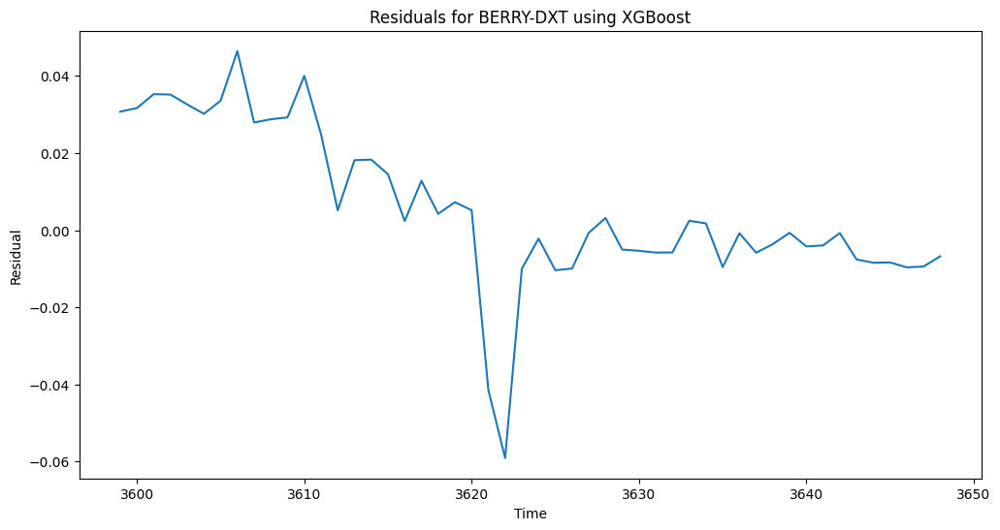

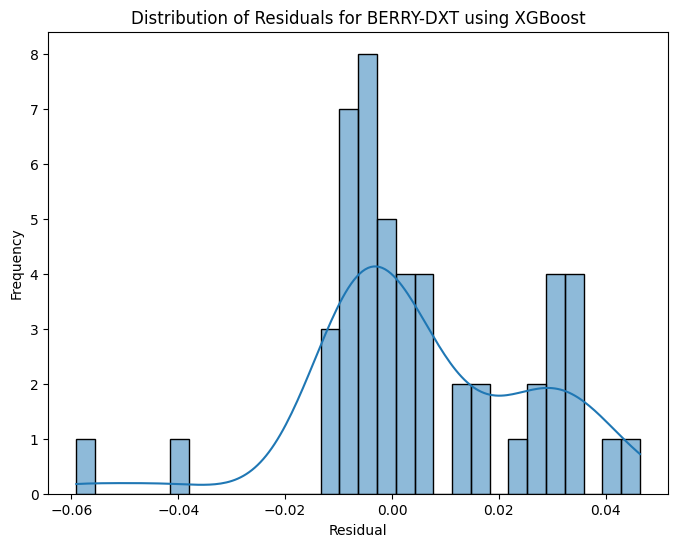

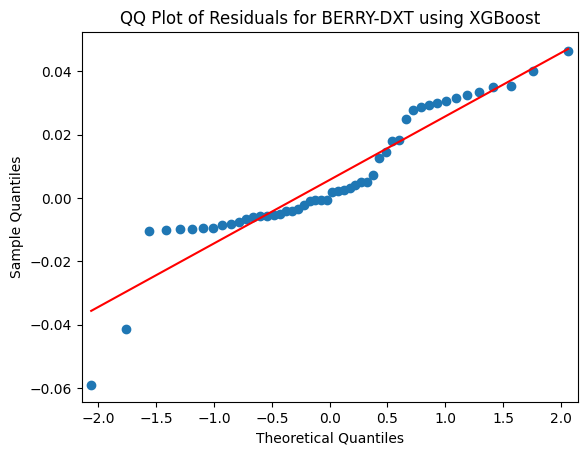

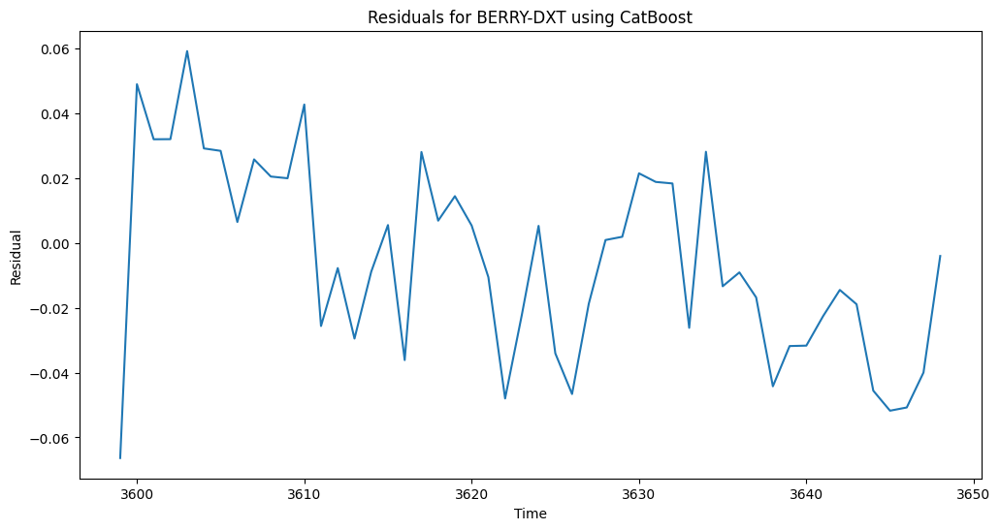

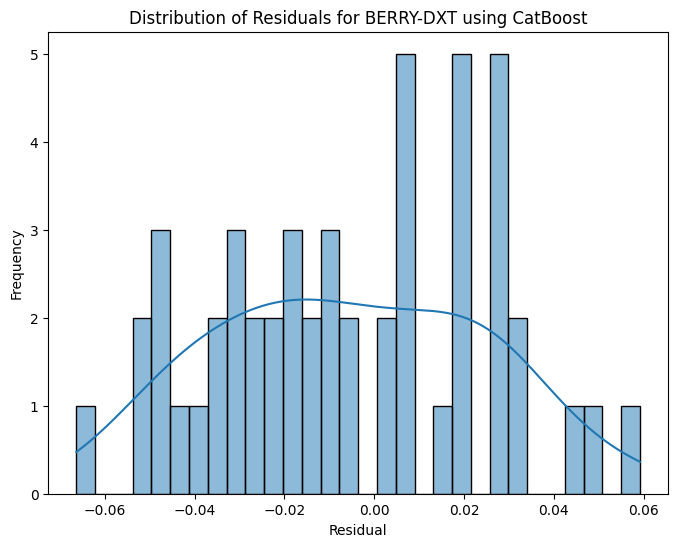

...

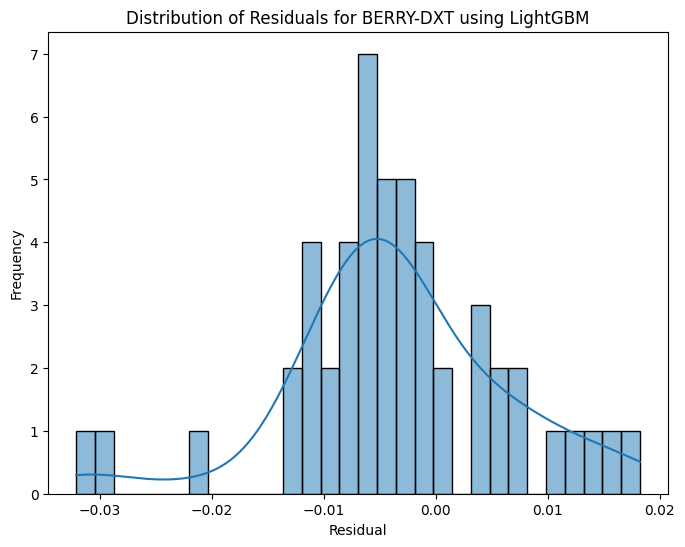

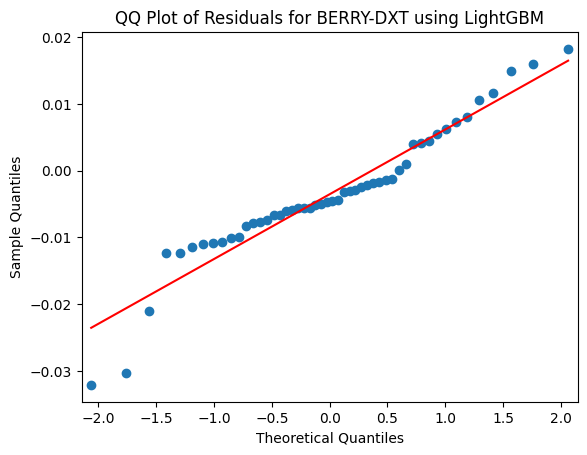

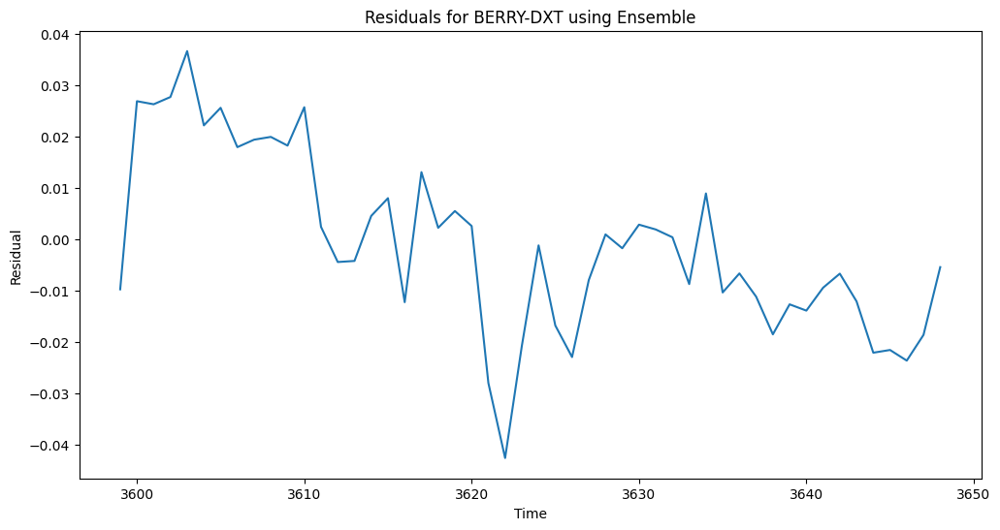

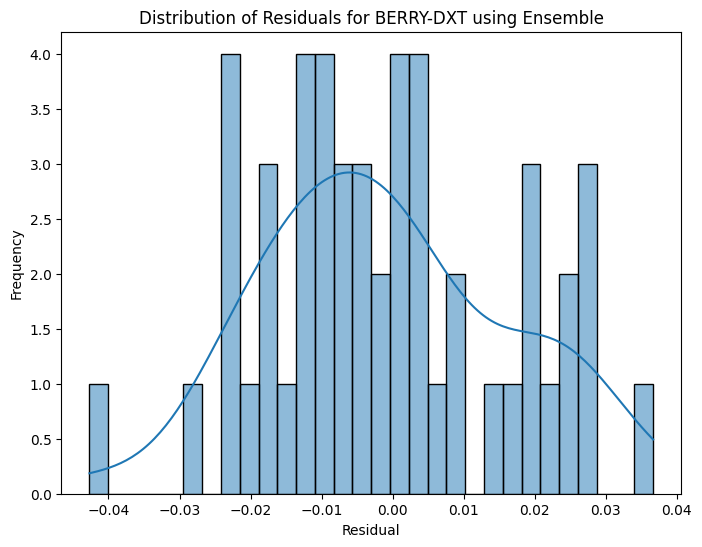

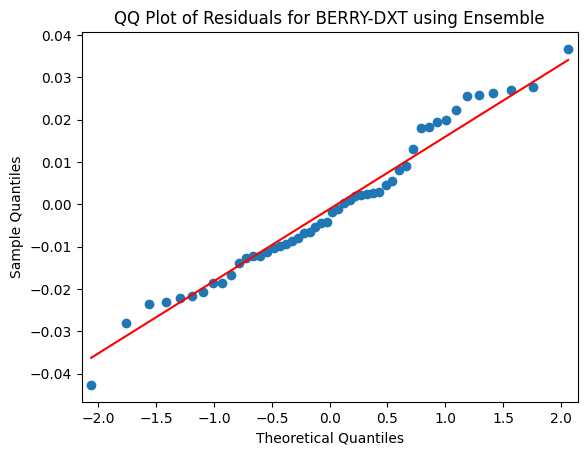

Evaluating and visualizing for pair: HER-RTE
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=67 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] feature_fraction is set=0.8691118489147887, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8691118489147887
[LightGBM] [Warning] lambda_l2 is set=0.01497161080603928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01497161080603928
[LightGBM] [Warning] lambda_l1 is set=0.0023780583350743907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0023780583350743907
[LightGBM] [Warning] bagging_fraction is set=0.741186083694718, subsample=1.0 will be ignored. Current value: bagging_fraction=0.741186083694718
XGBoost: MAE=0.02, MSE=0.00, RMSE=0.02, R2=0.98
CatBoost: MAE=0.03, MSE=0.00, RMSE=0.03, R2=0.95
LightGBM: MAE=0.01, MSE=0.00, RMSE=0.01, R2=0.99
Ensemble: MAE=0.01, MSE=0.00, RMSE=0.02, R2=0.98


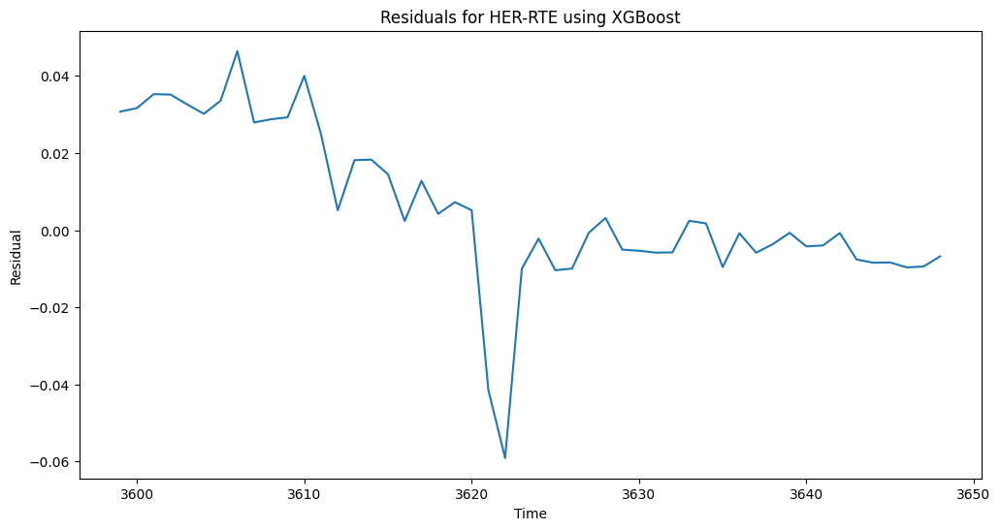

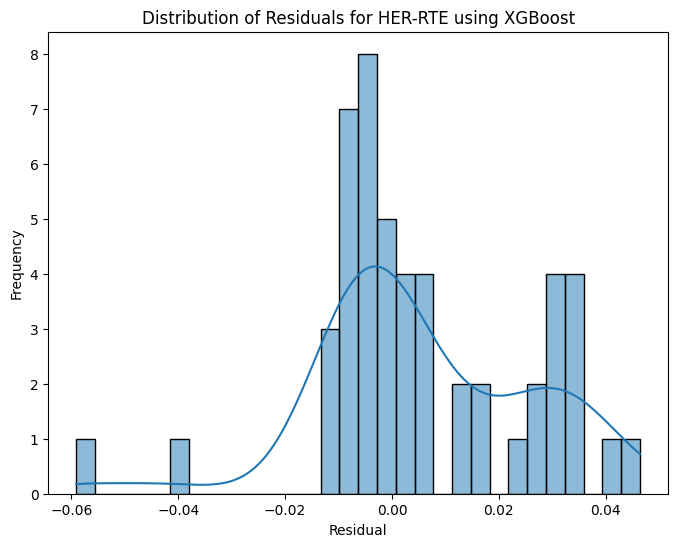

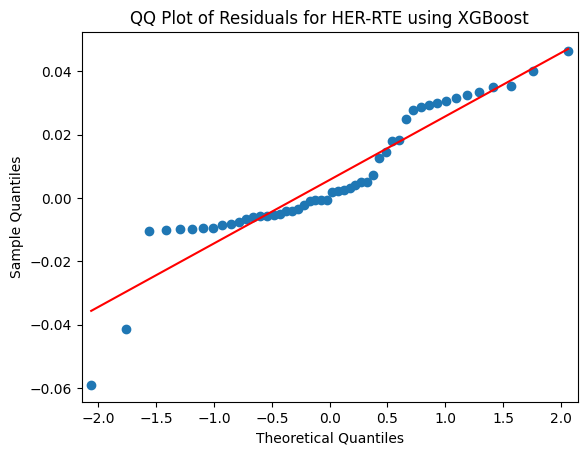

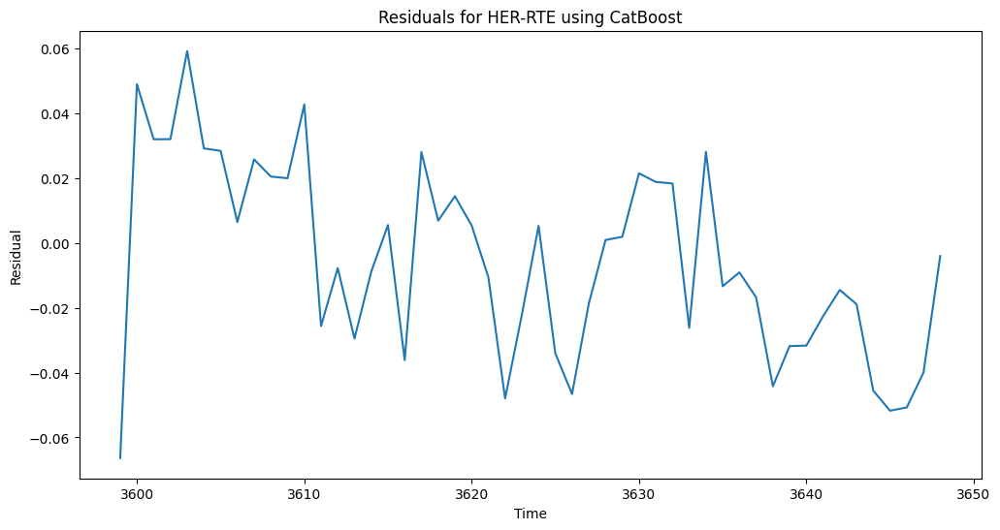

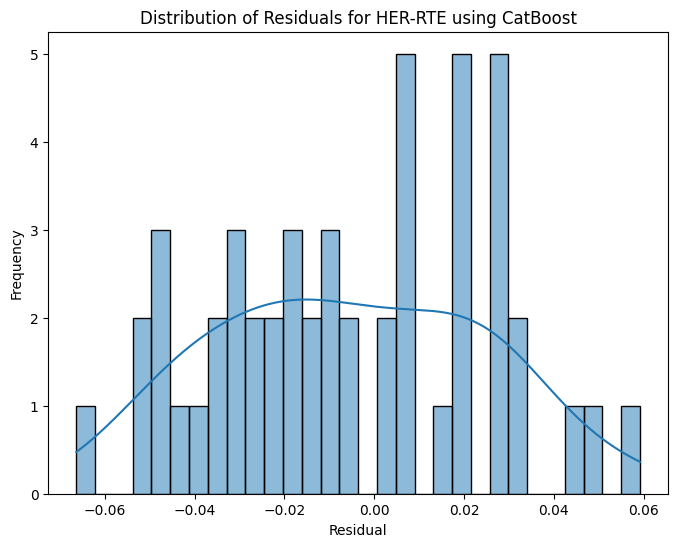

...

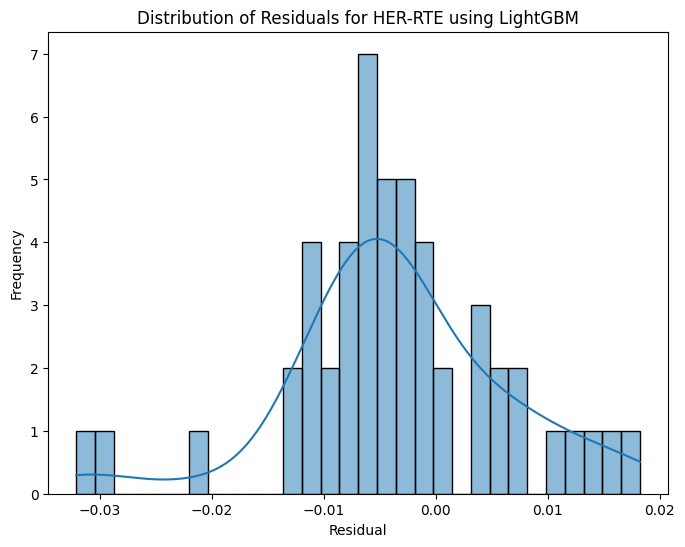

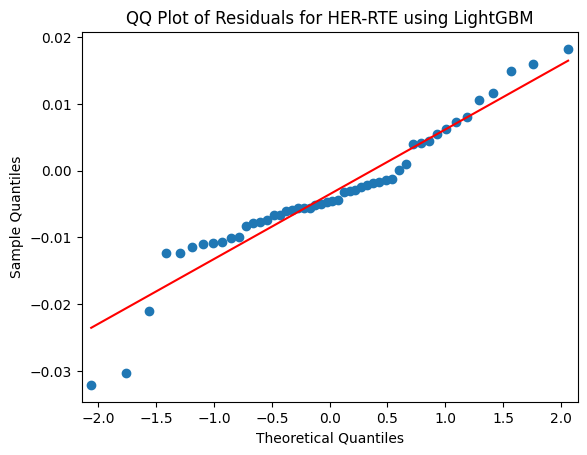

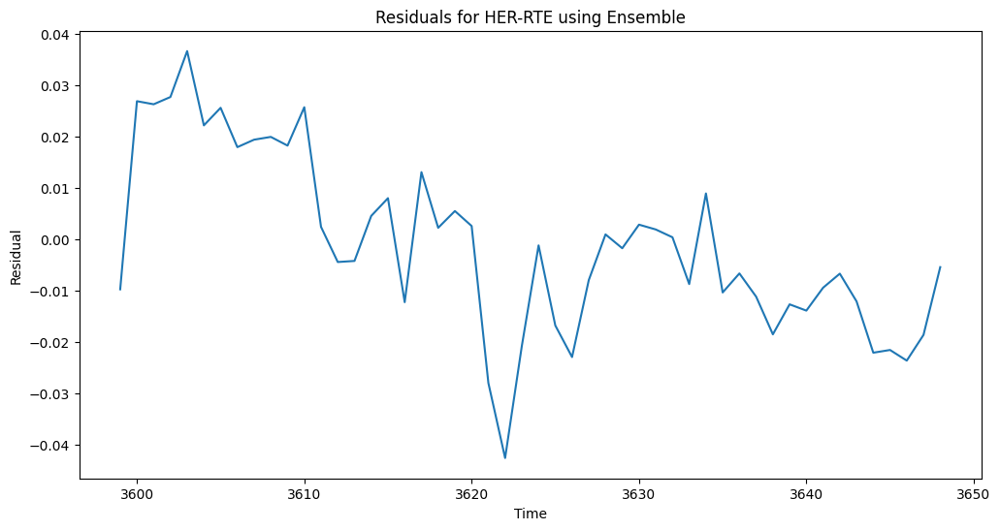

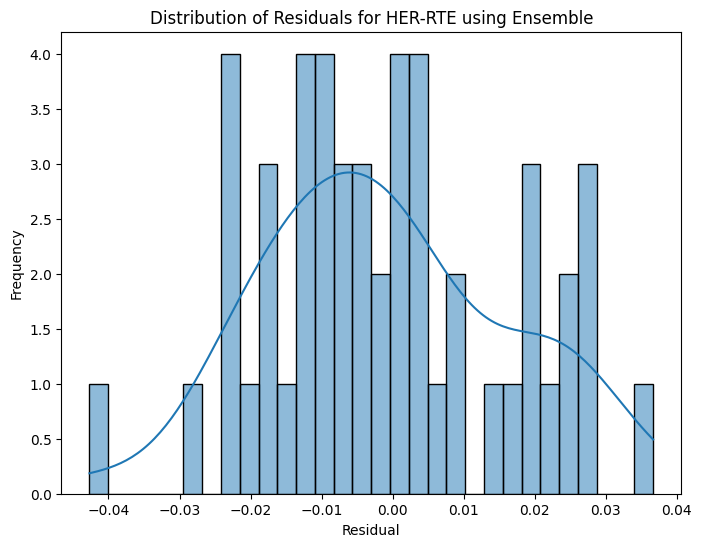

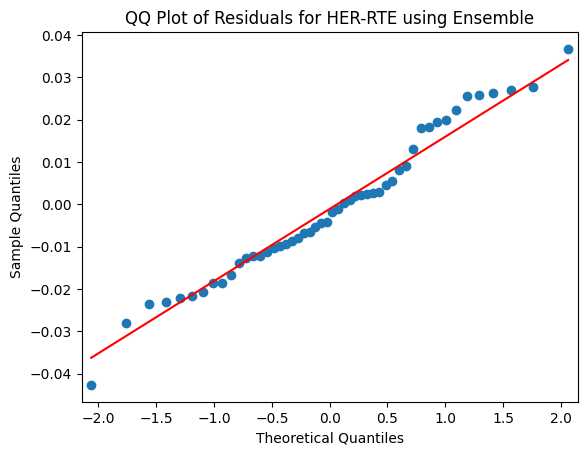

Evaluating and visualizing for pair: KNT-MIOTA
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=67 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] feature_fraction is set=0.8691118489147887, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8691118489147887
[LightGBM] [Warning] lambda_l2 is set=0.01497161080603928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01497161080603928
[LightGBM] [Warning] lambda_l1 is set=0.0023780583350743907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0023780583350743907
[LightGBM] [Warning] bagging_fraction is set=0.741186083694718, subsample=1.0 will be ignored. Current value: bagging_fraction=0.741186083694718
XGBoost: MAE=0.02, MSE=0.00, RMSE=0.02, R2=0.98
CatBoost: MAE=0.03, MSE=0.00, RMSE=0.03, R2=0.95
LightGBM: MAE=0.01, MSE=0.00, RMSE=0.01, R2=0.99
Ensemble: MAE=0.01, MSE=0.00, RMSE=0.02, R2=0.98


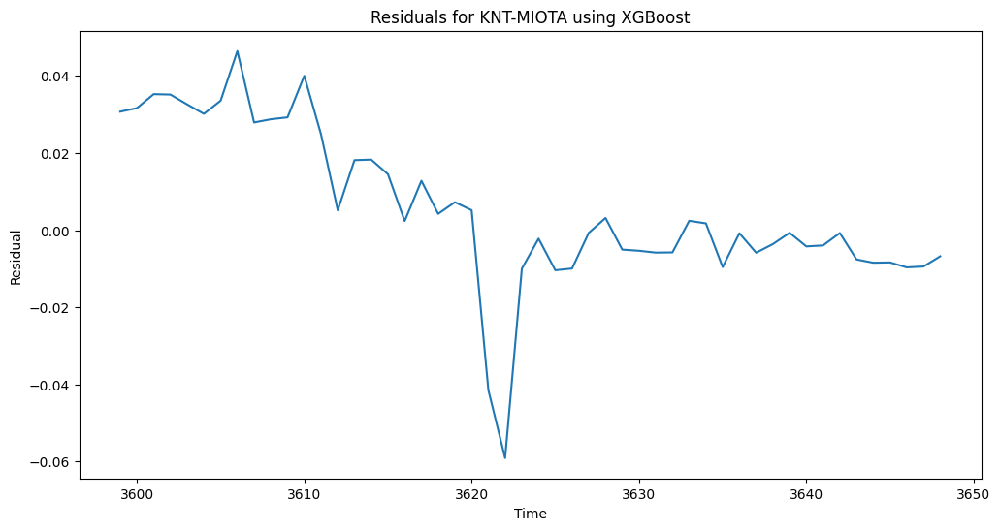

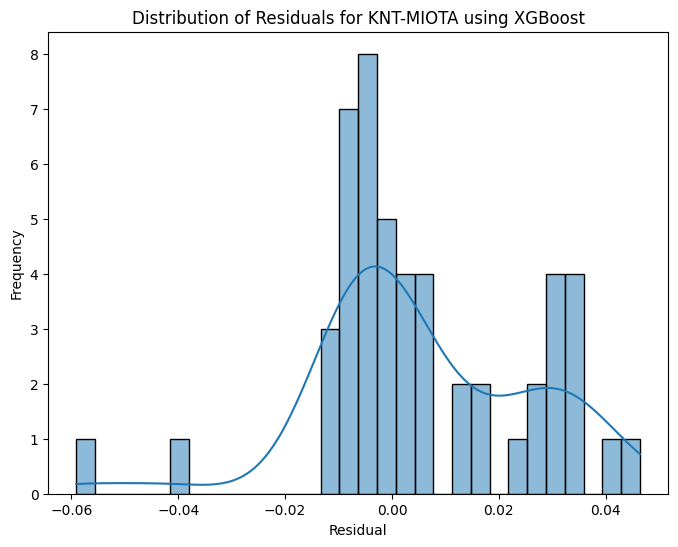

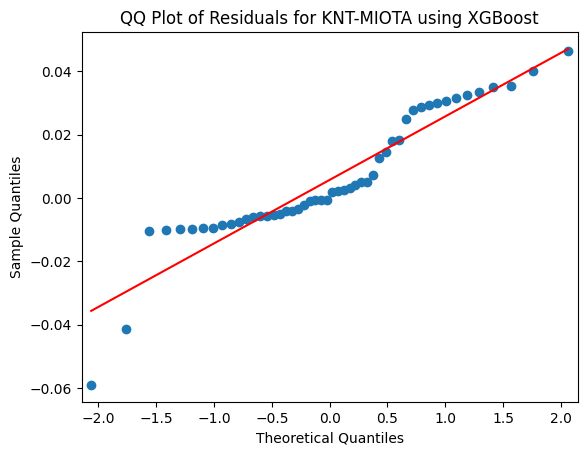

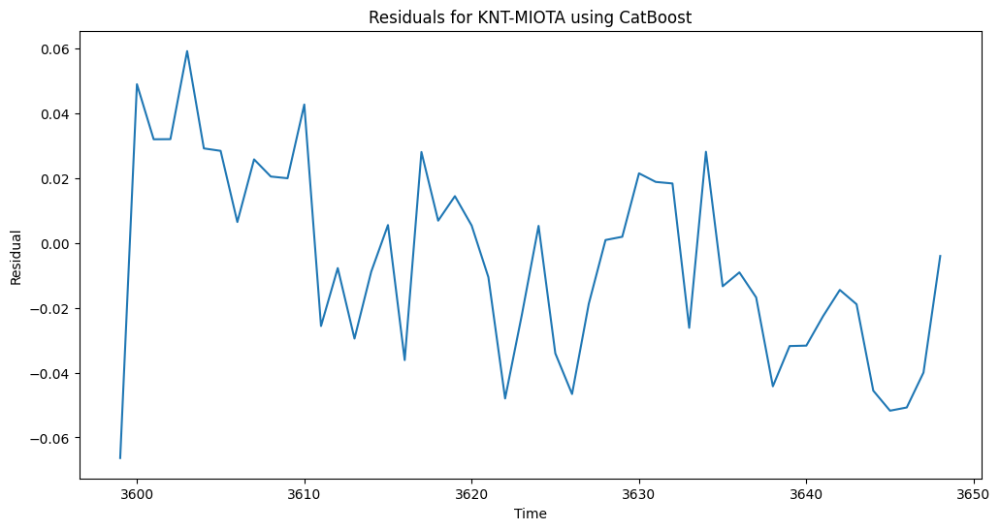

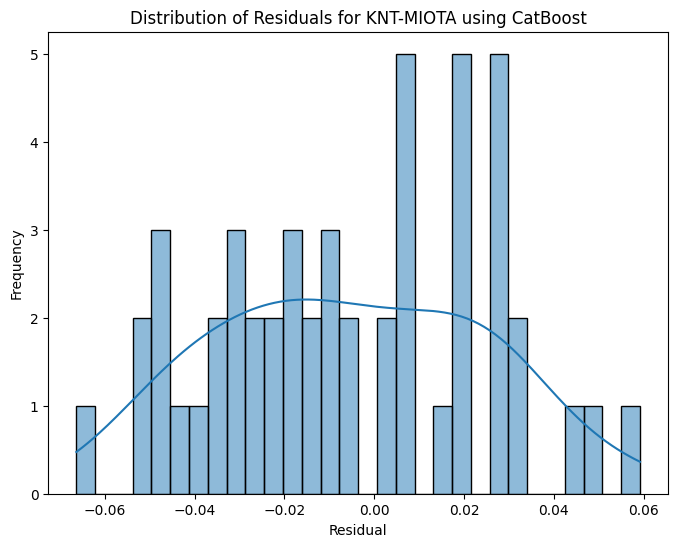

...

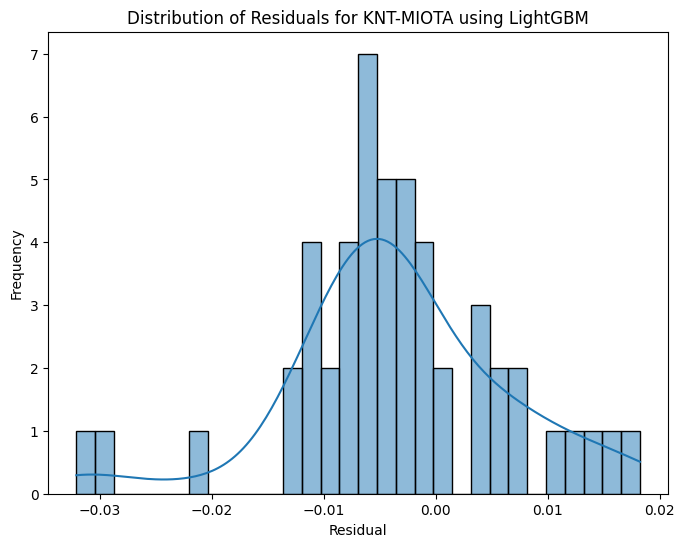

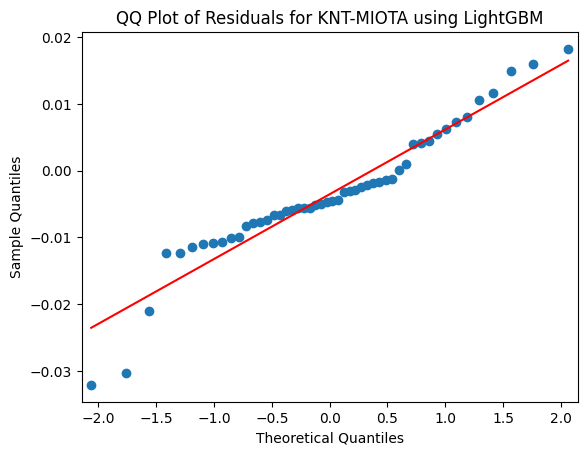

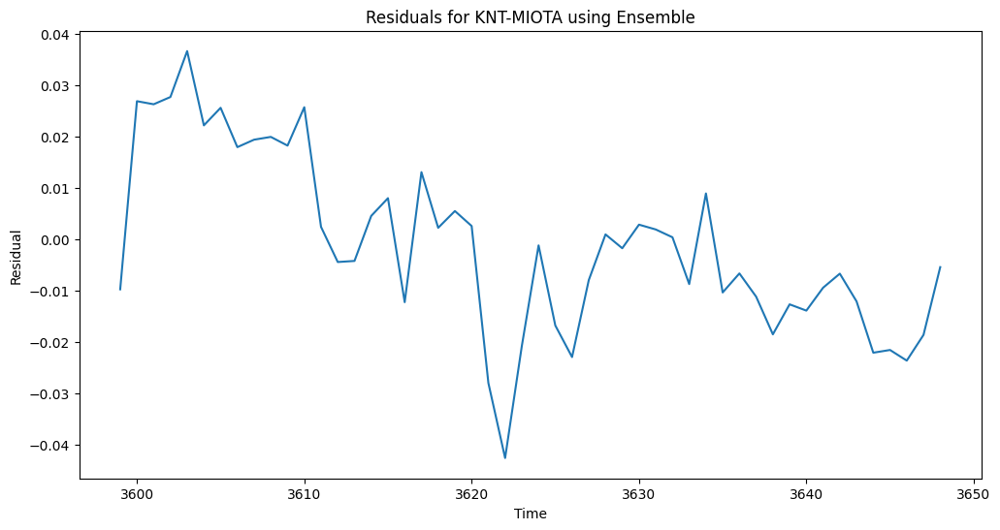

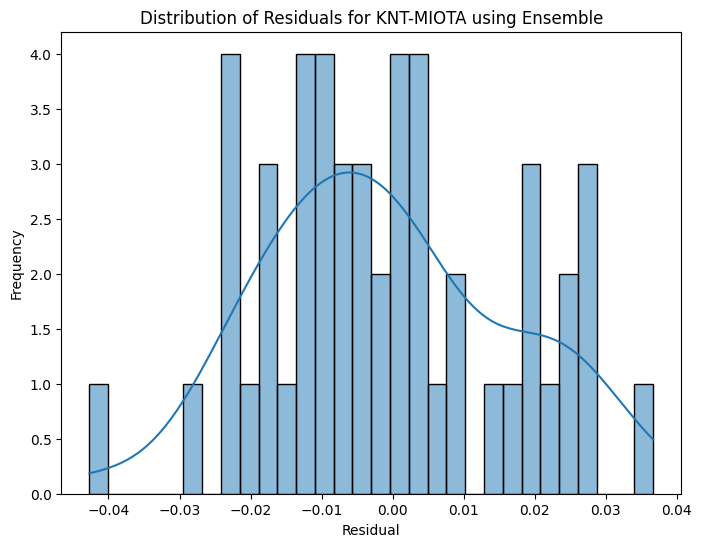

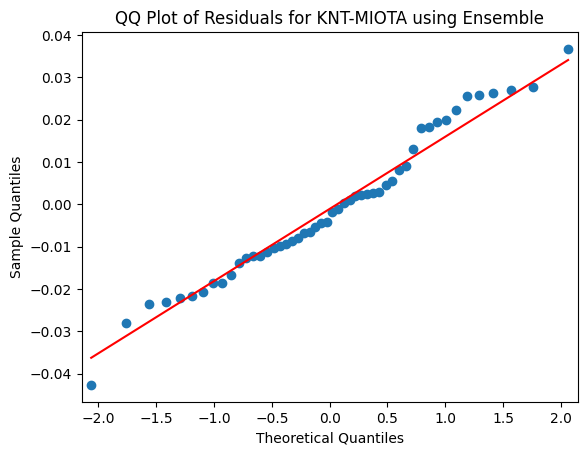

Evaluating and visualizing for pair: MIX-PINK
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=67 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] feature_fraction is set=0.8691118489147887, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8691118489147887
[LightGBM] [Warning] lambda_l2 is set=0.01497161080603928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01497161080603928
[LightGBM] [Warning] lambda_l1 is set=0.0023780583350743907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0023780583350743907
[LightGBM] [Warning] bagging_fraction is set=0.741186083694718, subsample=1.0 will be ignored. Current value: bagging_fraction=0.741186083694718
XGBoost: MAE=0.02, MSE=0.00, RMSE=0.02, R2=0.98
CatBoost: MAE=0.03, MSE=0.00, RMSE=0.03, R2=0.95
LightGBM: MAE=0.01, MSE=0.00, RMSE=0.01, R2=0.99
Ensemble: MAE=0.01, MSE=0.00, RMSE=0.02, R2=0.98


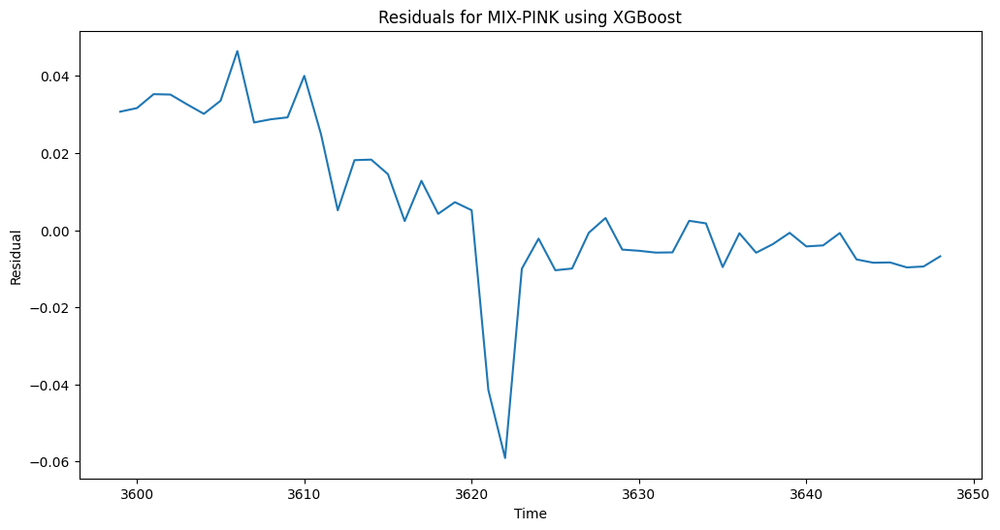

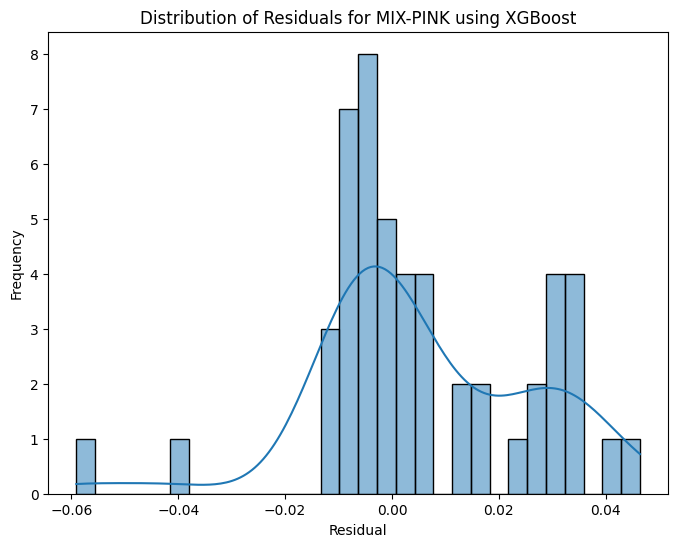

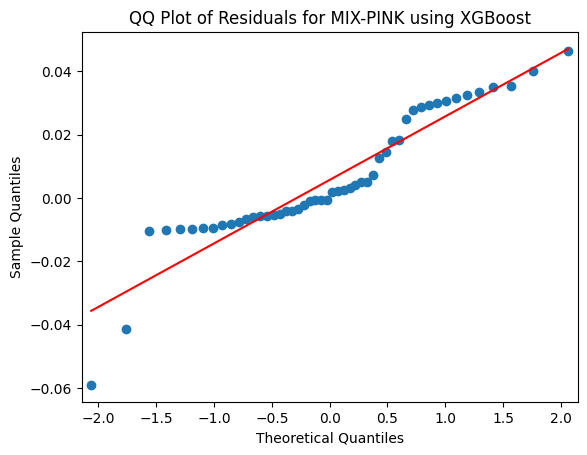

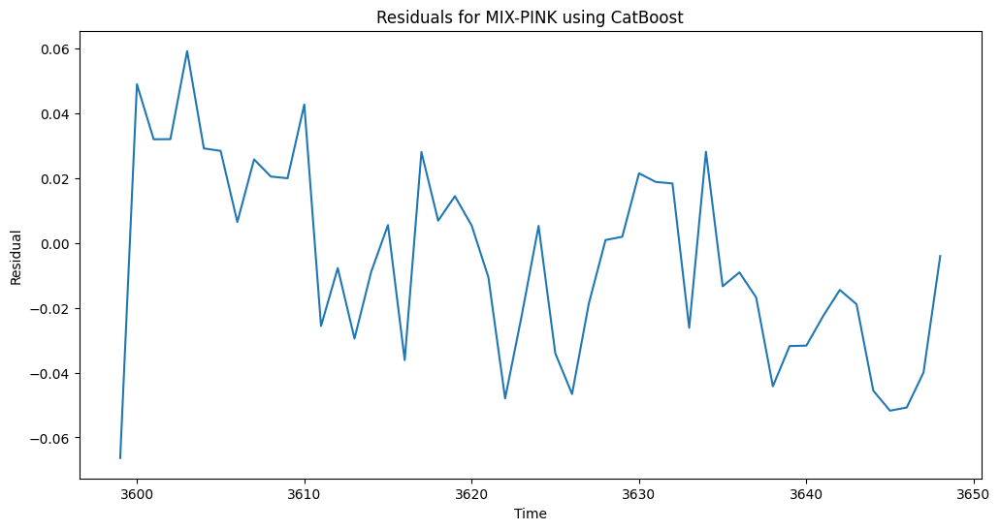

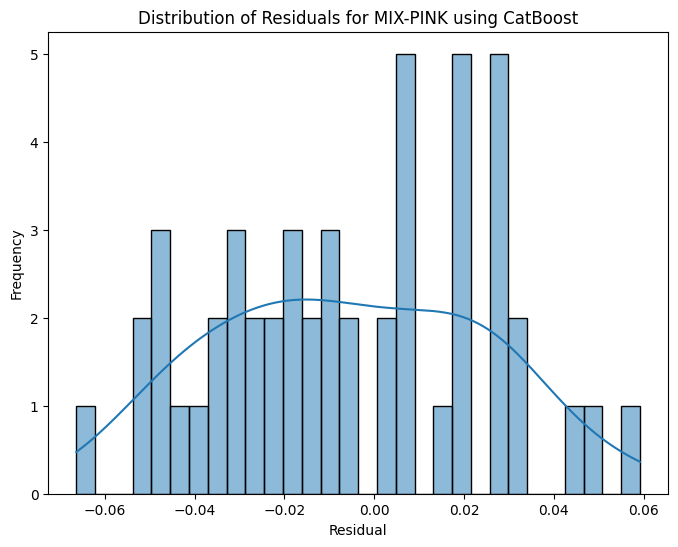

...

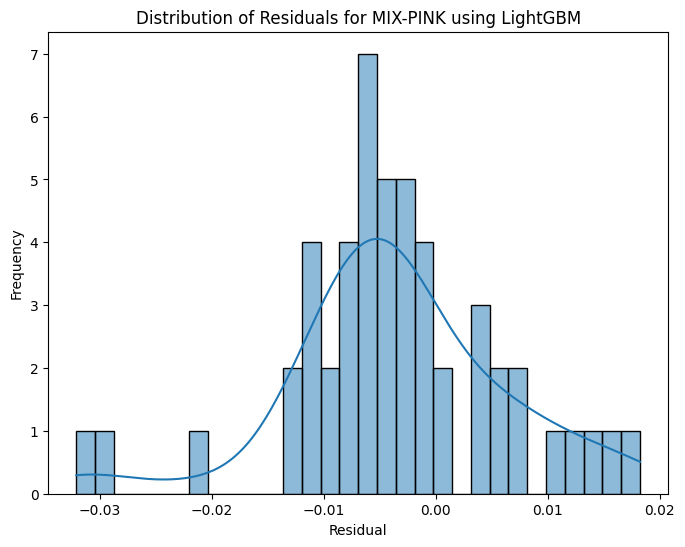

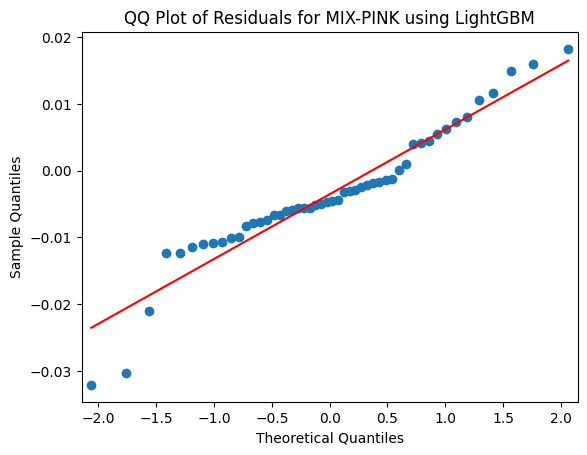

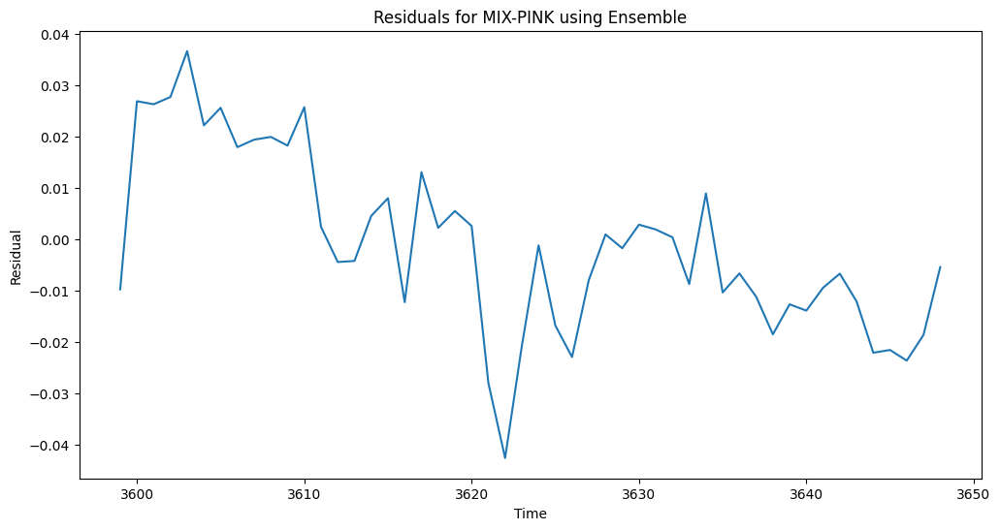

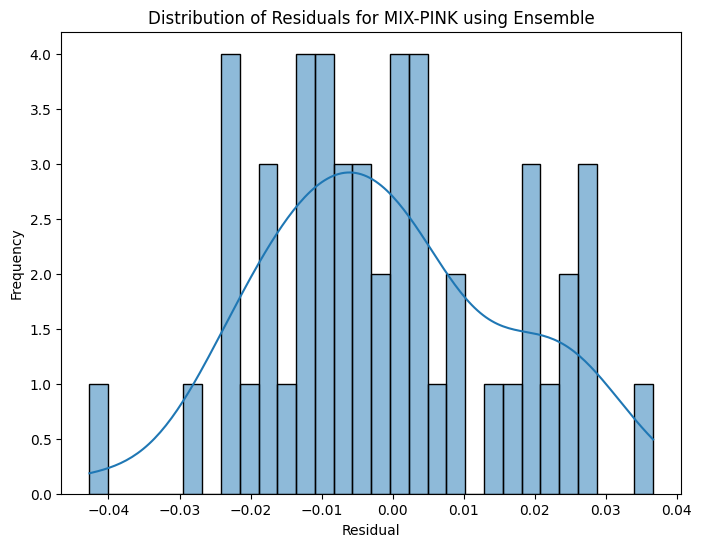

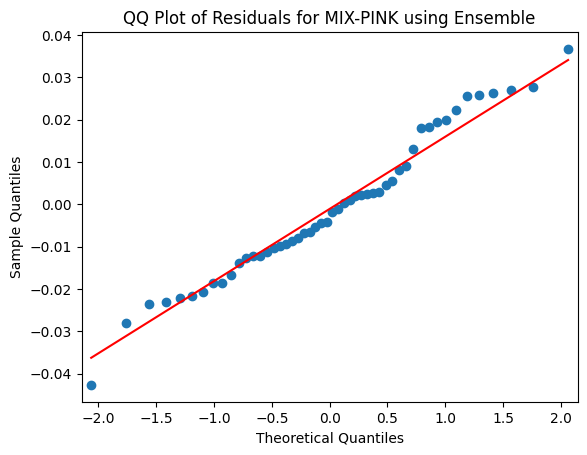

Evaluating and visualizing for pair: MIX-WICC
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=67 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] feature_fraction is set=0.8691118489147887, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8691118489147887
[LightGBM] [Warning] lambda_l2 is set=0.01497161080603928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01497161080603928
[LightGBM] [Warning] lambda_l1 is set=0.0023780583350743907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0023780583350743907
[LightGBM] [Warning] bagging_fraction is set=0.741186083694718, subsample=1.0 will be ignored. Current value: bagging_fraction=0.741186083694718
XGBoost: MAE=0.02, MSE=0.00, RMSE=0.02, R2=0.98
CatBoost: MAE=0.03, MSE=0.00, RMSE=0.03, R2=0.95
LightGBM: MAE=0.01, MSE=0.00, RMSE=0.01, R2=0.99
Ensemble: MAE=0.01, MSE=0.00, RMSE=0.02, R2=0.98


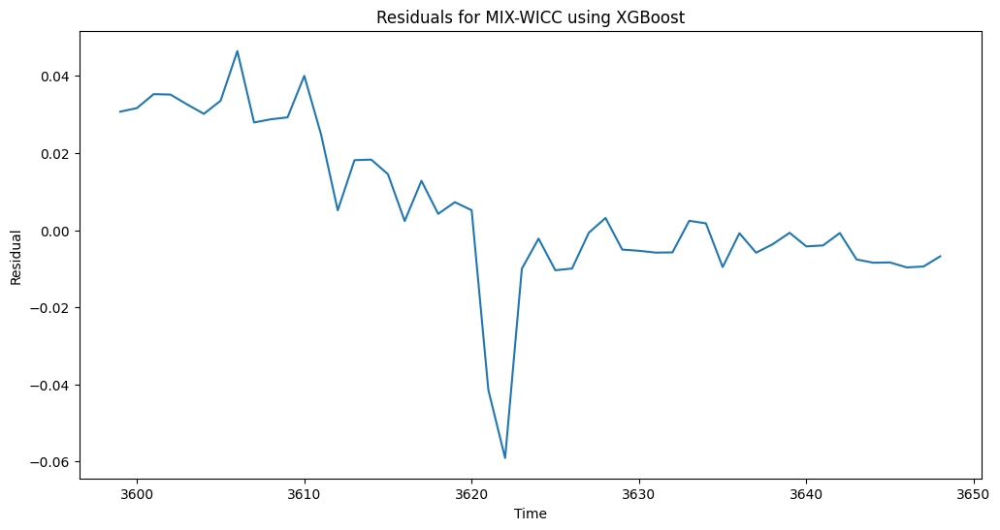

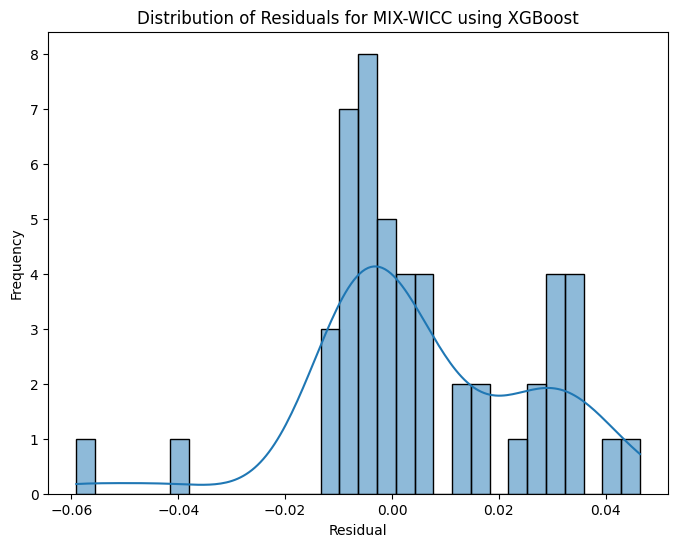

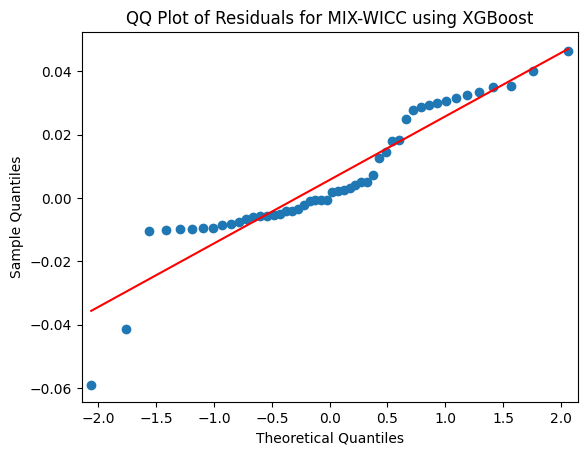

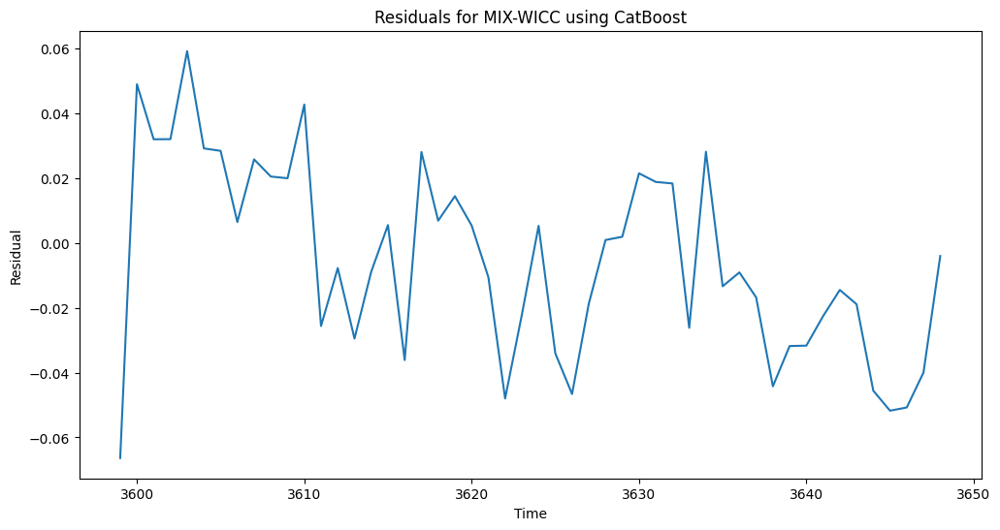

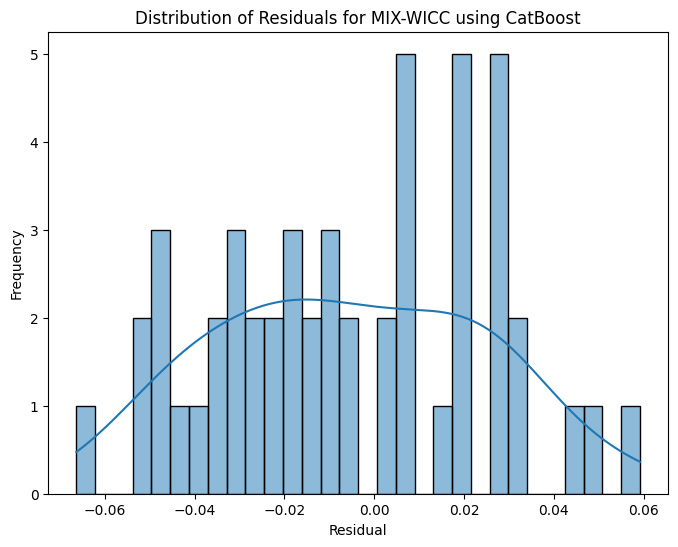

...

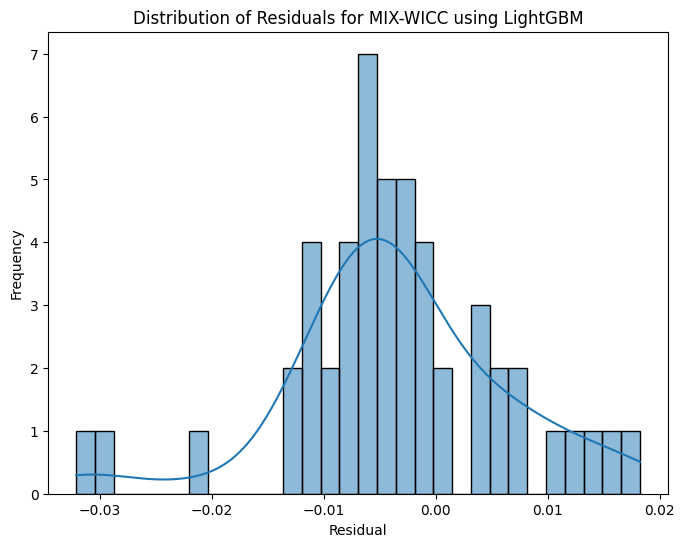

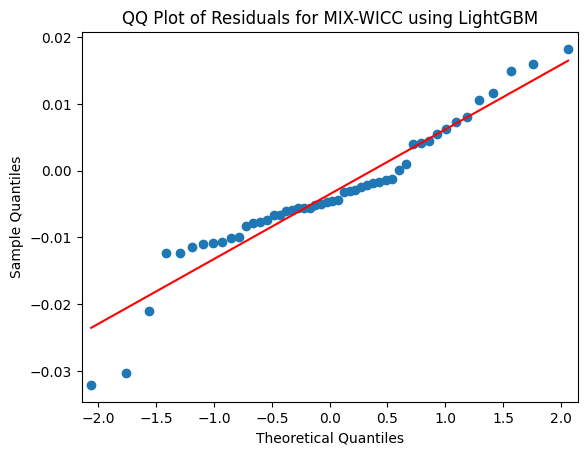

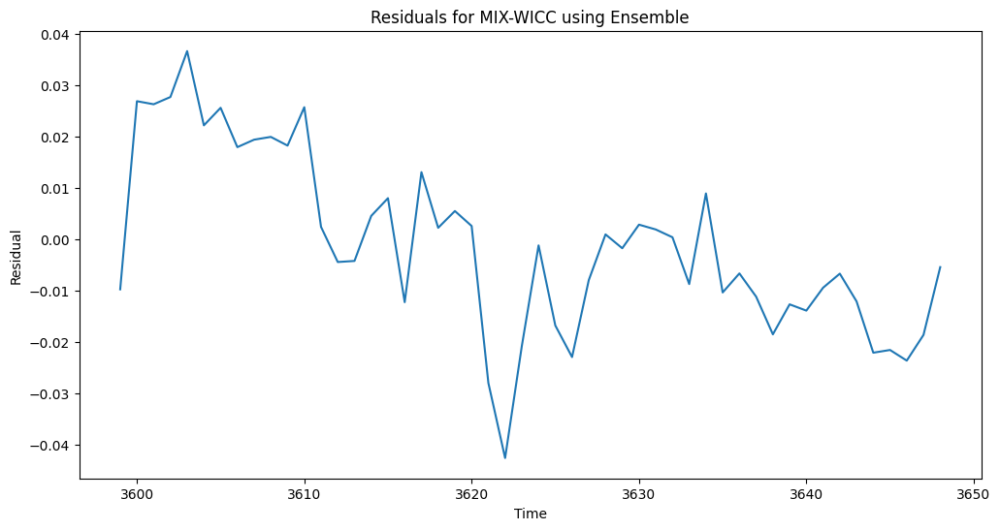

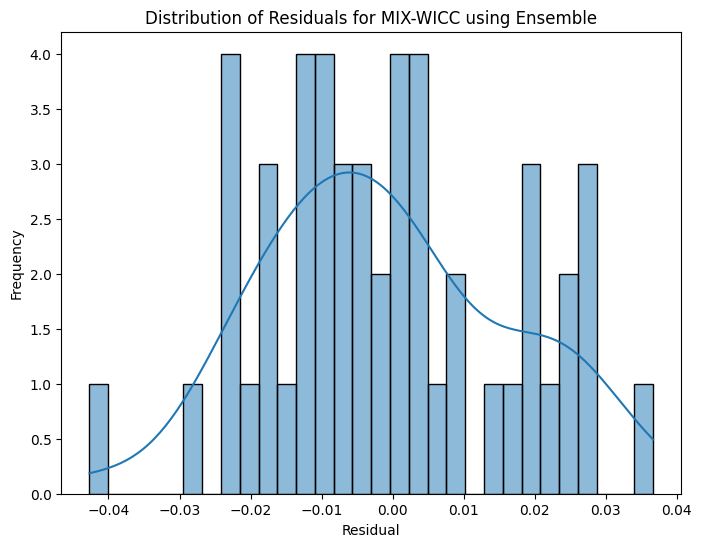

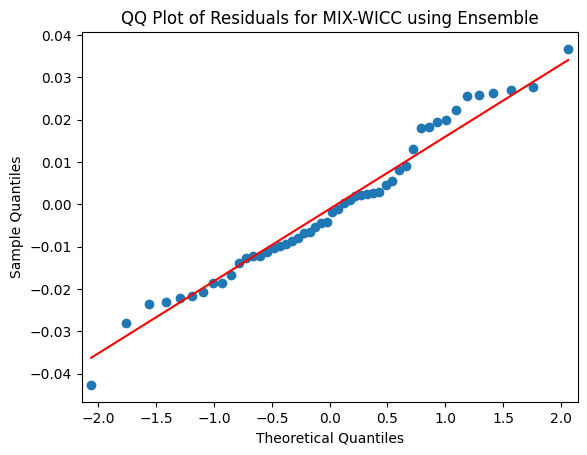

In [ ]:
# After training and making predictions with your models
for pair in pairs:
    print(f"Evaluating and visualizing for pair: {pair}")

    # Filter data for each pair
    pair_data = training_df[training_df['Pair'] == pair].copy()

    if len(pair_data) == 0:
        print(f"No data found for pair: {pair}. Skipping...")
        continue

    X = pair_data[features]
    y = pair_data[target]

    # ... (Your existing train-test split code) ...

    # Make predictions with each model on the test set
    xgb_pred = xgb_model.predict(X_val)
    catboost_pred = catboost_model.predict(X_val)
    lightgbm_pred = lightgbm_model.predict(X_val)
    ensemble_pred = (xgb_pred + catboost_pred + lightgbm_pred) / 3

    # Evaluate each model
    mae_xgb, mse_xgb, rmse_xgb, r2_xgb = evaluate_model(y_val, xgb_pred)
    mae_catboost, mse_catboost, rmse_catboost, r2_catboost = evaluate_model(y_val, catboost_pred)
    mae_lightgbm, mse_lightgbm, rmse_lightgbm, r2_lightgbm = evaluate_model(y_val, lightgbm_pred)
    mae_ensemble, mse_ensemble, rmse_ensemble, r2_ensemble = evaluate_model(y_val, ensemble_pred)

    # Print evaluation results
    print(f"XGBoost: MAE={mae_xgb:.2f}, MSE={mse_xgb:.2f}, RMSE={rmse_xgb:.2f}, R2={r2_xgb:.2f}")
    print(f"CatBoost: MAE={mae_catboost:.2f}, MSE={mse_catboost:.2f}, RMSE={rmse_catboost:.2f}, R2={r2_catboost:.2f}")
    print(f"LightGBM: MAE={mae_lightgbm:.2f}, MSE={mse_lightgbm:.2f}, RMSE={rmse_lightgbm:.2f}, R2={r2_lightgbm:.2f}")
    print(f"Ensemble: MAE={mae_ensemble:.2f}, MSE={mse_ensemble:.2f}, RMSE={rmse_ensemble:.2f}, R2={r2_ensemble:.2f}")


    # Analyze residuals for each model
    plot_residuals(y_val, xgb_pred, pair, 'XGBoost')
    plot_residuals(y_val, catboost_pred, pair, 'CatBoost')
    plot_residuals(y_val, lightgbm_pred, pair, 'LightGBM')
    plot_residuals(y_val, ensemble_pred, pair, 'Ensemble')


In [ ]:
# import pickle
# import joblib

# # Save the trained models
# joblib.dump(xgb_model, 'xgb_model.pkl')
# joblib.dump(catboost_model, 'catboost_model.pkl')
# joblib.dump(lightgbm_model, 'lightgbm_model.pkl')

# # Save the label encoder
# joblib.dump(le, 'label_encoder.pkl')

# # Save the results dataframe
# results.to_csv('model_results.csv', index=False)

# # Download the saved files (optional, if you want to download them to your local machine)
# from google.colab import files
# files.download('xgb_model.pkl')
# files.download('catboost_model.pkl')
# files.download('lightgbm_model.pkl')
# files.download('label_encoder.pkl')
# files.download('model_results.csv')
# training_df.to_csv('training_df.csv', index=False)


In [ ]:
print(top_five_pairs)

[('BERRY', 'DXT', 9.383919344315103e-27), ('MIX', 'PINK', 1.814004526229856e-21), ('KNT', 'MIOTA', 1.1398837620900376e-20), ('MIX', 'WICC', 5.831640617500326e-20), ('HER', 'RTE', 1.8280268752359297e-19)]


In [ ]:
five_selected_pairs =list(training_df['Pair'].unique())
five_selected_pairs

['BERRY-DXT', 'MIX-PINK', 'KNT-MIOTA', 'MIX-WICC', 'HER-RTE']

In [ ]:
import joblib

# Load the trained models
xgb_model = joblib.load('xgb_model.pkl')
catboost_model = joblib.load('catboost_model.pkl')
lightgbm_model = joblib.load('lightgbm_model.pkl')

# Load the label encoder
le = joblib.load('label_encoder.pkl')


In [ ]:
for pair in five_selected_pairs:
    # Assuming 'Pair' column in training_df contains the pair information
    pair_data = training_df[training_df['Pair'] == pair].copy()

    # Check if there is data for the current pair
    if pair_data.empty:
        print(f"No data found for pair: {pair}. Skipping...")
    else:
        print(f"Data for pair: {pair}")
        print(pair_data.head())  # Display first 5 rows
        print("\n")  # Add a separator between pairs

Data for pair: BERRY-DXT
          Date  Symbol1_Close  Symbol2_Close    Spread   Z-Score  Hedge_Ratio  \
9   2018-04-16       0.056676       0.032678  3.706978  4.547968      0.75033   
10  2018-04-17       0.058860       0.029134  4.307913  5.234698      0.75033   
11  2018-04-18       0.060005       0.032296  4.155567  5.060601      0.75033   
12  2018-04-19       0.061064       0.033379  4.186100  5.095494      0.75033   
13  2018-04-20       0.058644       0.058364  1.559845  2.094292      0.75033   

    Spread_Change  Z-Score_Change       Pair  Z-Score_Lag1  ...  Spread_Lag1  \
9       -0.022276       -0.022727  BERRY-DXT      4.863980  ...     3.987456   
10       0.034589        0.001963  BERRY-DXT      4.535657  ...     3.699912   
11      -0.013367       -0.018859  BERRY-DXT      5.220679  ...     4.299850   
12      -0.002914       -0.014322  BERRY-DXT      5.047015  ...     4.147756   
13      -0.158040       -0.081649  BERRY-DXT      5.081821  ...     4.178240   

    Spr

In [ ]:
import numpy as np
import pandas as pd

# Define the base position size (e.g., 5% of the total capital)
base_position_size = 0.05  # This can be adjusted based on your risk management strategy

# Lower the thresholds to trigger more trades
signal_threshold_long = -0.75  # More trades with a smaller threshold for going long
signal_threshold_short = 0.75  # More trades with a smaller threshold for going short

# Dictionary to store signals for each pair
signals_dict = {}

for pair in five_selected_pairs:
    print(f"Generating signals for pair: {pair}")

    # Filter data for the current pair
    pair_data = training_df[training_df['Pair'] == pair].copy()

    if pair_data.empty:
        print(f"No data found for pair: {pair}. Skipping...")
        continue

    # Features and target variable
    X = pair_data[features]  # Ensure 'features' are defined
    y = pair_data[target]     # Ensure 'target' is defined

    # Predictions from trained models
    xgb_pred = xgb_model.predict(X)
    catboost_pred = catboost_model.predict(X)
    lightgbm_pred = lightgbm_model.predict(X)

    # Ensemble predictions
    ensemble_pred = (xgb_pred + catboost_pred + lightgbm_pred) / 3

    # Generate signals based on ensemble predictions
    signals = pd.DataFrame({
        'Spread_Prediction': ensemble_pred,
        'Actual_Spread': y,
        'Signal': np.where(ensemble_pred < signal_threshold_long, 1,  # Buy signal
                           np.where(ensemble_pred > signal_threshold_short, -1, 0))  # Sell signal
    }, index=pair_data.index)  # Use pair_data's index

    # Calculate Position Size (Fixed for now)
    signals['Position_Size'] = base_position_size

    # Optional: Add dynamic position sizing logic based on prediction confidence or volatility

    # Calculate Stop-Loss (Dynamic based on volatility, for example)
    stop_loss_pct = 0.05  # Example: 5% stop-loss level
    signals['Hard_Stop_Loss'] = np.where(signals['Signal'] == 1,
                                         signals['Actual_Spread'] * (1 - stop_loss_pct),
                                         np.where(signals['Signal'] == -1,
                                                  signals['Actual_Spread'] * (1 + stop_loss_pct), 0))

    # Store signals for the pair in the dictionary
    signals_dict[(pair.split('-')[0], pair.split('-')[1])] = signals

    # Display signals with actions
    print(signals[signals['Signal'] != 0])  # Show only signals that are not zero

# Verify signals_dict
print("Signals generated for the following pairs:")
for key in signals_dict.keys():
    print(key, signals_dict[key][signals_dict[key]['Signal'] != 0].shape[0])  # Print number of signals generated


Generating signals for pair: BERRY-DXT
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=67 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] feature_fraction is set=0.8691118489147887, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8691118489147887
[LightGBM] [Warning] lambda_l2 is set=0.01497161080603928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01497161080603928
[LightGBM] [Warning] lambda_l1 is set=0.0023780583350743907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0023780583350743907
[LightGBM] [Warning] bagging_fraction is set=0.741186083694718, subsample=1.0 will be ignored. Current value: bagging_fraction=0.741186083694718
      Spread_Prediction  Actual_Spread  Signal  Position_Size  Hard_Stop_Loss
9              7.106791       3.706978      -1           0.05        3.892326
10             7.523164       4.307913      -1           0.05        4.523309
11             6.577491       4

In [ ]:
signals_dict

{('BERRY',
  'DXT'):       Spread_Prediction  Actual_Spread  Signal  Position_Size  Hard_Stop_Loss
 9              7.106791       3.706978      -1           0.05        3.892326
 10             7.523164       4.307913      -1           0.05        4.523309
 11             6.577491       4.155567      -1           0.05        4.363345
 12             6.595814       4.186100      -1           0.05        4.395406
 13             3.984294       1.559845      -1           0.05        1.637837
 ...                 ...            ...     ...            ...             ...
 1194           1.454676      -0.210016      -1           0.05       -0.220517
 1195           1.471890      -0.211968      -1           0.05       -0.222566
 1196           1.481641      -0.209711      -1           0.05       -0.220197
 1197           1.488962      -0.209440      -1           0.05       -0.219912
 1198           1.483938      -0.212554      -1           0.05       -0.223182
 
 [1190 rows x 5 columns],
 ('M

In [ ]:
import pandas as pd

def backtest_signals(signals_dict, capital=100000):
    """Backtests the generated signals."""

    portfolio_value = capital
    portfolio_values = [portfolio_value]  # Initialize list to store portfolio values
    positions = {}  # Track current open positions (pair: (entry_price, quantity))
    trades = []  # Initialize trades list to store trade information

    for pair_key, signals in signals_dict.items():
        for index, row in signals.iterrows():
            signal = row['Signal']
            actual_spread = row['Actual_Spread']
            position_size = row['Position_Size'] * portfolio_value

            if signal == 1:  # Buy Signal
                if pair_key not in positions:
                    quantity = position_size / actual_spread  # Buy based on current price
                    positions[pair_key] = (actual_spread, quantity)
                    trades.append([index, pair_key[0], pair_key[1], actual_spread, quantity, 'Buy'])  # Record trade
                    print(f"[{index}] Buy {pair_key}: Spread {actual_spread:.2f}, Quantity {quantity:.2f}")

            elif signal == -1:  # Sell Signal
                if pair_key not in positions:
                    quantity = position_size / actual_spread  # Sell based on current price
                    positions[pair_key] = (actual_spread, -quantity)
                    trades.append([index, pair_key[0], pair_key[1], actual_spread, quantity, 'Sell'])  # Record trade
                    print(f"[{index}] Sell {pair_key}: Spread {actual_spread:.2f}, Quantity {quantity:.2f}")

            elif signal == 0:  # Close Signal
                if pair_key in positions:
                    entry_price, quantity = positions[pair_key]
                    profit_loss = quantity * (actual_spread - entry_price)
                    portfolio_value += profit_loss
                    positions[pair_key] = (entry_price, 0)  # Mark position as closed by setting quantity to 0
                    trades.append([index, pair_key[0], pair_key[1], actual_spread, quantity, 'Close'])  # Record trade
                    portfolio_values.append(portfolio_value)
                    print(f"[{index}] Close {pair_key}: Spread {actual_spread:.2f}, Profit/Loss {profit_loss:.2f}")

    # Close remaining open positions at the end of the backtest
    for pair_key in list(positions.keys()):
        if positions[pair_key][1] != 0:  # Check if position is still open (quantity not 0)
            entry_price, quantity = positions[pair_key]
            last_spread = signals.iloc[-1]['Actual_Spread']  # Get last spread from signals
            profit_loss = quantity * (last_spread - entry_price)
            portfolio_value += profit_loss
            trades.append([signals.index[-1], pair_key[0], pair_key[1], last_spread, quantity, 'Close'])  # Record trade
            del positions[pair_key]  # Safe to delete now
            print(f"[End] Close {pair_key}: Spread {last_spread:.2f}, Profit/Loss {profit_loss:.2f}")

    # Create trades DataFrame
    trades_df = pd.DataFrame(trades, columns=['Date', 'Asset1', 'Asset2', 'Spread', 'Quantity', 'Action'])
    trades_df['Date'] = pd.to_datetime(trades_df['Date'])  # Convert 'Date' to datetime
    trades_df.set_index('Date', inplace=True)  # Set 'Date' as the index

    return portfolio_value, portfolio_values, trades_df

# Backtest the signals
final_portfolio_value, portfolio_values, trades_df = backtest_signals(signals_dict)

print(f"Final portfolio value: {final_portfolio_value:.2f}")

# Optionally, print the trades DataFrame to verify trades
print(trades_df)


[9] Sell ('BERRY', 'DXT'): Spread 3.71, Quantity 1348.81
[1199] Sell ('MIX', 'PINK'): Spread 5.63, Quantity 887.45
[1885] Sell ('KNT', 'MIOTA'): Spread 1.74, Quantity 2879.03
[2963] Sell ('MIX', 'WICC'): Spread 5.78, Quantity 864.56
[3014] Close ('MIX', 'WICC'): Spread 0.70, Profit/Loss 4396.32
[3029] Close ('MIX', 'WICC'): Spread 0.77, Profit/Loss -0.00
[3030] Close ('MIX', 'WICC'): Spread 0.69, Profit/Loss -0.00
[3031] Close ('MIX', 'WICC'): Spread 0.65, Profit/Loss -0.00
[3032] Close ('MIX', 'WICC'): Spread 0.64, Profit/Loss -0.00
[3033] Close ('MIX', 'WICC'): Spread 0.62, Profit/Loss -0.00
[3034] Close ('MIX', 'WICC'): Spread 0.62, Profit/Loss -0.00
[3035] Close ('MIX', 'WICC'): Spread 0.52, Profit/Loss -0.00
[3036] Close ('MIX', 'WICC'): Spread 0.45, Profit/Loss -0.00
[3037] Close ('MIX', 'WICC'): Spread 0.38, Profit/Loss -0.00
[3038] Close ('MIX', 'WICC'): Spread 0.39, Profit/Loss -0.00
[3039] Close ('MIX', 'WICC'): Spread 0.42, Profit/Loss -0.00
[3040] Close ('MIX', 'WICC'): Spr

In [ ]:
trades_df.to_csv('backtest_results.csv')

In [ ]:
trades_df['Action'].value_counts()

,count
Action,
Close,971
Sell,5


In [ ]:
# 1. Portfolio Value Over Time
import plotly.graph_objects as go
fig1 = go.Figure()
fig1.add_trace(go.Scatter(x=signals_dict[(five_selected_pairs[0].split('-')[0], five_selected_pairs[0].split('-')[1])].index, y=portfolio_values,
                           mode='lines', name='Portfolio Value', line=dict(color='blue')))
fig1.update_layout(title='Portfolio Value Over Time',
                   xaxis_title='Date',
                   yaxis_title='Portfolio Value',
                   template='plotly_white')


In [ ]:
for pair, signals in signals_dict.items():
    fig2 = go.Figure()
    fig2.add_trace(go.Scatter(x=signals.index, y=signals['Spread_Prediction'],
                               mode='lines', name='Predicted Spread', line=dict(color='blue')))
    fig2.add_trace(go.Scatter(x=signals.index, y=signals['Actual_Spread'],
                               mode='lines', name='Actual Spread', line=dict(color='red')))
    fig2.update_layout(title=f'Predicted vs. Actual Spread for {pair}',
                       xaxis_title='Date',
                       yaxis_title='Spread',
                       template='plotly_white')
    fig2.show()


In [ ]:
if not trades_df.empty:
    fig3 = px.histogram(trades_df, x='Spread', color='Action',
                        title='Trade Performance (Profit/Loss Distribution)',
                        labels={'Spread': 'Profit/Loss'},
                        template='plotly_white')
    fig3.show()


In [ ]:
# prompt: give me stats printing code of backtesting

def print_backtest_stats(final_portfolio_value, portfolio_values, trades_df):
    """Prints various statistics from the backtest."""

    print("Backtest Results:")
    print(f"Final Portfolio Value: ${final_portfolio_value:.2f}")
    print(f"Total Return: {((final_portfolio_value / 100000) - 1) * 100:.2f}%")  # Assuming initial capital is 100000

    if not trades_df.empty:
        print(f"Number of Trades: {len(trades_df)}")
        print(f"Average Trade Profit/Loss: ${trades_df['Spread'].mean():.2f}")
        print(f"Maximum Trade Profit/Loss: ${trades_df['Spread'].max():.2f}")
        print(f"Minimum Trade Profit/Loss: ${trades_df['Spread'].min():.2f}")
        print(f"Winning Trades Percentage: {len(trades_df[trades_df['Spread'] > 0]) / len(trades_df) * 100:.2f}%")


# Call the function to print the stats after backtesting
print_backtest_stats(final_portfolio_value, portfolio_values, trades_df)

Backtest Results:
Final Portfolio Value: $137175.86
Total Return: 37.18%
Number of Trades: 976
Average Trade Profit/Loss: $0.02
Maximum Trade Profit/Loss: $5.78
Minimum Trade Profit/Loss: $-0.88
Winning Trades Percentage: 56.86%


In [ ]:
import plotly.graph_objects as go

# Iterate over each pair and their corresponding signals
for pair, signals in signals_dict.items():
    fig = go.Figure()

    # Plot actual spread
    fig.add_trace(go.Scatter(
        x=signals.index,
        y=signals['Actual_Spread'],
        mode='lines',
        name='Actual Spread',
        line=dict(color='black')
    ))

    # Plot predicted spread
    fig.add_trace(go.Scatter(
        x=signals.index,
        y=signals['Spread_Prediction'],
        mode='lines',
        name='Predicted Spread',
        line=dict(color='blue')
    ))

    # Highlight buy signals (Signal == 1)
    buy_signals = signals[signals['Signal'] == 1]
    fig.add_trace(go.Scatter(
        x=buy_signals.index,
        y=buy_signals['Actual_Spread'],
        mode='markers',
        name='Buy Signals',
        marker=dict(color='red', size=10)
    ))

    # Highlight close signals (Signal == 0)
    close_signals = signals[signals['Signal'] == 0]  # Assuming close signals are represented as 0
    fig.add_trace(go.Scatter(
        x=close_signals.index,
        y=close_signals['Actual_Spread'],
        mode='markers',
        name='Close Signals',
        marker=dict(color='orange', size=10)  # Use orange for close signals
    ))

    # Highlight sell signals (Signal == -1)
    sell_signals = signals[signals['Signal'] == -1]
    fig.add_trace(go.Scatter(
        x=sell_signals.index,
        y=sell_signals['Actual_Spread'],
        mode='markers',
        name='Sell Signals',
        marker=dict(color='green', size=10)
    ))

    # Update layout for the figure
    fig.update_layout(
        title=f'Buy/Sell Signals for {pair}',
        xaxis_title='Date',
        yaxis_title='Spread',
        template='plotly_white'
    )

    # Show the figure
    fig.show()



In [ ]:
# prompt: def visualize_buy_sell_signals(signals_df)

def visualize_buy_sell_signals(signals_df):
    """
    Visualizes buy and sell signals on a chart for a given DataFrame of signals.

    Args:
        signals_df: A Pandas DataFrame containing the following columns:
            - 'Actual_Spread': The actual spread value.
            - 'Spread_Prediction': The predicted spread value.
            - 'Signal': The trading signal (1 for buy, -1 for sell, 0 for hold).
    """
    fig = go.Figure()

    #Add bar chart
    fig.add_trace(go.Bar(
        x=signals_df.index,
        y=signals_df['Actual_Spread'],
        name='Spread Prediction',
        marker=dict(color='lightblue')
    ))

    # Plot actual spread
    fig.add_trace(go.Scatter(
        x=signals_df.index,
        y=signals_df['Actual_Spread'],
        mode='lines',
        name='Actual Spread',
        line=dict(color='black')
    ))

    # Plot predicted spread
    fig.add_trace(go.Scatter(
        x=signals_df.index,
        y=signals_df['Spread_Prediction'],
        mode='lines',
        name='Predicted Spread',
        line=dict(color='blue')
    ))

    # Highlight buy signals (Signal == 1)
    buy_signals = signals_df[signals_df['Signal'] == 1]
    fig.add_trace(go.Scatter(
        x=buy_signals.index,
        y=buy_signals['Actual_Spread'],
        mode='markers',
        name='Buy Signals',
        marker=dict(color='red', size=10)
    ))

    # Highlight close signals (Signal == 0)
    close_signals = signals_df[signals_df['Signal'] == 0]  # Assuming close signals are represented as 0
    fig.add_trace(go.Scatter(
        x=close_signals.index,
        y=close_signals['Actual_Spread'],
        mode='markers',
        name='Close Signals',
        marker=dict(color='orange', size=10)  # Use orange for close signals
    ))

    # Highlight sell signals (Signal == -1)
    sell_signals = signals_df[signals_df['Signal'] == -1]
    fig.add_trace(go.Scatter(
        x=sell_signals.index,
        y=sell_signals['Actual_Spread'],
        mode='markers',
        name='Sell Signals',
        marker=dict(color='green', size=10)
    ))

    # Update layout for the figure
    fig.update_layout(
        title='Buy/Sell Signals',
        xaxis_title='Date',
        yaxis_title='Spread',
        template='plotly_white'
    )

    # Show the figure
    fig.show()

# Example usage: Visualize signals for each pair
for pair, signals in signals_dict.items():
    visualize_buy_sell_signals(signals)